In [ ]:
!pip install mat73 opencv-python numpy scipy matplotlib statannotations scikit-learn pandas>=2.2 seaborn plotly umap-learn hdbscan torch torchvision tqdm scprep
!pip install --upgrade pip

ERROR: Could not find a version that satisfies the requirement pickle (from versions: none)
ERROR: No matching distribution found for pickle


In [3]:
# import libraries
import os
os.environ["SCIPY_ARRAY_API"] = "1" 
import sys
sys.path.append("../")
from natsort import natsorted
from tifffile import imread
import pandas as pd 
from skimage import measure
import numpy as np
import matplotlib.pyplot as plt
import mat73
import cv2 as cv
import imageio
import math as mt
import scipy.io
from tqdm import tqdm
import os
from nmco.nuclear_features import (
    global_morphology as BG,
    img_texture as IT,
    int_dist_features as IDF,
    boundary_local_curvature as BLC,
    radial_analysis as RA
)

import pickle
import skimage 
import seaborn as sns
import matplotlib.patches as mpatches
from statannotations.Annotator import Annotator
import napari
import pickle
from skimage.transform import rescale, resize, downscale_local_mean
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.model_selection import KFold, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from utilities import confidence_ellipse
from sklearn.manifold import TSNE

In [2]:
nmco_features_filtered_live=pd.read_csv('nmco_features_filtered_jumbled_26th_aug.csv', index_col = 0)

with open('raw_images_cleaned.pkl', 'rb') as f:
    labelled_images = pickle.load(f)
with open('labelled_images_cleaned.pkl', 'rb') as f:
    raw_images = pickle.load(f)    
with open('hi_images_cleaned.pkl', 'rb') as f:
    hi_images = pickle.load(f)
nmco_features_filtered_live

,Unnamed: 0.1,Unnamed: 0,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,...,HOstdnodevol,HOtotnodevol,patient_id,constriction_size,disease,disease_constric,patient_id_constric,quality_check,live_dead_test,% Live Dead
49241,49241,49241,19,25,0.760000,7.537010,12.276579,10.597783,10.284180,9.508854,...,2.6508,17.7500,67,compressed,Diabetic,Diabetic_compressed,67_compressed,False,live,1
28987,28987,28987,26,31,0.838710,0.403128,16.774623,12.708127,11.545278,10.136984,...,4.1661,26.9375,64,compressed,Diabetic,Diabetic_compressed,64_compressed,False,live,1
50310,50310,50310,24,28,0.857143,10.746345,13.764896,12.350940,12.321868,11.814453,...,2.9163,25.1250,69,compressed,Diabetic,Diabetic_compressed,69_compressed,False,live,1
36292,36292,36292,24,28,0.857143,10.835895,13.499463,12.353904,12.247788,11.695951,...,2.9197,25.6250,35,compressed,Diabetic,Diabetic_compressed,35_compressed,False,live,1
17132,17132,17132,20,24,0.833333,8.283725,11.817571,10.091342,9.971836,9.540704,...,2.5463,12.5625,46,compressed,Diabetic,Diabetic_compressed,46_compressed,False,live,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37898,37898,37898,16,23,0.695652,6.355464,11.317482,8.806850,8.736037,7.545655,...,2.2258,20.0625,37,control,Prediabetic,Prediabetic_control,37_control,False,live,1
55491,55491,55491,15,19,0.789474,6.369901,8.857498,7.833384,7.788821,7.408292,...,3.1815,9.0000,82,control,Prediabetic,Prediabetic_control,82_control,False,live,1
40759,40759,40759,16,19,0.842105,6.159579,9.466861,8.302517,8.202241,7.988138,...,4.6040,11.3750,45,control,Prediabetic,Prediabetic_control,45_control,False,live,1
41755,41755,41755,17,20,0.850000,7.365328,9.361704,8.453453,8.383671,8.030220,...,3.3466,11.5000,45,control,Prediabetic,Prediabetic_control,45_control,False,live,1


In [3]:
nmco_features_filtered_live = nmco_features_filtered_live.drop('Unnamed: 0.1',axis = 1)

nmco_features_filtered_live


,Unnamed: 0,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,...,HOstdnodevol,HOtotnodevol,patient_id,constriction_size,disease,disease_constric,patient_id_constric,quality_check,live_dead_test,% Live Dead
49241,49241,19,25,0.760000,7.537010,12.276579,10.597783,10.284180,9.508854,11.179392,...,2.6508,17.7500,67,compressed,Diabetic,Diabetic_compressed,67_compressed,False,live,1
28987,28987,26,31,0.838710,0.403128,16.774623,12.708127,11.545278,10.136984,13.972618,...,4.1661,26.9375,64,compressed,Diabetic,Diabetic_compressed,64_compressed,False,live,1
50310,50310,24,28,0.857143,10.746345,13.764896,12.350940,12.321868,11.814453,12.775133,...,2.9163,25.1250,69,compressed,Diabetic,Diabetic_compressed,69_compressed,False,live,1
36292,36292,24,28,0.857143,10.835895,13.499463,12.353904,12.247788,11.695951,12.710870,...,2.9197,25.6250,35,compressed,Diabetic,Diabetic_compressed,35_compressed,False,live,1
17132,17132,20,24,0.833333,8.283725,11.817571,10.091342,9.971836,9.540704,10.558939,...,2.5463,12.5625,46,compressed,Diabetic,Diabetic_compressed,46_compressed,False,live,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37898,37898,16,23,0.695652,6.355464,11.317482,8.806850,8.736037,7.545655,9.711553,...,2.2258,20.0625,37,control,Prediabetic,Prediabetic_control,37_control,False,live,1
55491,55491,15,19,0.789474,6.369901,8.857498,7.833384,7.788821,7.408292,8.377889,...,3.1815,9.0000,82,control,Prediabetic,Prediabetic_control,82_control,False,live,1
40759,40759,16,19,0.842105,6.159579,9.466861,8.302517,8.202241,7.988138,8.607600,...,4.6040,11.3750,45,control,Prediabetic,Prediabetic_control,45_control,False,live,1
41755,41755,17,20,0.850000,7.365328,9.361704,8.453453,8.383671,8.030220,8.777887,...,3.3466,11.5000,45,control,Prediabetic,Prediabetic_control,45_control,False,live,1


In [4]:
subset = nmco_features_filtered_live[nmco_features_filtered_live['disease'] != 'Hypertension']
control_data = subset[nmco_features_filtered_live['constriction_size'] !='compressed']
control_data

/tmp/ipykernel_2731077/3978573151.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  control_data = subset[nmco_features_filtered_live['constriction_size'] !='compressed']


,Unnamed: 0,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,...,HOstdnodevol,HOtotnodevol,patient_id,constriction_size,disease,disease_constric,patient_id_constric,quality_check,live_dead_test,% Live Dead
29789,29789,11,21,0.523810,3.954842,11.092996,6.785504,7.037130,5.129078,8.603492,...,4.6638,34.1250,64,control,Diabetic,Diabetic_control,64_control,False,live,1
54497,54497,18,21,0.857143,6.979551,10.683215,9.015610,8.934762,8.461921,9.329759,...,2.8685,23.0625,80,control,Diabetic,Diabetic_control,80_control,False,live,1
19133,19133,21,25,0.840000,5.264040,12.794040,10.263480,9.829257,9.113975,10.974626,...,4.2626,23.3125,46,control,Diabetic,Diabetic_control,46_control,False,live,1
20533,20533,19,22,0.863636,8.083441,10.762993,9.583424,9.547111,9.174712,9.870428,...,2.6607,20.6250,46,control,Diabetic,Diabetic_control,46_control,False,live,1
36748,36748,17,23,0.739130,5.377937,11.894955,9.327705,9.354465,8.590049,10.633779,...,11.6553,20.3750,35,control,Diabetic,Diabetic_control,35_control,False,live,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37898,37898,16,23,0.695652,6.355464,11.317482,8.806850,8.736037,7.545655,9.711553,...,2.2258,20.0625,37,control,Prediabetic,Prediabetic_control,37_control,False,live,1
55491,55491,15,19,0.789474,6.369901,8.857498,7.833384,7.788821,7.408292,8.377889,...,3.1815,9.0000,82,control,Prediabetic,Prediabetic_control,82_control,False,live,1
40759,40759,16,19,0.842105,6.159579,9.466861,8.302517,8.202241,7.988138,8.607600,...,4.6040,11.3750,45,control,Prediabetic,Prediabetic_control,45_control,False,live,1
41755,41755,17,20,0.850000,7.365328,9.361704,8.453453,8.383671,8.030220,8.777887,...,3.3466,11.5000,45,control,Prediabetic,Prediabetic_control,45_control,False,live,1


In [5]:
from sklearn.model_selection import train_test_split

cell_counts = (
    control_data.groupby(['disease','patient_id']).count().reset_index()
)
cell_counts = cell_counts[cell_counts['min_calliper']>100]
cell_counts
patient_counts = (
    cell_counts[['disease','patient_id']].groupby('disease')['patient_id']
      .nunique()
      .rename('unique_patient_count')
)
patient_counts
train_df, test_df = train_test_split(
    cell_counts[['disease','patient_id']],
    test_size=0.30,
    stratify=cell_counts['disease'],
    random_state=42,
)

print(train_df.shape, test_df.shape)

(28, 2) (13, 2)


In [6]:
patient_counts

disease
Diabetic       14
Healthy        15
Prediabetic    12
Name: unique_patient_count, dtype: int64

In [7]:
test_df

,disease,patient_id
53,Prediabetic,85
51,Prediabetic,78
21,Healthy,99
24,Healthy,106
19,Healthy,97
22,Healthy,103
50,Prediabetic,74
46,Prediabetic,52
31,Healthy,113
10,Diabetic,69


In [8]:
train_df

,disease,patient_id
27,Healthy,109
1,Diabetic,35
9,Diabetic,67
37,Prediabetic,30
8,Diabetic,65
20,Healthy,98
28,Healthy,110
16,Healthy,44
45,Prediabetic,51
36,Prediabetic,26


In [9]:
paired_palette = sns.color_palette("Paired", n_colors=8)
custom_paired_palette={
    'Healthy': paired_palette[1],
    'Diabetic':paired_palette[5],
    'Prediabetic': paired_palette[7],
    'Hypertension':paired_palette[3]    
}

custom_paired_palette_2={
    'Healthy_compressed': paired_palette[1],
    'Diabetic_compressed':paired_palette[5],
    'Prediabetic_compressed': paired_palette[7],
    'Hypertension_compressed':paired_palette[3],    
    'Healthy_control': paired_palette[0],
    'Diabetic_control':paired_palette[4],
    'Prediabetic_control': paired_palette[6],
    'Hypertension_control':paired_palette[2]   
}

force_palette = sns.color_palette("Dark2", n_colors=8)
custom_force_palette={
    'control': force_palette[1],
    'compressed':force_palette[0]
} 

In [10]:
test_data = control_data[control_data['patient_id'].isin(test_df['patient_id'])]
test_data

,Unnamed: 0,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,...,HOstdnodevol,HOtotnodevol,patient_id,constriction_size,disease,disease_constric,patient_id_constric,quality_check,live_dead_test,% Live Dead
29789,29789,11,21,0.523810,3.954842,11.092996,6.785504,7.037130,5.129078,8.603492,...,4.6638,34.1250,64,control,Diabetic,Diabetic_control,64_control,False,live,1
28407,28407,19,22,0.863636,8.055950,10.461987,9.548261,9.491650,9.071803,9.856296,...,2.1625,21.8750,62,control,Diabetic,Diabetic_control,62_control,False,live,1
28394,28394,19,23,0.826087,8.981486,11.037945,10.032107,10.097190,9.853307,10.421072,...,3.8268,30.3125,62,control,Diabetic,Diabetic_control,62_control,False,live,1
50990,50990,20,23,0.869565,8.951686,10.847118,9.806881,9.844320,9.476248,10.227679,...,2.6477,15.8750,69,control,Diabetic,Diabetic_control,69_control,False,live,1
50934,50934,18,24,0.750000,5.817721,12.529273,9.394537,9.490831,8.393212,10.854988,...,2.4687,15.4375,69,control,Diabetic,Diabetic_control,69_control,False,live,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56897,56897,16,22,0.727273,6.089832,10.706764,8.883470,8.815811,8.090312,9.826965,...,3.6890,20.9375,85,control,Prediabetic,Prediabetic_control,85_control,False,live,1
56526,56526,21,27,0.777778,8.138388,13.136121,10.590197,10.759481,9.980445,11.697453,...,3.1111,29.3750,85,control,Prediabetic,Prediabetic_control,85_control,False,live,1
56263,56263,17,23,0.739130,7.013566,10.940915,9.572672,9.308023,8.504350,10.187143,...,1.9011,16.0625,85,control,Prediabetic,Prediabetic_control,85_control,False,live,1
57081,57081,14,20,0.700000,5.842768,9.963943,7.857216,7.893662,6.789457,8.860908,...,2.0167,22.0000,85,control,Prediabetic,Prediabetic_control,85_control,False,live,1


In [11]:
train_data = control_data[control_data['patient_id'].isin(train_df['patient_id'])]
train_data
nmco_features_filtered_live = train_data

## Training Data


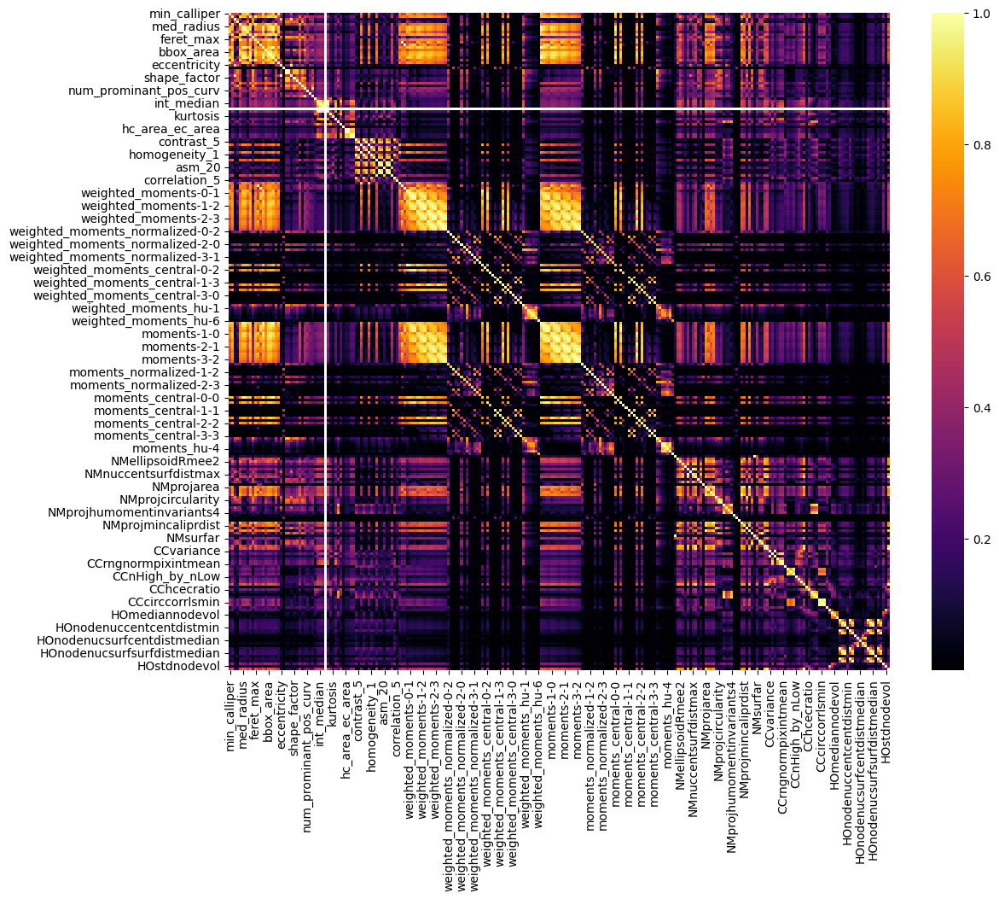

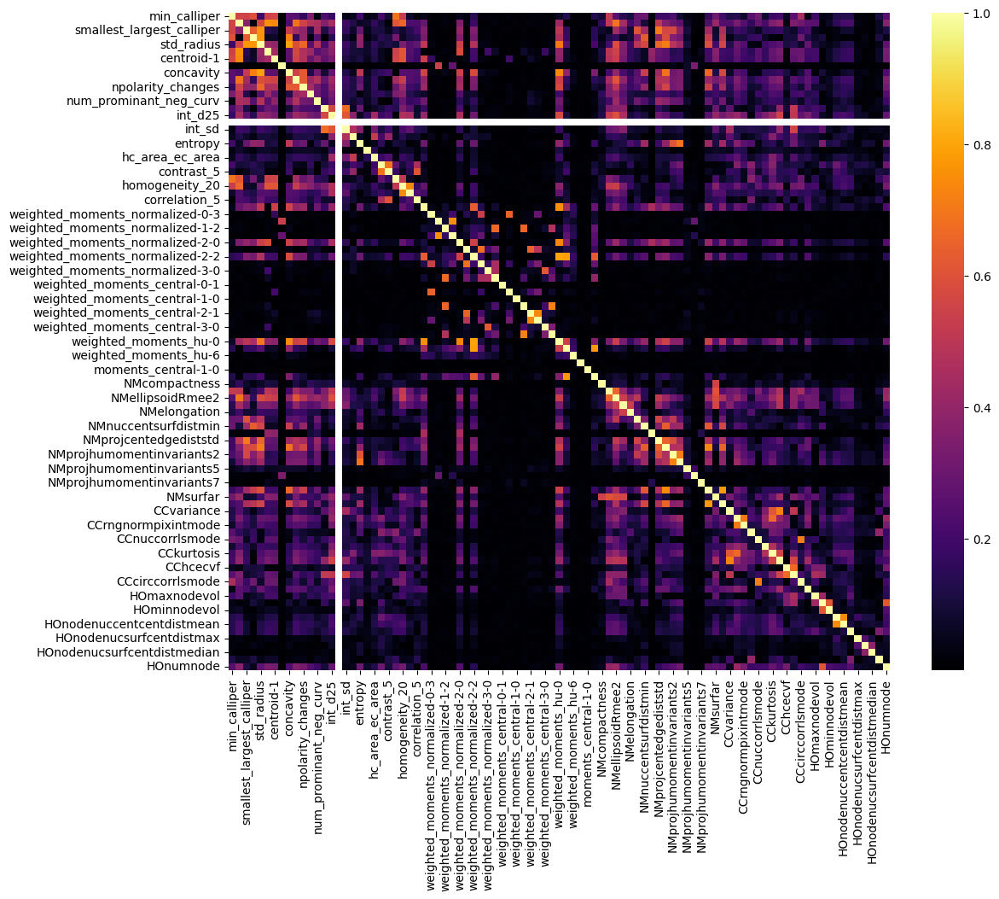

In [12]:
correl_df=nmco_features_filtered_live.drop(['Unnamed: 0','mean_draq_int','patient_id','constriction_size',
                                            'disease','disease_constric','patient_id_constric',
                                           'quality_check','live_dead_test','% Live Dead'],axis=1)

corr_matrix = correl_df.corr().abs()
fig, ax_nstd = plt.subplots(figsize=(12.5, 10))
dataplot = sns.heatmap(corr_matrix, cmap="inferno", annot=False)
plt.show()


upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.8)]

nmco_features_filtered_live_decor = nmco_features_filtered_live.drop(to_drop, axis=1)
nmco_features_filtered_live_decor = nmco_features_filtered_live_decor.drop('Unnamed: 0', axis=1)
correl_df=nmco_features_filtered_live_decor.drop(['patient_id','mean_draq_int','constriction_size',
                                            'disease','disease_constric','patient_id_constric',
                                           'quality_check','live_dead_test','% Live Dead'],axis=1)

corr_matrix = correl_df.corr().abs()
corr_matrix
fig, ax_nstd = plt.subplots(figsize=(12.5, 10))
dataplot = sns.heatmap(corr_matrix, cmap="inferno", annot=False)
plt.show()




Diabetic_control
['Diabetic_control']
Healthy_control
['Healthy_control']
Prediabetic_control
['Prediabetic_control']


<Figure size 640x480 with 0 Axes>

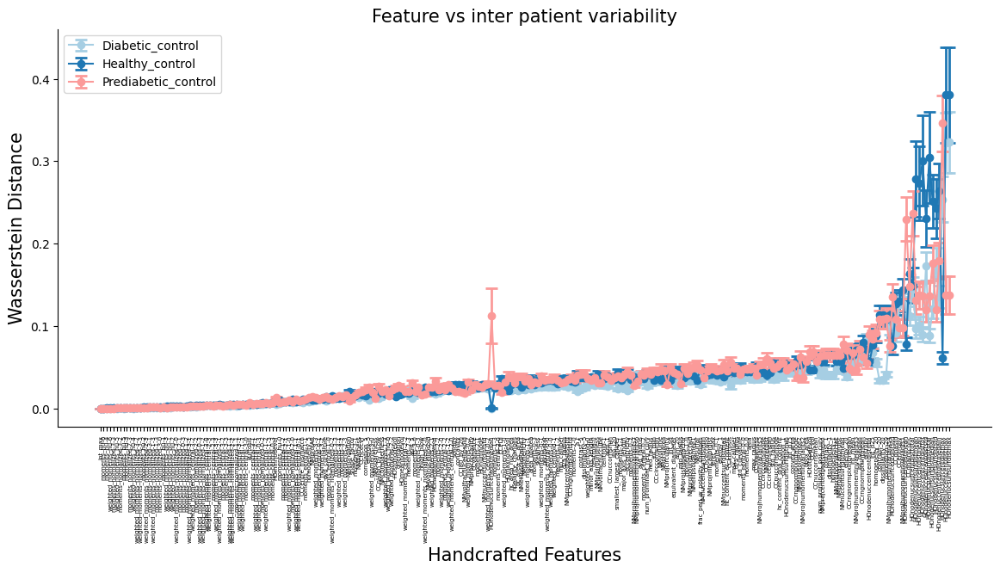

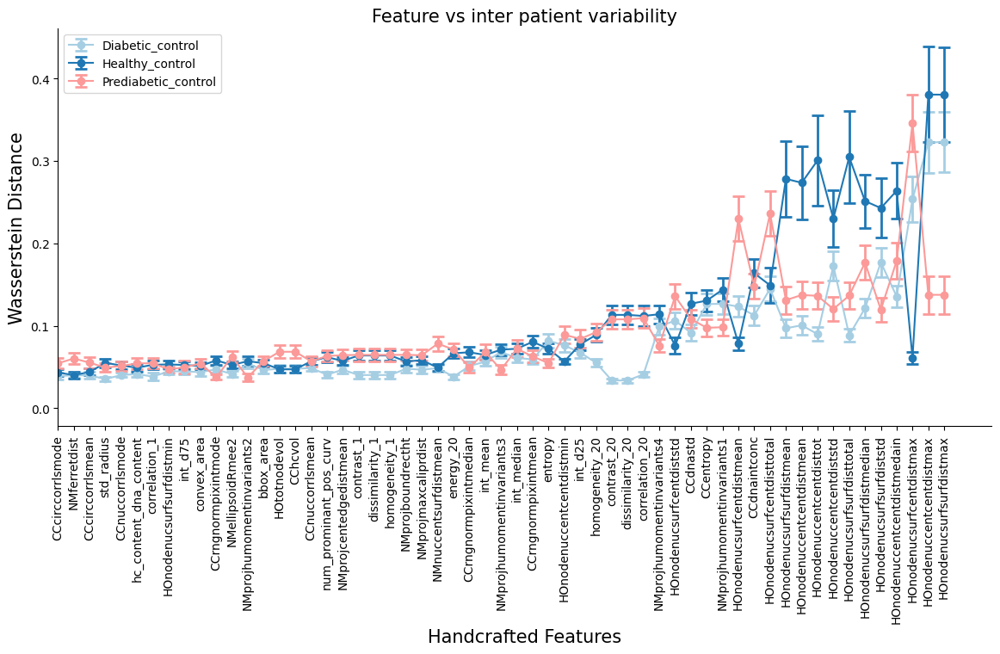

In [13]:
from sklearn.preprocessing import MinMaxScaler
import itertools
from utilities import wasserstein_distance_df



nmco_features_filtered_live_ul=nmco_features_filtered_live.drop(['Unnamed: 0',
                                    'patient_id','disease','disease_constric','disease','patient_id_constric',
                                    'quality_check','live_dead_test','mean_draq_int','constriction_size','% Live Dead',
                                    'mean_draq_int'],axis=1)


scaler = MinMaxScaler()
nmco_features_filtered_live_ul_scaled=scaler.fit_transform(nmco_features_filtered_live_ul)
nmco_features_filtered_live_scaled=pd.DataFrame(nmco_features_filtered_live_ul_scaled,columns=
                                                         nmco_features_filtered_live_ul.columns.values)
nmco_features_filtered_live_scaled['patient_id']=np.asarray(nmco_features_filtered_live['patient_id'])
nmco_features_filtered_live_scaled['disease_constric']=np.asarray(nmco_features_filtered_live['disease_constric'])
nmco_features_filtered_live_scaled['disease']=np.asarray(nmco_features_filtered_live['disease'])
nmco_features_filtered_live_scaled['constriction_size']=np.asarray(nmco_features_filtered_live['constriction_size'])

count=0
wasserstein_df_formatted_final=[]
disease_col=[]
for disease in np.unique(nmco_features_filtered_live_scaled['disease_constric']):
    print(disease)
    disease_data_frames_lev1=nmco_features_filtered_live_scaled[nmco_features_filtered_live_scaled['disease_constric']==disease]
    print(np.unique(disease_data_frames_lev1['disease_constric']))
    number_pats=np.unique(disease_data_frames_lev1['patient_id'])
    combin=list(itertools.combinations(number_pats, 2))
    for a_combin in combin: 
        comb1_df=disease_data_frames_lev1[disease_data_frames_lev1['patient_id']==a_combin[0]]
        comb2_df=disease_data_frames_lev1[disease_data_frames_lev1['patient_id']==a_combin[1]]
        comb1_df=comb1_df.drop(['patient_id','disease_constric','disease','constriction_size'],axis=1)
        comb2_df=comb2_df.drop(['patient_id','disease_constric','disease','constriction_size'],axis=1)
        wasserstein_df=wasserstein_distance_df(comb1_df,comb2_df)
        wasserstein_df_formatted=pd.DataFrame(columns=wasserstein_df['Column'])
        wasserstein_df_formatted.loc[count]=np.asarray(wasserstein_df['Wasserstein Distance'])
        wasserstein_df_formatted_final.append(wasserstein_df_formatted)
        disease_col.append(disease)
        count=count+1
        
wasserstein_df_formatted_final = pd.concat(wasserstein_df_formatted_final, ignore_index=True)
wasserstein_df_formatted_final['disease']=disease_col     
wasserstein_df_formatted_final

paired_palette = sns.color_palette("Paired", n_colors=8)
compressed_palette = [paired_palette[0],paired_palette[6],paired_palette[2],paired_palette[4]]
control_palette = [paired_palette[1],paired_palette[7],paired_palette[3],paired_palette[5]]
both_palette = [paired_palette[0],paired_palette[1],paired_palette[4],paired_palette[5],
                paired_palette[6],paired_palette[7],paired_palette[2],paired_palette[3]]

means_final = wasserstein_df_formatted_final.drop(['disease'],axis=1).mean()
sns.despine()
plt.figure(figsize=(14, 6))
count=0
for disease in np.unique(wasserstein_df_formatted_final['disease']):
    means = wasserstein_df_formatted_final.iloc[np.where(wasserstein_df_formatted_final['disease']
                                                         ==disease)].drop(['disease'],axis=1).mean()
    means = means[np.argsort(means_final)]
    errors = wasserstein_df_formatted_final.iloc[np.where(wasserstein_df_formatted_final['disease']
                                                          ==disease)].drop(['disease'],axis=1).sem()
    errors = errors[np.argsort(means_final)]

    plt.errorbar(x = means.index, y=means, yerr=errors, 
                 fmt='-o', capsize=5, capthick=2, elinewidth=2,color=both_palette[count])
    count=count+1
    

sns.despine()
plt.legend(np.unique(wasserstein_df_formatted_final['disease']))
plt.xlabel('Handcrafted Features',fontsize=15)
plt.xticks(rotation=90,fontsize=5)
plt.ylabel('Wasserstein Distance',fontsize=15)
plt.title('Feature vs inter patient variability',fontsize=15)    
plt.show()

plt.figure(figsize=(14, 6))
count=0
for disease in np.unique(wasserstein_df_formatted_final['disease']):
    means = wasserstein_df_formatted_final.iloc[np.where(wasserstein_df_formatted_final['disease']
                                                         ==disease)].drop(['disease'],axis=1).mean()
    means = means[np.argsort(means_final)]
    errors = wasserstein_df_formatted_final.iloc[np.where(wasserstein_df_formatted_final['disease']
                                                          ==disease)].drop(['disease'],axis=1).sem()
    errors = errors[np.argsort(means_final)]

    plt.errorbar(x = means.index, y=means, yerr=errors, 
                 fmt='-o', capsize=5, capthick=2, elinewidth=2,color=both_palette[count])
    count=count+1
    
sns.despine()
plt.xlim(200,259)
plt.legend(np.unique(wasserstein_df_formatted_final['disease']))
plt.xlabel('Handcrafted Features',fontsize=15)
plt.xticks(rotation=90,fontsize=10)
plt.ylabel('Wasserstein Distance',fontsize=15)
plt.title('Feature vs inter patient variability',fontsize=15)    
plt.show()


In [14]:
wasserstein_df_formatted_final

Column,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnodenucsurfsurfdistmax,HOnodenucsurfsurfdistmean,HOnodenucsurfsurfdistmedian,HOnodenucsurfsurfdistmin,HOnodenucsurfsurfdiststd,HOnodenucsurfsurfdisttotal,HOnumnode,HOstdnodevol,HOtotnodevol,disease
0,0.014976,0.014918,0.014683,0.022504,0.010355,0.017019,0.017660,0.018947,0.016279,0.013004,...,0.013499,0.034014,0.011886,0.056191,0.043692,0.020371,0.006590,0.019779,0.041266,Diabetic_control
1,0.019741,0.047328,0.048211,0.040154,0.053392,0.031884,0.032786,0.021161,0.045721,0.065727,...,0.678447,0.017239,0.225913,0.046937,0.346491,0.010324,0.012996,0.016589,0.038958,Diabetic_control
2,0.030576,0.051827,0.036525,0.033260,0.055534,0.041093,0.041738,0.025252,0.052034,0.058194,...,0.678447,0.131862,0.055492,0.085636,0.396717,0.078973,0.020991,0.009090,0.023487,Diabetic_control
3,0.054386,0.041195,0.022613,0.051546,0.032577,0.051447,0.051975,0.053814,0.045526,0.011228,...,0.678447,0.052522,0.158037,0.053545,0.319251,0.031456,0.010768,0.027365,0.087755,Diabetic_control
4,0.008179,0.019625,0.026799,0.031460,0.025178,0.010589,0.011306,0.015565,0.018203,0.038671,...,0.678447,0.248117,0.109922,0.057792,0.284581,0.148597,0.019185,0.015921,0.029750,Diabetic_control
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113,0.053700,0.076785,0.053456,0.052084,0.077776,0.074100,0.071871,0.058576,0.078767,0.077231,...,0.000000,0.123672,0.119799,0.028858,0.032915,0.083974,0.049917,0.052757,0.160409,Prediabetic_control
114,0.013215,0.015580,0.015740,0.017617,0.014214,0.019762,0.018905,0.015629,0.018096,0.015883,...,0.000000,0.181913,0.250286,0.044499,0.054089,0.123520,0.014765,0.010905,0.021977,Prediabetic_control
115,0.016521,0.007228,0.033517,0.029805,0.008582,0.008043,0.009082,0.014935,0.007811,0.020683,...,0.000000,0.060428,0.105125,0.041808,0.028765,0.041031,0.006579,0.010982,0.062215,Prediabetic_control
116,0.038778,0.071014,0.078454,0.043105,0.071795,0.057679,0.056640,0.042148,0.069185,0.081711,...,0.000000,0.007092,0.025385,0.025383,0.008823,0.004815,0.043596,0.035546,0.079461,Prediabetic_control


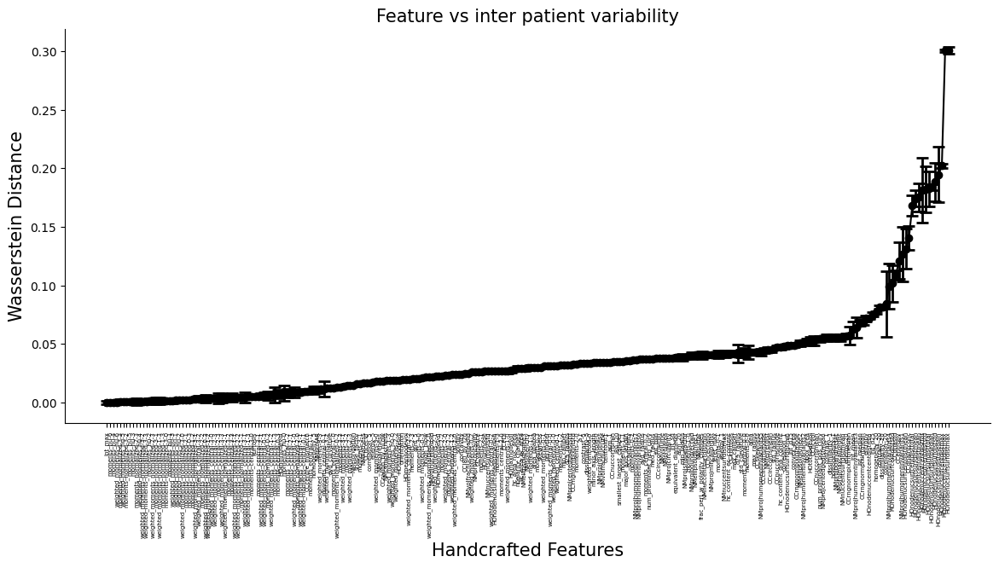

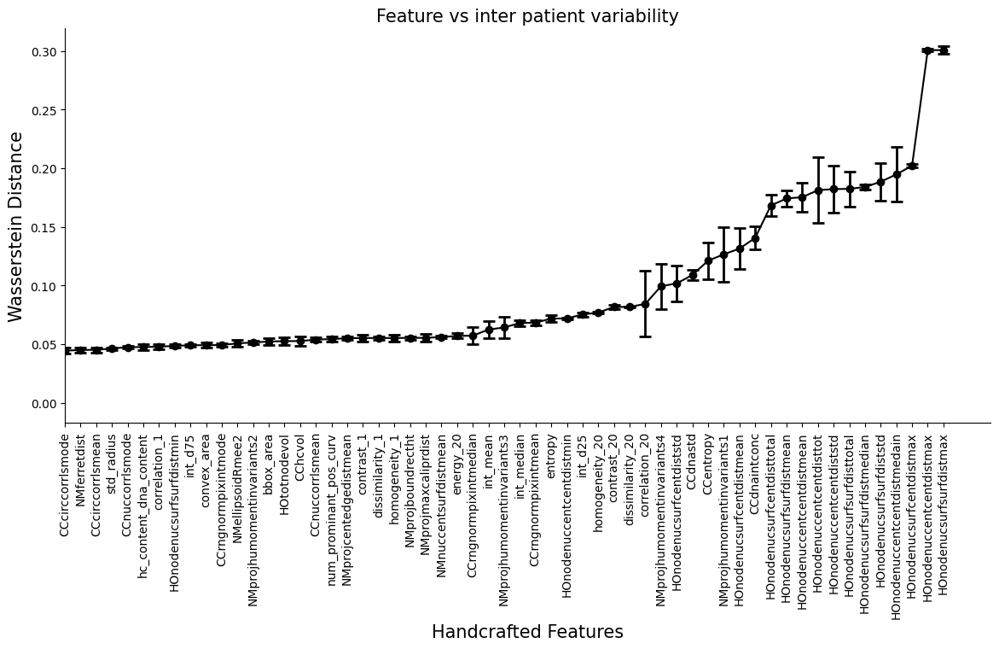

In [15]:
paired_palette = sns.color_palette("Paired", n_colors=8)
compressed_palette = [paired_palette[0],paired_palette[6],paired_palette[2],paired_palette[4]]
control_palette = [paired_palette[1],paired_palette[7],paired_palette[3],paired_palette[5]]
both_palette = [paired_palette[0],paired_palette[1],paired_palette[4],paired_palette[5],
                paired_palette[6],paired_palette[7],paired_palette[2],paired_palette[3]]

means_final = wasserstein_df_formatted_final.drop(['disease'],axis=1).mean()
means_final = means_final[np.argsort(means_final)]
errors_final = wasserstein_df_formatted_final.drop(['disease'],axis=1).sem()
errors_final = errors_final[np.argsort(means_final)]

plt.figure(figsize=(14, 6))
plt.errorbar(x = means_final.index, y = means_final, yerr=errors_final, 
                 fmt='-o', capsize=5, capthick=2, elinewidth=2,color="black")
    
plt.xlabel('Handcrafted Features',fontsize=15)
plt.xticks(rotation=90,fontsize=5)
plt.ylabel('Wasserstein Distance',fontsize=15)
plt.title('Feature vs inter patient variability',fontsize=15)    
sns.despine()
plt.show()

plt.figure(figsize=(14, 6))
plt.errorbar(x = means_final.index, y = means_final, yerr=errors_final, 
                 fmt='-o', capsize=5, capthick=2, elinewidth=2,color="black")
sns.despine()    
plt.xlim(200,259)
plt.xlabel('Handcrafted Features',fontsize=15)
plt.xticks(rotation=90,fontsize=10)
plt.ylabel('Wasserstein Distance',fontsize=15)
plt.title('Feature vs inter patient variability',fontsize=15)    
plt.show()


In [16]:
columns_to_remove=means_final[means_final>0.06].index
list_1 = columns_to_remove.tolist()
list_2 = to_drop
intersection_of_two = list(set(list_1) & set(list_2)) 


In [17]:
columns_to_remove=means_final[means_final>0.09].index
columns_to_remove_1=list(columns_to_remove)#+to_drop
nmco_features_filtered_live_ul_non_rep=nmco_features_filtered_live_ul#.drop(columns=intersection_of_two)
nmco_features_filtered_live_ul_non_rep
#intersection_of_two = intersection_of_two+['mean_draq_int']
intersection_of_two = ['mean_draq_int']
intersection_of_two
nmco_features_filtered_live_non_rep=nmco_features_filtered_live.drop(columns=intersection_of_two)
nmco_features_filtered_live_non_rep


,Unnamed: 0,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,...,HOstdnodevol,HOtotnodevol,patient_id,constriction_size,disease,disease_constric,patient_id_constric,quality_check,live_dead_test,% Live Dead
54497,54497,18,21,0.857143,6.979551,10.683215,9.015610,8.934762,8.461921,9.329759,...,2.8685,23.0625,80,control,Diabetic,Diabetic_control,80_control,False,live,1
19133,19133,21,25,0.840000,5.264040,12.794040,10.263480,9.829257,9.113975,10.974626,...,4.2626,23.3125,46,control,Diabetic,Diabetic_control,46_control,False,live,1
20533,20533,19,22,0.863636,8.083441,10.762993,9.583424,9.547111,9.174712,9.870428,...,2.6607,20.6250,46,control,Diabetic,Diabetic_control,46_control,False,live,1
36748,36748,17,23,0.739130,5.377937,11.894955,9.327705,9.354465,8.590049,10.633779,...,11.6553,20.3750,35,control,Diabetic,Diabetic_control,35_control,False,live,1
19365,19365,18,23,0.782609,6.973469,11.274053,9.662808,9.461859,8.335485,10.559114,...,4.4947,19.1250,46,control,Diabetic,Diabetic_control,46_control,False,live,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37898,37898,16,23,0.695652,6.355464,11.317482,8.806850,8.736037,7.545655,9.711553,...,2.2258,20.0625,37,control,Prediabetic,Prediabetic_control,37_control,False,live,1
55491,55491,15,19,0.789474,6.369901,8.857498,7.833384,7.788821,7.408292,8.377889,...,3.1815,9.0000,82,control,Prediabetic,Prediabetic_control,82_control,False,live,1
40759,40759,16,19,0.842105,6.159579,9.466861,8.302517,8.202241,7.988138,8.607600,...,4.6040,11.3750,45,control,Prediabetic,Prediabetic_control,45_control,False,live,1
41755,41755,17,20,0.850000,7.365328,9.361704,8.453453,8.383671,8.030220,8.777887,...,3.3466,11.5000,45,control,Prediabetic,Prediabetic_control,45_control,False,live,1


In [18]:
nmco_features_filtered_live_ul_non_rep

,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnodenucsurfcentdisttotal,HOnodenucsurfsurfdistmax,HOnodenucsurfsurfdistmean,HOnodenucsurfsurfdistmedian,HOnodenucsurfsurfdistmin,HOnodenucsurfsurfdiststd,HOnodenucsurfsurfdisttotal,HOnumnode,HOstdnodevol,HOtotnodevol
54497,18,21,0.857143,6.979551,10.683215,9.015610,8.934762,8.461921,9.329759,0.819285,...,41.8590,14.1704,5.8418,5.2484,0.939550,3.1920,1039.8384,11,2.8685,23.0625
19133,21,25,0.840000,5.264040,12.794040,10.263480,9.829257,9.113975,10.974626,1.642257,...,28.6986,18.0063,5.6840,4.1578,0.444850,3.9745,892.3923,10,4.2626,23.3125
20533,19,22,0.863636,8.083441,10.762993,9.583424,9.547111,9.174712,9.870428,0.585522,...,53.2904,18.0063,5.6063,4.4362,0.516990,4.0505,880.1915,9,2.6607,20.6250
36748,17,23,0.739130,5.377937,11.894955,9.327705,9.354465,8.590049,10.633779,1.667031,...,21.7574,12.1116,5.5357,5.4185,0.352180,2.6838,869.1025,3,11.6553,20.3750
19365,18,23,0.782609,6.973469,11.274053,9.662808,9.461859,8.335485,10.559114,1.256396,...,28.8858,18.0063,5.9641,5.3746,0.232330,3.8933,936.3648,9,4.4947,19.1250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37898,16,23,0.695652,6.355464,11.317482,8.806850,8.736037,7.545655,9.711553,1.297886,...,53.5548,12.1116,4.7763,4.1919,0.188320,2.5168,749.8744,6,2.2258,20.0625
55491,15,19,0.789474,6.369901,8.857498,7.833384,7.788821,7.408292,8.377889,0.678280,...,49.4970,14.1704,5.8154,5.2484,0.067471,3.2030,1035.1467,7,3.1815,9.0000
40759,16,19,0.842105,6.159579,9.466861,8.302517,8.202241,7.988138,8.607600,0.660177,...,23.2728,12.1116,4.8961,4.2324,0.357010,2.6259,768.6902,5,4.6040,11.3750
41755,17,20,0.850000,7.365328,9.361704,8.453453,8.383671,8.030220,8.777887,0.511570,...,31.5501,12.1116,4.8371,4.1919,0.377780,2.5719,759.4319,5,3.3466,11.5000


In [19]:
nmco_features_filtered_live_non_rep.columns.tolist()

['Unnamed: 0',
 'min_calliper',
 'max_calliper',
 'smallest_largest_calliper',
 'min_radius',
 'max_radius',
 'med_radius',
 'avg_radius',
 'd25_radius',
 'd75_radius',
 'std_radius',
 'feret_max',
 'centroid-0',
 'centroid-1',
 'area',
 'perimeter',
 'bbox_area',
 'convex_area',
 'equivalent_diameter',
 'major_axis_length',
 'minor_axis_length',
 'eccentricity',
 'orientation',
 'concavity',
 'solidity',
 'a_r',
 'shape_factor',
 'area_bbarea',
 'avg_curvature',
 'std_curvature',
 'npolarity_changes',
 'num_prominant_pos_curv',
 'num_prominant_neg_curv',
 'frac_peri_w_polarity_changes',
 'int_min',
 'int_d25',
 'int_median',
 'int_d75',
 'int_max',
 'int_mean',
 'int_sd',
 'kurtosis',
 'skewness',
 'entropy',
 'i80_i20',
 'nhigh_nlow',
 'hc_area_ec_area',
 'hc_area_nuc_area',
 'hc_content_ec_content',
 'hc_content_dna_content',
 'contrast_1',
 'contrast_5',
 'contrast_20',
 'dissimilarity_1',
 'dissimilarity_5',
 'dissimilarity_20',
 'homogeneity_1',
 'homogeneity_5',
 'homogeneity_20

In [20]:
from sklearn.preprocessing import MinMaxScaler

nmco_features_filtered_live_sorted=nmco_features_filtered_live_non_rep
nmco_features_filtered_live_sorted_unlabelled=nmco_features_filtered_live_sorted.drop(['Unnamed: 0','patient_id','constriction_size','disease'
                                                                                       ,'disease_constric','patient_id_constric','quality_check','live_dead_test','% Live Dead'],axis=1)
nmco_features_filtered_live_sorted_unlabelled
scaler = MinMaxScaler()
nmco_features_filtered_live_scaled=scaler.fit_transform(nmco_features_filtered_live_sorted_unlabelled)
nmco_features_filtered_live_scaled_unlabelled=pd.DataFrame(nmco_features_filtered_live_scaled,columns=nmco_features_filtered_live_sorted_unlabelled.columns.values)
nmco_features_filtered_live_scaled_unlabelled
nmco_features_filtered_live_scaled_labelled=nmco_features_filtered_live_scaled_unlabelled.copy()
nmco_features_filtered_live_scaled_labelled['patient_id']=nmco_features_filtered_live['patient_id'].reset_index(drop=True).astype(str)
nmco_features_filtered_live_scaled_labelled['constriction_size']=nmco_features_filtered_live['constriction_size'].reset_index(drop=True).astype(str)
nmco_features_filtered_live_scaled_labelled['disease']=nmco_features_filtered_live['disease'].reset_index(drop=True).astype(str)
nmco_features_filtered_live_scaled_labelled['disease_constric']=nmco_features_filtered_live_scaled_labelled['disease']+'_'+nmco_features_filtered_live_scaled_labelled['constriction_size']
nmco_features_filtered_live_scaled_labelled['patient_id_constric']=nmco_features_filtered_live_scaled_labelled['patient_id']+'_'+nmco_features_filtered_live_scaled_labelled['constriction_size']




test_data_unlabelled=test_data.drop(['Unnamed: 0','patient_id','constriction_size','disease'
                                                                                       ,'disease_constric','patient_id_constric','quality_check','live_dead_test','% Live Dead'],axis=1)
test_data
scaler = MinMaxScaler()
test_data_unlabelled_scaled=scaler.fit_transform(test_data_unlabelled)
test_data_unlabelled_scaled_unlabelled=pd.DataFrame(test_data_unlabelled_scaled,columns=test_data_unlabelled.columns.values)
test_data_unlabelled_scaled_unlabelled.index = test_data.index
test_data_unlabelled_scaled_labelled=test_data_unlabelled_scaled_unlabelled.copy()
test_data_unlabelled_scaled_labelled['patient_id']=test_data['patient_id'].astype(str)
test_data_unlabelled_scaled_labelled['constriction_size']=test_data['constriction_size'].astype(str)
test_data_unlabelled_scaled_labelled['disease']=test_data['disease'].astype(str)
test_data_unlabelled_scaled_labelled['disease_constric']=test_data['disease']+'_'+test_data['constriction_size']
test_data_unlabelled_scaled_labelled['patient_id_constric']=test_data_unlabelled_scaled_labelled['patient_id']+'_'+test_data_unlabelled_scaled_labelled['constriction_size']

test_data_unlabelled_scaled_labelled

,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnodenucsurfsurfdiststd,HOnodenucsurfsurfdisttotal,HOnumnode,HOstdnodevol,HOtotnodevol,patient_id,constriction_size,disease,disease_constric,patient_id_constric
29789,0.259259,0.393939,0.320773,0.277642,0.370711,0.315819,0.332009,0.254186,0.324565,0.309661,...,0.527631,0.283457,0.219512,0.249995,0.355892,64,control,Diabetic,Diabetic_control,64_control
28407,0.555556,0.424242,0.844796,0.575672,0.340188,0.529341,0.519482,0.556836,0.397682,0.049883,...,0.567915,0.265574,0.219512,0.115917,0.199841,62,control,Diabetic,Diabetic_control,62_control
28394,0.555556,0.454545,0.786894,0.642931,0.368048,0.566736,0.565732,0.616825,0.430644,0.037633,...,0.562234,0.272976,0.219512,0.205129,0.307325,62,control,Diabetic,Diabetic_control,62_control
50990,0.592593,0.454545,0.853938,0.640766,0.358817,0.549329,0.546418,0.587882,0.419357,0.036917,...,0.171853,0.516472,0.121951,0.141925,0.123408,69,control,Diabetic,Diabetic_control,69_control
50934,0.518519,0.484848,0.669565,0.413018,0.440185,0.517460,0.519419,0.504746,0.455969,0.242360,...,0.144416,0.533869,0.292683,0.132330,0.117834,69,control,Diabetic,Diabetic_control,69_control
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56897,0.444444,0.424242,0.634519,0.432793,0.352028,0.477962,0.467862,0.481495,0.395970,0.163881,...,0.205681,0.473592,0.243902,0.197742,0.187898,85,control,Prediabetic,Prediabetic_control,85_control
56526,0.629630,0.575758,0.712399,0.581663,0.469539,0.609868,0.616316,0.626585,0.505137,0.147897,...,0.200904,0.660280,0.341463,0.166765,0.295382,85,control,Prediabetic,Prediabetic_control,85_control
56263,0.481481,0.454545,0.652804,0.499921,0.363354,0.531228,0.505456,0.513277,0.416991,0.122767,...,0.288380,0.547790,0.170732,0.101905,0.125796,85,control,Prediabetic,Prediabetic_control,85_control
57081,0.370370,0.363636,0.592464,0.414839,0.316097,0.398647,0.397430,0.381639,0.339588,0.151500,...,0.173596,0.480507,0.170732,0.108102,0.201433,85,control,Prediabetic,Prediabetic_control,85_control


In [21]:
test_data

,Unnamed: 0,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,...,HOstdnodevol,HOtotnodevol,patient_id,constriction_size,disease,disease_constric,patient_id_constric,quality_check,live_dead_test,% Live Dead
29789,29789,11,21,0.523810,3.954842,11.092996,6.785504,7.037130,5.129078,8.603492,...,4.6638,34.1250,64,control,Diabetic,Diabetic_control,64_control,False,live,1
28407,28407,19,22,0.863636,8.055950,10.461987,9.548261,9.491650,9.071803,9.856296,...,2.1625,21.8750,62,control,Diabetic,Diabetic_control,62_control,False,live,1
28394,28394,19,23,0.826087,8.981486,11.037945,10.032107,10.097190,9.853307,10.421072,...,3.8268,30.3125,62,control,Diabetic,Diabetic_control,62_control,False,live,1
50990,50990,20,23,0.869565,8.951686,10.847118,9.806881,9.844320,9.476248,10.227679,...,2.6477,15.8750,69,control,Diabetic,Diabetic_control,69_control,False,live,1
50934,50934,18,24,0.750000,5.817721,12.529273,9.394537,9.490831,8.393212,10.854988,...,2.4687,15.4375,69,control,Diabetic,Diabetic_control,69_control,False,live,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56897,56897,16,22,0.727273,6.089832,10.706764,8.883470,8.815811,8.090312,9.826965,...,3.6890,20.9375,85,control,Prediabetic,Prediabetic_control,85_control,False,live,1
56526,56526,21,27,0.777778,8.138388,13.136121,10.590197,10.759481,9.980445,11.697453,...,3.1111,29.3750,85,control,Prediabetic,Prediabetic_control,85_control,False,live,1
56263,56263,17,23,0.739130,7.013566,10.940915,9.572672,9.308023,8.504350,10.187143,...,1.9011,16.0625,85,control,Prediabetic,Prediabetic_control,85_control,False,live,1
57081,57081,14,20,0.700000,5.842768,9.963943,7.857216,7.893662,6.789457,8.860908,...,2.0167,22.0000,85,control,Prediabetic,Prediabetic_control,85_control,False,live,1


In [22]:
test_data_unlabelled_scaled_labelled

,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnodenucsurfsurfdiststd,HOnodenucsurfsurfdisttotal,HOnumnode,HOstdnodevol,HOtotnodevol,patient_id,constriction_size,disease,disease_constric,patient_id_constric
29789,0.259259,0.393939,0.320773,0.277642,0.370711,0.315819,0.332009,0.254186,0.324565,0.309661,...,0.527631,0.283457,0.219512,0.249995,0.355892,64,control,Diabetic,Diabetic_control,64_control
28407,0.555556,0.424242,0.844796,0.575672,0.340188,0.529341,0.519482,0.556836,0.397682,0.049883,...,0.567915,0.265574,0.219512,0.115917,0.199841,62,control,Diabetic,Diabetic_control,62_control
28394,0.555556,0.454545,0.786894,0.642931,0.368048,0.566736,0.565732,0.616825,0.430644,0.037633,...,0.562234,0.272976,0.219512,0.205129,0.307325,62,control,Diabetic,Diabetic_control,62_control
50990,0.592593,0.454545,0.853938,0.640766,0.358817,0.549329,0.546418,0.587882,0.419357,0.036917,...,0.171853,0.516472,0.121951,0.141925,0.123408,69,control,Diabetic,Diabetic_control,69_control
50934,0.518519,0.484848,0.669565,0.413018,0.440185,0.517460,0.519419,0.504746,0.455969,0.242360,...,0.144416,0.533869,0.292683,0.132330,0.117834,69,control,Diabetic,Diabetic_control,69_control
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56897,0.444444,0.424242,0.634519,0.432793,0.352028,0.477962,0.467862,0.481495,0.395970,0.163881,...,0.205681,0.473592,0.243902,0.197742,0.187898,85,control,Prediabetic,Prediabetic_control,85_control
56526,0.629630,0.575758,0.712399,0.581663,0.469539,0.609868,0.616316,0.626585,0.505137,0.147897,...,0.200904,0.660280,0.341463,0.166765,0.295382,85,control,Prediabetic,Prediabetic_control,85_control
56263,0.481481,0.454545,0.652804,0.499921,0.363354,0.531228,0.505456,0.513277,0.416991,0.122767,...,0.288380,0.547790,0.170732,0.101905,0.125796,85,control,Prediabetic,Prediabetic_control,85_control
57081,0.370370,0.363636,0.592464,0.414839,0.316097,0.398647,0.397430,0.381639,0.339588,0.151500,...,0.173596,0.480507,0.170732,0.108102,0.201433,85,control,Prediabetic,Prediabetic_control,85_control


In [23]:
test_data_unlabelled_scaled_unlabelled

,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnodenucsurfcentdisttotal,HOnodenucsurfsurfdistmax,HOnodenucsurfsurfdistmean,HOnodenucsurfsurfdistmedian,HOnodenucsurfsurfdistmin,HOnodenucsurfsurfdiststd,HOnodenucsurfsurfdisttotal,HOnumnode,HOstdnodevol,HOtotnodevol
29789,0.259259,0.393939,0.320773,0.277642,0.370711,0.315819,0.332009,0.254186,0.324565,0.309661,...,0.137104,0.394157,0.586852,0.561385,0.771960,0.527631,0.283457,0.219512,0.249995,0.355892
28407,0.555556,0.424242,0.844796,0.575672,0.340188,0.529341,0.519482,0.556836,0.397682,0.049883,...,0.107106,0.394157,0.562786,0.707813,0.792817,0.567915,0.265574,0.219512,0.115917,0.199841
28394,0.555556,0.454545,0.786894,0.642931,0.368048,0.566736,0.565732,0.616825,0.430644,0.037633,...,0.159911,0.394157,0.572738,0.707813,0.642160,0.562234,0.272976,0.219512,0.205129,0.307325
50990,0.592593,0.454545,0.853938,0.640766,0.358817,0.549329,0.546418,0.587882,0.419357,0.036917,...,0.359763,0.119283,0.425392,0.420987,0.810005,0.171853,0.516472,0.121951,0.141925,0.123408
50934,0.518519,0.484848,0.669565,0.413018,0.440185,0.517460,0.519419,0.504746,0.455969,0.242360,...,0.295100,0.119283,0.446080,0.420987,0.282392,0.144416,0.533869,0.292683,0.132330,0.117834
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56897,0.444444,0.424242,0.634519,0.432793,0.352028,0.477962,0.467862,0.481495,0.395970,0.163881,...,0.240930,0.119283,0.374427,0.608408,0.148539,0.205681,0.473592,0.243902,0.197742,0.187898
56526,0.629630,0.575758,0.712399,0.581663,0.469539,0.609868,0.616316,0.626585,0.505137,0.147897,...,0.216563,0.119283,0.596321,0.716942,0.223358,0.200904,0.660280,0.341463,0.166765,0.295382
56263,0.481481,0.454545,0.652804,0.499921,0.363354,0.531228,0.505456,0.513277,0.416991,0.122767,...,0.426499,0.119283,0.462606,0.591868,0.259859,0.288380,0.547790,0.170732,0.101905,0.125796
57081,0.370370,0.363636,0.592464,0.414839,0.316097,0.398647,0.397430,0.381639,0.339588,0.151500,...,0.193075,0.119283,0.382690,0.510175,0.175529,0.173596,0.480507,0.170732,0.108102,0.201433


In [411]:
# import umap

# reducer = umap.UMAP(random_state=250,n_neighbors=1000,min_dist=0.8)
# nmco_features_filtered_live_scaled_unlabelled
# embedding = reducer.fit_transform(nmco_features_filtered_live_scaled_unlabelled)
# embedding.shape
# embedding=pd.DataFrame(embedding)
# embedding['patient_id']=nmco_features_filtered_live_scaled_labelled['patient_id']
# embedding['constriction_size']=nmco_features_filtered_live_scaled_labelled['constriction_size']
# embedding['disease']=nmco_features_filtered_live_scaled_labelled['disease']
# embedding['disease_constric']=nmco_features_filtered_live_scaled_labelled['disease_constric']
# embedding['patient_id_constric']=nmco_features_filtered_live_scaled_labelled['patient_id_constric']
# embedding



In [24]:
nmco_features_filtered_live_scaled_labelled['disease'].unique()

array(['Diabetic', 'Healthy', 'Prediabetic'], dtype=object)

In [25]:
latent_list_df_lab_control=nmco_features_filtered_live_scaled_labelled[nmco_features_filtered_live_scaled_labelled['constriction_size']=='control']
latent_list_df_control=nmco_features_filtered_live_scaled_labelled[nmco_features_filtered_live_scaled_labelled['constriction_size']=='control']
latent_list_df_control = latent_list_df_control[latent_list_df_control['disease']!='Hypertension']
latent_list_df_lab_control = latent_list_df_lab_control[latent_list_df_lab_control['disease']!='Hypertension']
latent_list_df_control['disease'].unique()

array(['Diabetic', 'Healthy', 'Prediabetic'], dtype=object)

In [26]:
latent_list_df_control 

,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnodenucsurfsurfdiststd,HOnodenucsurfsurfdisttotal,HOnumnode,HOstdnodevol,HOtotnodevol,patient_id,constriction_size,disease,disease_constric,patient_id_constric
0,0.551724,0.410256,0.847176,0.483124,0.371580,0.512510,0.515036,0.515377,0.454637,0.093798,...,0.507410,0.926261,0.158730,0.137514,0.218700,80,control,Diabetic,Diabetic_control,80_control
1,0.655172,0.512821,0.823256,0.364092,0.462757,0.595565,0.576151,0.561232,0.552338,0.232241,...,0.738413,0.778238,0.142857,0.204346,0.221870,46,control,Diabetic,Diabetic_control,46_control
2,0.586207,0.435897,0.856237,0.559719,0.375026,0.550302,0.556874,0.565503,0.486751,0.054473,...,0.760849,0.765990,0.126984,0.127552,0.187797,46,control,Diabetic,Diabetic_control,46_control
3,0.517241,0.461538,0.682508,0.371995,0.423921,0.533282,0.543712,0.524387,0.532092,0.236409,...,0.357383,0.754858,0.031746,0.558747,0.184628,35,control,Diabetic,Diabetic_control,35_control
4,0.551724,0.461538,0.743175,0.482702,0.397101,0.555586,0.551049,0.506485,0.527657,0.167330,...,0.714442,0.822383,0.126984,0.215473,0.168780,46,control,Diabetic,Diabetic_control,46_control
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19190,0.482759,0.461538,0.621840,0.439822,0.398977,0.498616,0.501459,0.450941,0.477314,0.174310,...,0.308083,0.635164,0.079365,0.106703,0.180666,37,control,Prediabetic,Prediabetic_control,37_control
19191,0.448276,0.358974,0.752754,0.440823,0.292718,0.433825,0.436742,0.441281,0.398098,0.070077,...,0.510657,0.921551,0.095238,0.152519,0.040412,82,control,Prediabetic,Prediabetic_control,82_control
19192,0.482759,0.358974,0.826193,0.426230,0.319039,0.465049,0.464988,0.482058,0.411742,0.067032,...,0.340290,0.654053,0.063492,0.220713,0.070523,45,control,Prediabetic,Prediabetic_control,45_control
19193,0.517241,0.384615,0.837209,0.509892,0.314497,0.475095,0.477384,0.485018,0.421857,0.042033,...,0.324349,0.644758,0.063492,0.160434,0.072108,45,control,Prediabetic,Prediabetic_control,45_control


In [27]:
test_data_unlabelled_scaled_labelled = test_data_unlabelled_scaled_labelled.drop(columns  = 'mean_draq_int' )
test_data = test_data.drop(columns  = 'mean_draq_int' )
test_data_unlabelled_scaled_unlabelled = test_data_unlabelled_scaled_unlabelled.drop(columns  = 'mean_draq_int' )
test_data_unlabelled_scaled_unlabelled

,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnodenucsurfcentdisttotal,HOnodenucsurfsurfdistmax,HOnodenucsurfsurfdistmean,HOnodenucsurfsurfdistmedian,HOnodenucsurfsurfdistmin,HOnodenucsurfsurfdiststd,HOnodenucsurfsurfdisttotal,HOnumnode,HOstdnodevol,HOtotnodevol
29789,0.259259,0.393939,0.320773,0.277642,0.370711,0.315819,0.332009,0.254186,0.324565,0.309661,...,0.137104,0.394157,0.586852,0.561385,0.771960,0.527631,0.283457,0.219512,0.249995,0.355892
28407,0.555556,0.424242,0.844796,0.575672,0.340188,0.529341,0.519482,0.556836,0.397682,0.049883,...,0.107106,0.394157,0.562786,0.707813,0.792817,0.567915,0.265574,0.219512,0.115917,0.199841
28394,0.555556,0.454545,0.786894,0.642931,0.368048,0.566736,0.565732,0.616825,0.430644,0.037633,...,0.159911,0.394157,0.572738,0.707813,0.642160,0.562234,0.272976,0.219512,0.205129,0.307325
50990,0.592593,0.454545,0.853938,0.640766,0.358817,0.549329,0.546418,0.587882,0.419357,0.036917,...,0.359763,0.119283,0.425392,0.420987,0.810005,0.171853,0.516472,0.121951,0.141925,0.123408
50934,0.518519,0.484848,0.669565,0.413018,0.440185,0.517460,0.519419,0.504746,0.455969,0.242360,...,0.295100,0.119283,0.446080,0.420987,0.282392,0.144416,0.533869,0.292683,0.132330,0.117834
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56897,0.444444,0.424242,0.634519,0.432793,0.352028,0.477962,0.467862,0.481495,0.395970,0.163881,...,0.240930,0.119283,0.374427,0.608408,0.148539,0.205681,0.473592,0.243902,0.197742,0.187898
56526,0.629630,0.575758,0.712399,0.581663,0.469539,0.609868,0.616316,0.626585,0.505137,0.147897,...,0.216563,0.119283,0.596321,0.716942,0.223358,0.200904,0.660280,0.341463,0.166765,0.295382
56263,0.481481,0.454545,0.652804,0.499921,0.363354,0.531228,0.505456,0.513277,0.416991,0.122767,...,0.426499,0.119283,0.462606,0.591868,0.259859,0.288380,0.547790,0.170732,0.101905,0.125796
57081,0.370370,0.363636,0.592464,0.414839,0.316097,0.398647,0.397430,0.381639,0.339588,0.151500,...,0.193075,0.119283,0.382690,0.510175,0.175529,0.173596,0.480507,0.170732,0.108102,0.201433


2025-09-25 20:30:10.893361: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758846610.905115 2731077 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758846610.908666 2731077 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1758846610.919290 2731077 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1758846610.919300 2731077 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1758846610.919303 2731077 computation_placer.cc:177] computation placer alr

19195


/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Diabetic


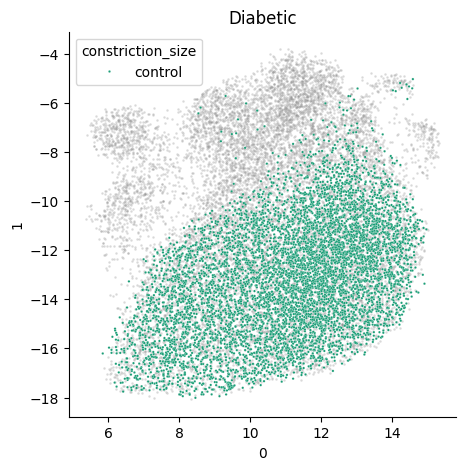

Healthy


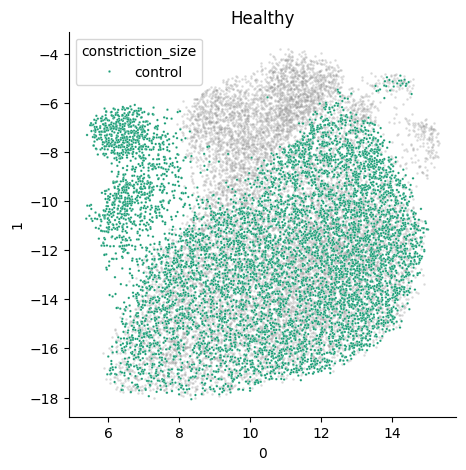

Prediabetic


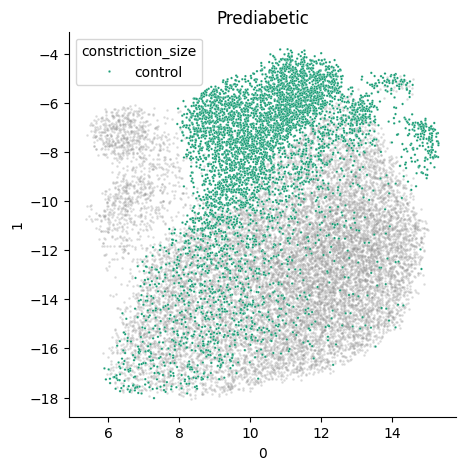

In [28]:
from sklearn.preprocessing import StandardScaler
import umap

reducer = umap.UMAP(random_state=250,n_neighbors=1000,min_dist=0.8)
# latent_list_df_lab_control=nmco_features_filtered_live_scaled_labelled[nmco_features_filtered_live_scaled_labelled['constriction_size']=='control']
# latent_list_df_control=nmco_features_filtered_live_scaled_labelled[nmco_features_filtered_live_scaled_labelled['constriction_size']=='control']
# latent_list_df_control = latent_list_df_control[latent_list_df_control['disease']!='Hypertension']
recon_list_control=[raw_images[i] for i in latent_list_df_control[latent_list_df_control['constriction_size']=='control'].index]
print(len(recon_list_control))

scaled_latent_list_df_lab_control = StandardScaler().fit_transform(latent_list_df_control.drop(columns=['patient_id','constriction_size','disease','disease_constric','patient_id_constric']))

embedding_control = reducer.fit_transform(scaled_latent_list_df_lab_control)
embedding_control.shape
embedding_control=pd.DataFrame(embedding_control)

embedding_control['patient_id']=latent_list_df_lab_control.reset_index()['patient_id']
embedding_control['constriction_size']=latent_list_df_lab_control.reset_index()['constriction_size']
embedding_control['disease']=latent_list_df_lab_control.reset_index()['disease']
embedding_control['disease_constric']=latent_list_df_lab_control.reset_index()['disease_constric']
embedding_control['patient_id_constric']=latent_list_df_lab_control.reset_index()['patient_id_constric']
embedding_control.index = latent_list_df_control.index
for disease in np.unique(embedding_control['disease']):
    print(disease)
    plt.figure(figsize=(5, 5))
    masking_condition=embedding_control['disease']==disease
    sns.scatterplot(data=embedding_control[~masking_condition],x=0,y=1,s=3,color="gray", alpha=0.3)
    sns.scatterplot(data=embedding_control[masking_condition],x=0,y=1,s=3,hue="constriction_size",palette="Dark2")
    sns.despine() 
    plt.title(disease)
    plt.show()



/tmp/ipykernel_2731077/1712939575.py:5: UserWarning: The palette list has more values (4) than needed (3), which may not be intended.
  sns.scatterplot(data=embedding_control,x=0,y=1,s=1,hue="disease",palette=control_palette)


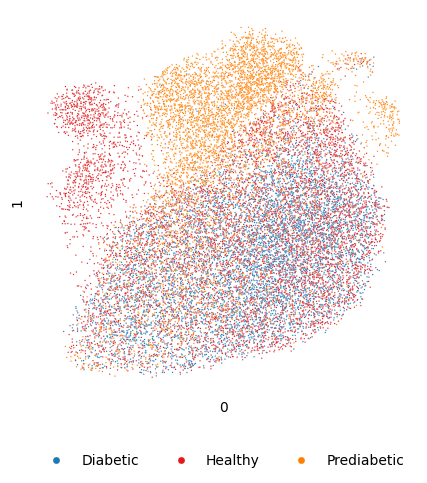

In [29]:
paired_palette = sns.color_palette("Paired", n_colors=8)
control_palette = [paired_palette[1],paired_palette[5],paired_palette[7],paired_palette[3]]

plt.figure(figsize=(5, 5))
sns.scatterplot(data=embedding_control,x=0,y=1,s=1,hue="disease",palette=control_palette)
plt.legend(
    loc='upper center',
    bbox_to_anchor=(0.5, -0.12),  # center horizontally, drop below axes
    ncol=4,                       # spread the handles in one row
    frameon=False,                # optional styling
    title='',                # optional label
    markerscale=5
)
sns.despine(left=True, bottom=True)
plt.xticks([], [])
plt.yticks([], [])
plt.show()

In [30]:
embedding_control

,0,1,patient_id,constriction_size,disease,disease_constric,patient_id_constric
0,11.715540,-12.573468,80,control,Diabetic,Diabetic_control,80_control
1,10.609480,-15.038448,46,control,Diabetic,Diabetic_control,46_control
2,12.057648,-12.128568,46,control,Diabetic,Diabetic_control,46_control
3,11.711122,-12.195323,35,control,Diabetic,Diabetic_control,35_control
4,13.264500,-12.367138,46,control,Diabetic,Diabetic_control,46_control
...,...,...,...,...,...,...,...
19190,9.889993,-9.632205,37,control,Prediabetic,Prediabetic_control,37_control
19191,13.196999,-5.949109,82,control,Prediabetic,Prediabetic_control,82_control
19192,11.013637,-5.868109,45,control,Prediabetic,Prediabetic_control,45_control
19193,10.901270,-5.418889,45,control,Prediabetic,Prediabetic_control,45_control


105


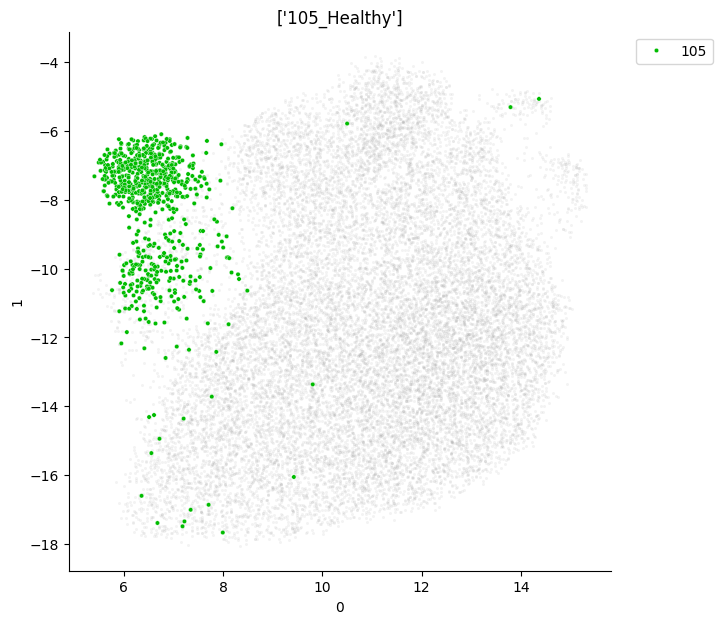

107


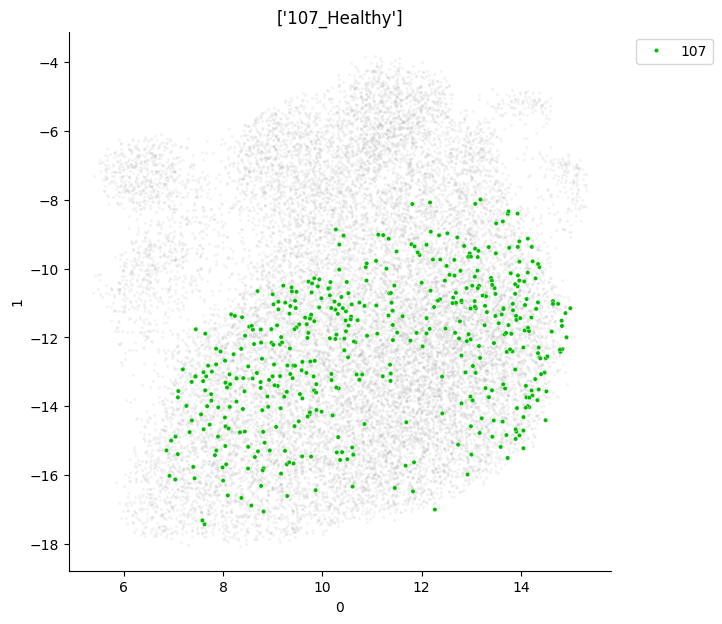

108


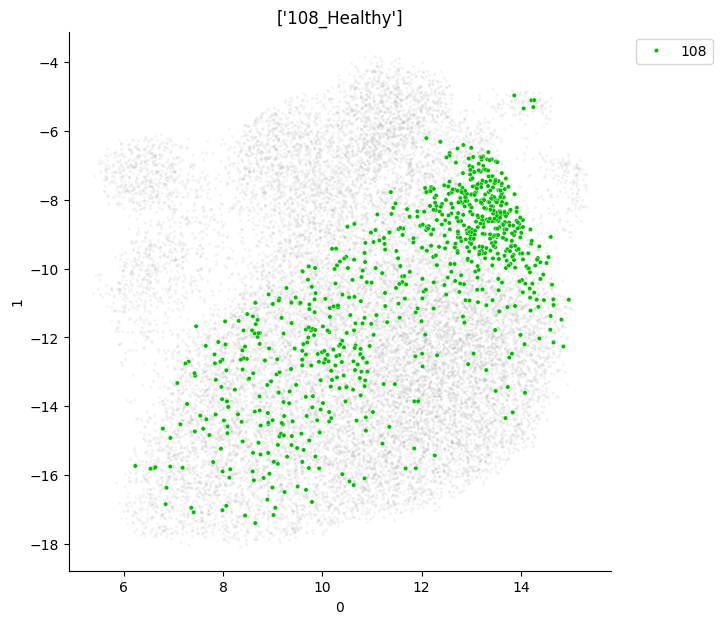

109


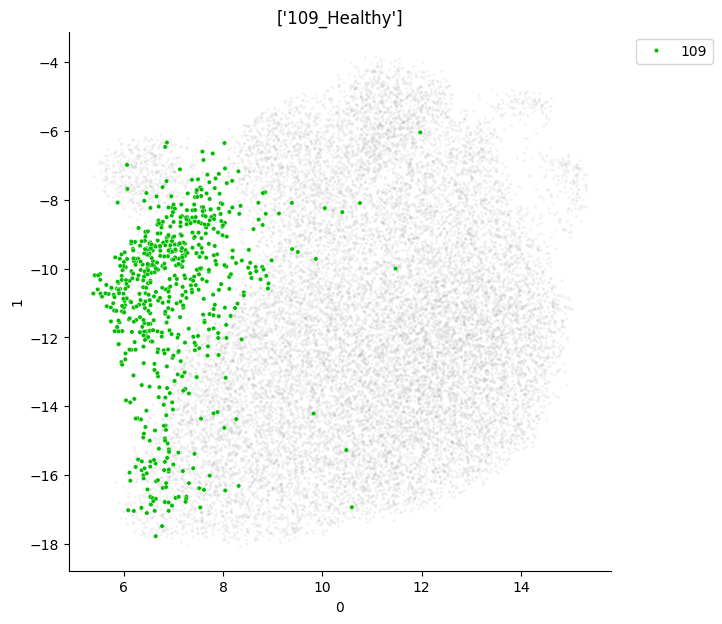

110


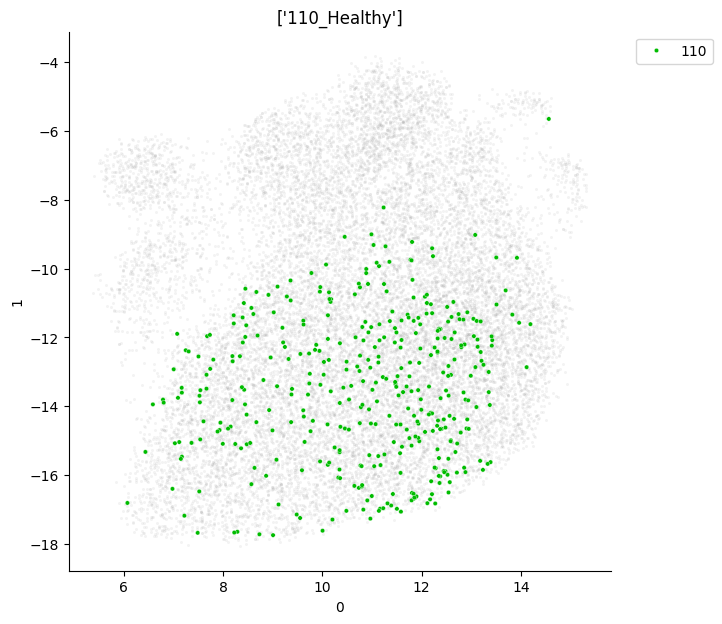

111


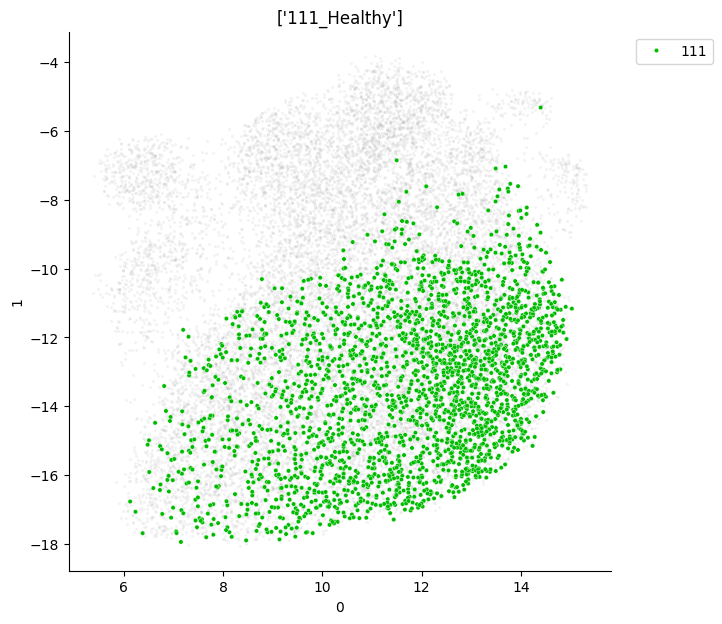

112


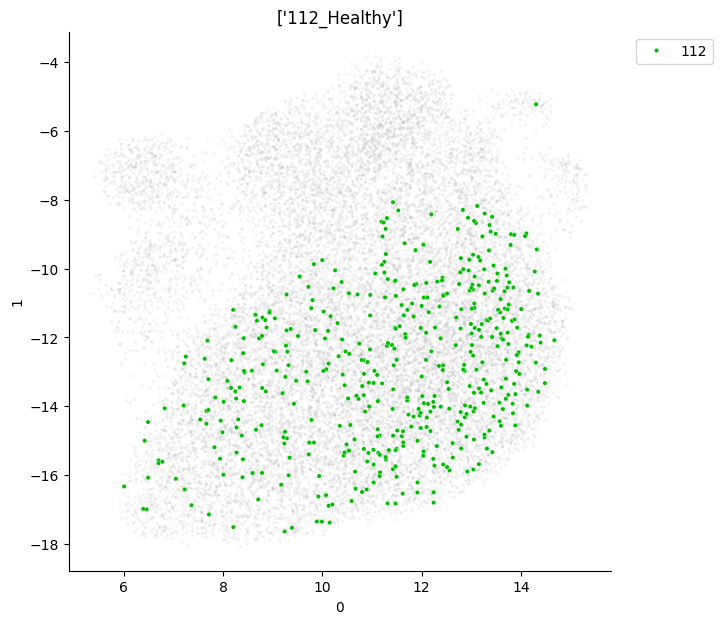

23


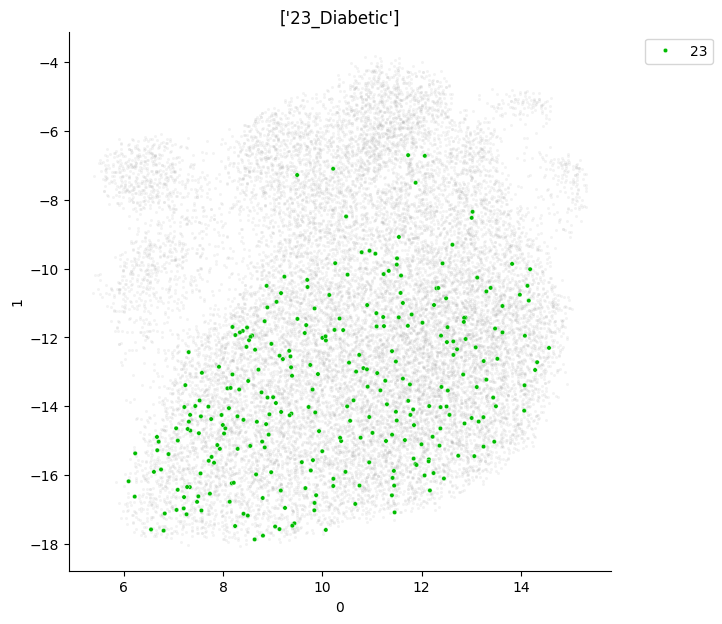

26


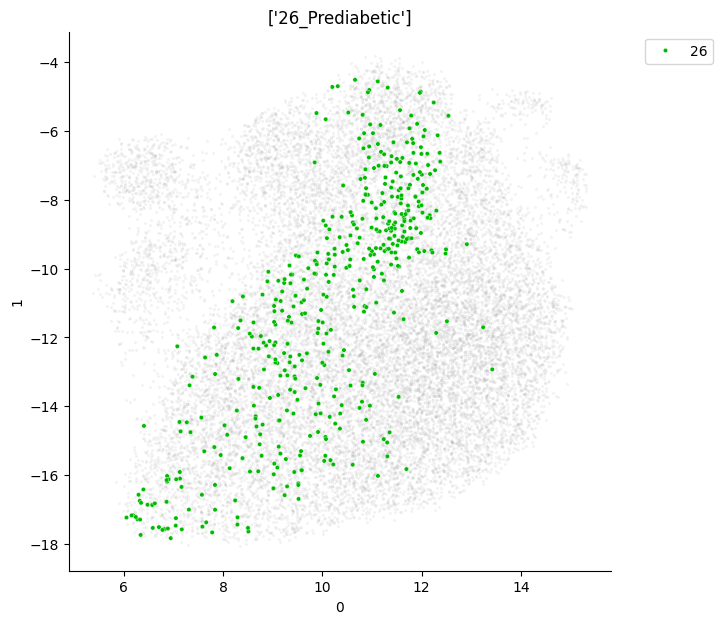

30


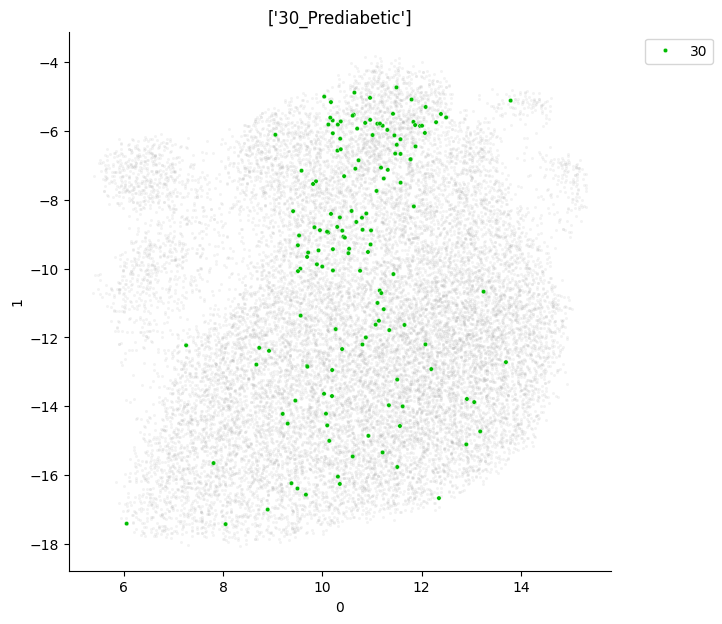

35


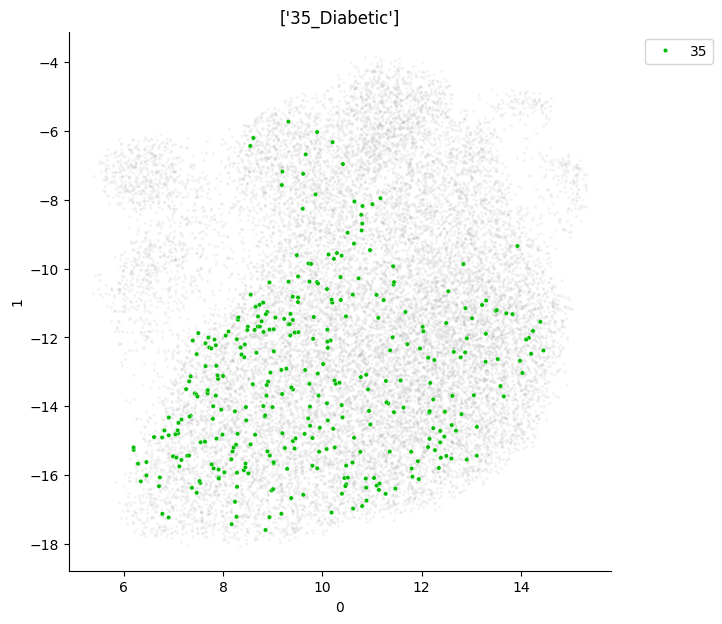

37


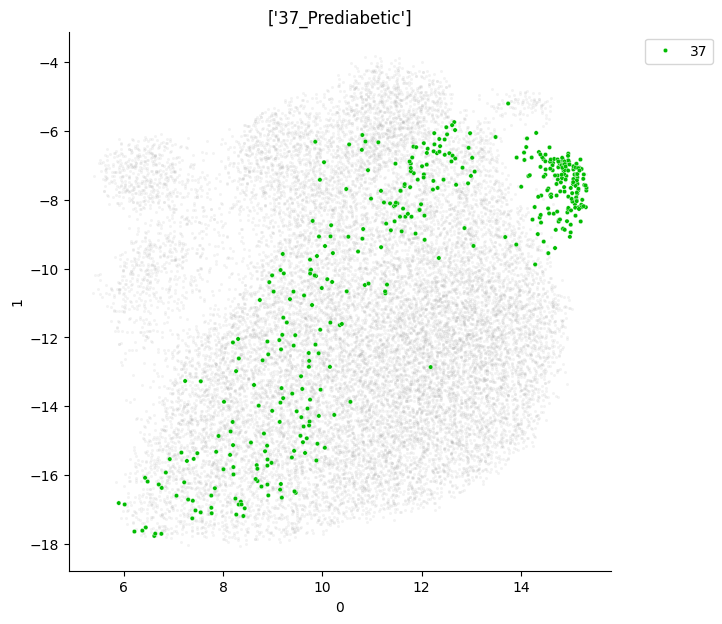

44


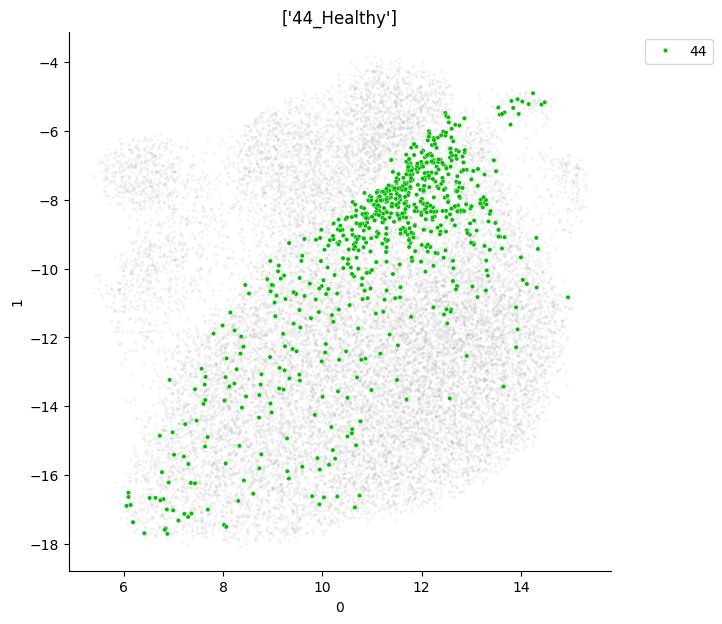

45


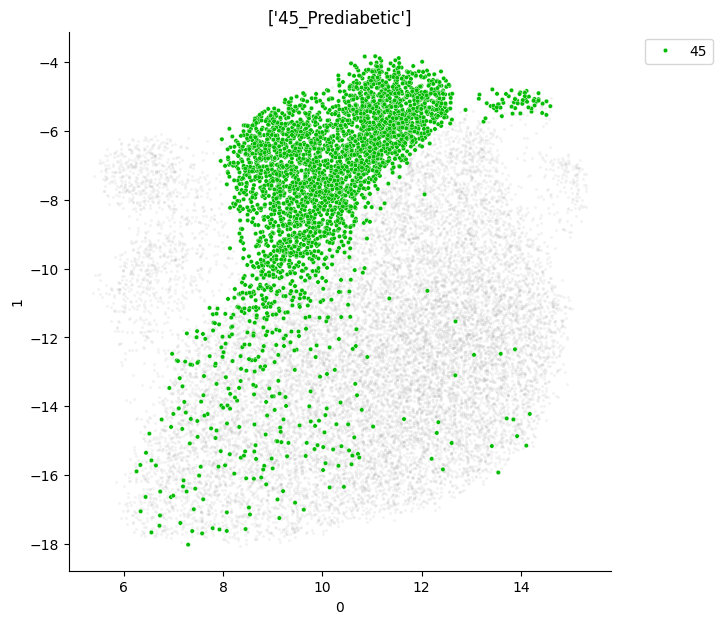

46


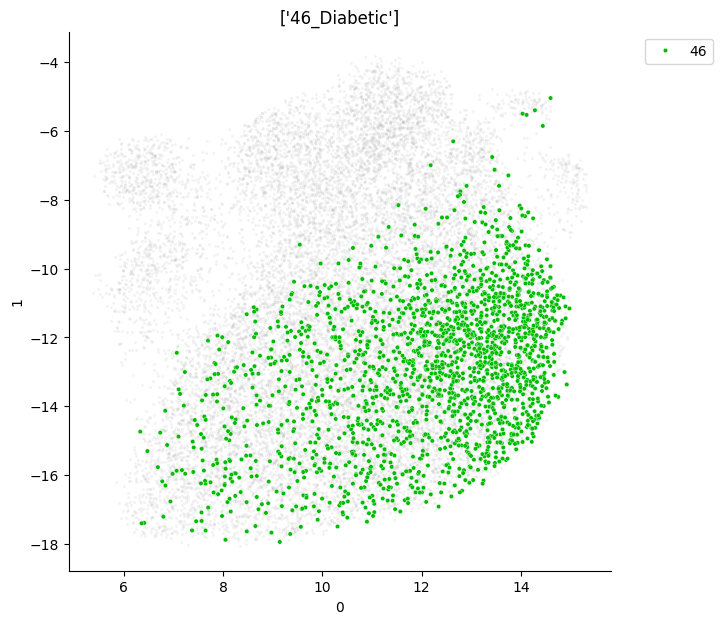

51


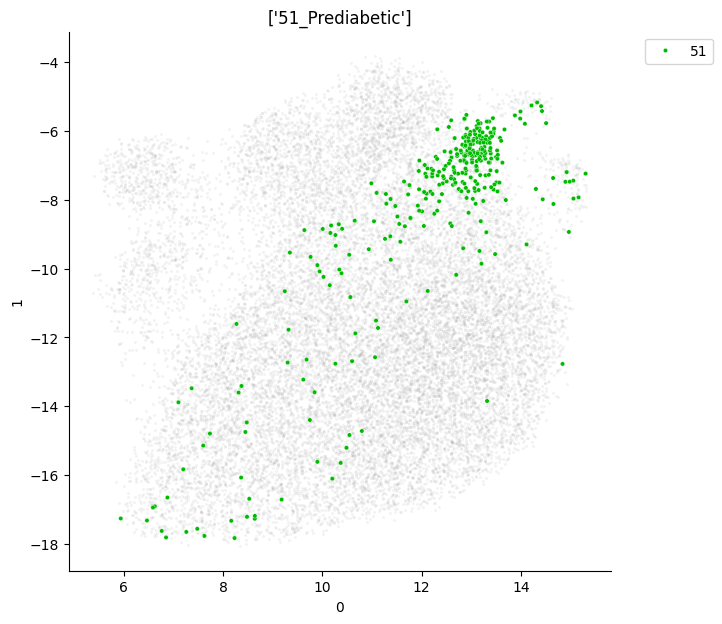

60


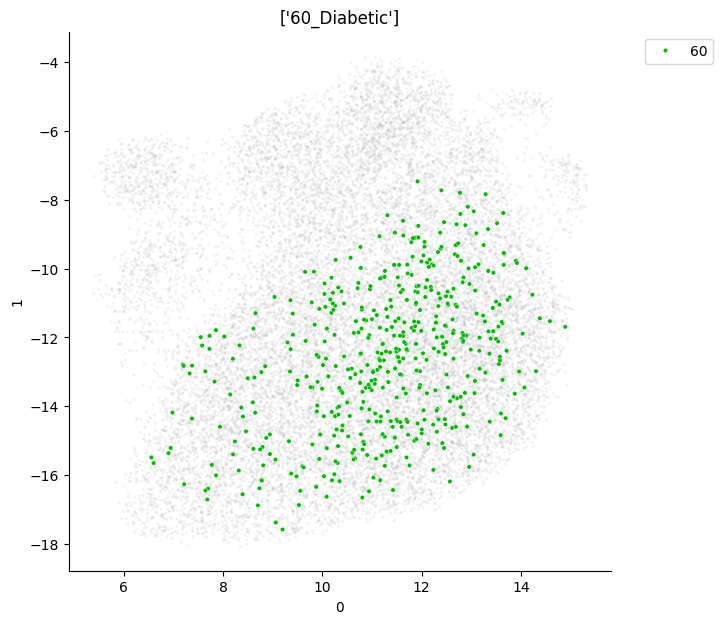

61


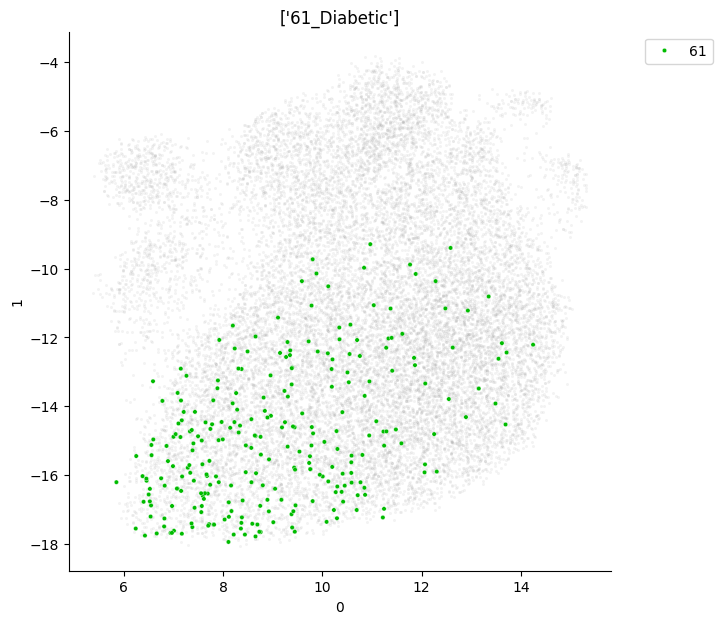

65


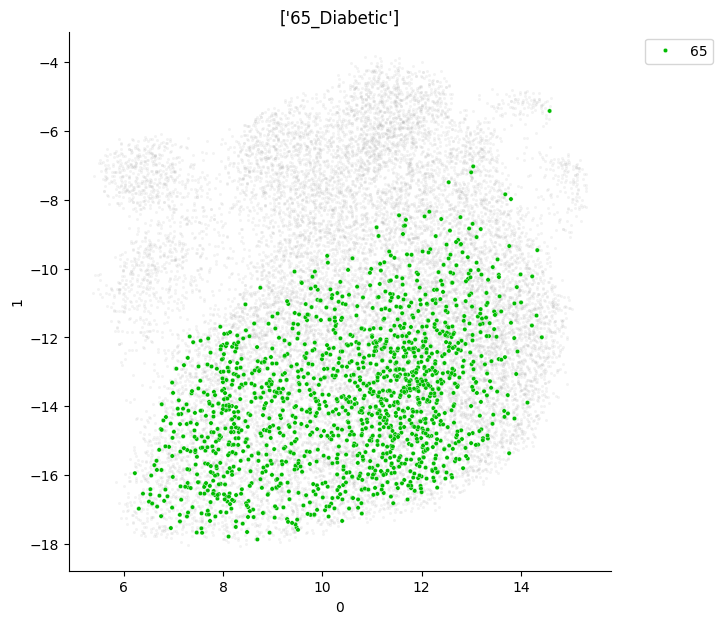

66


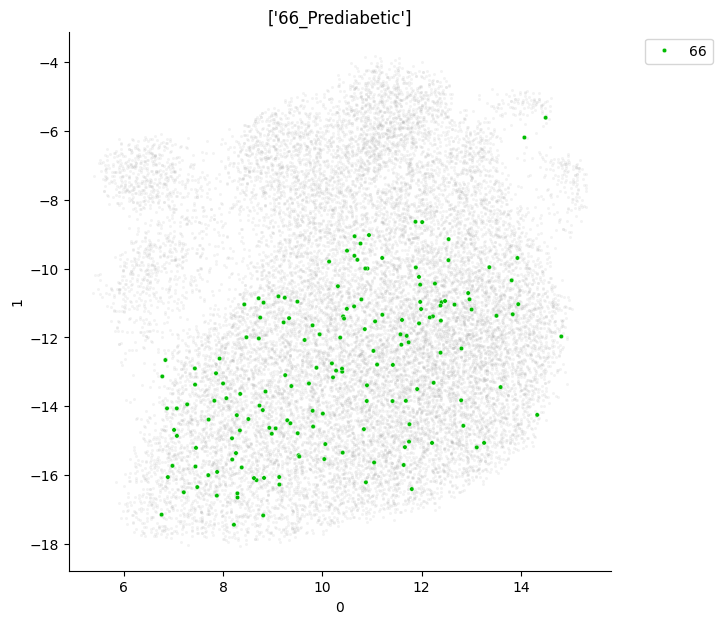

67


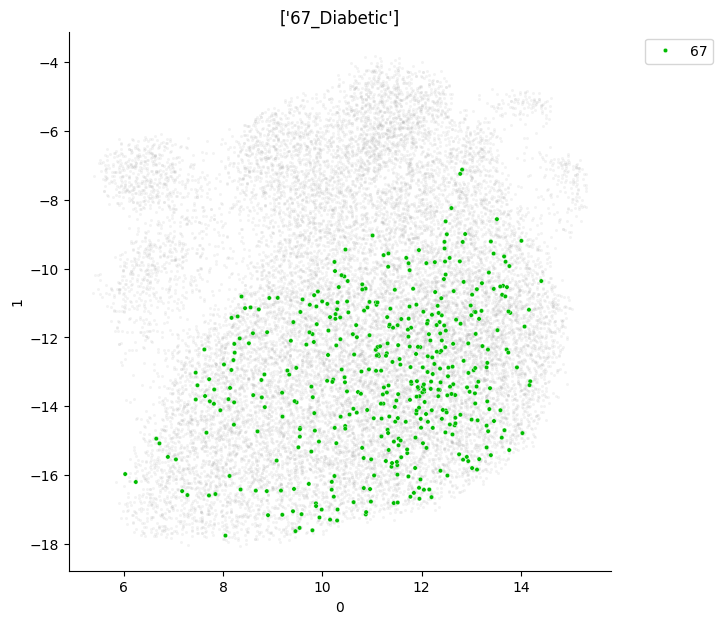

73


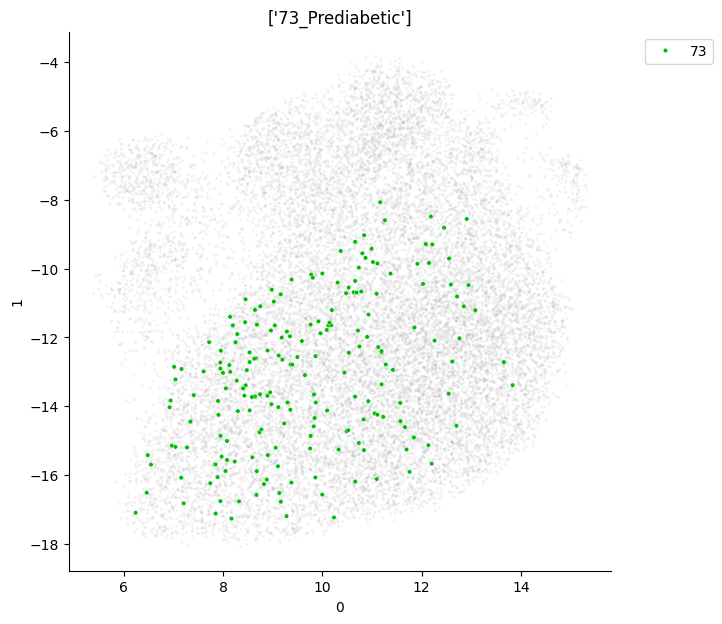

76


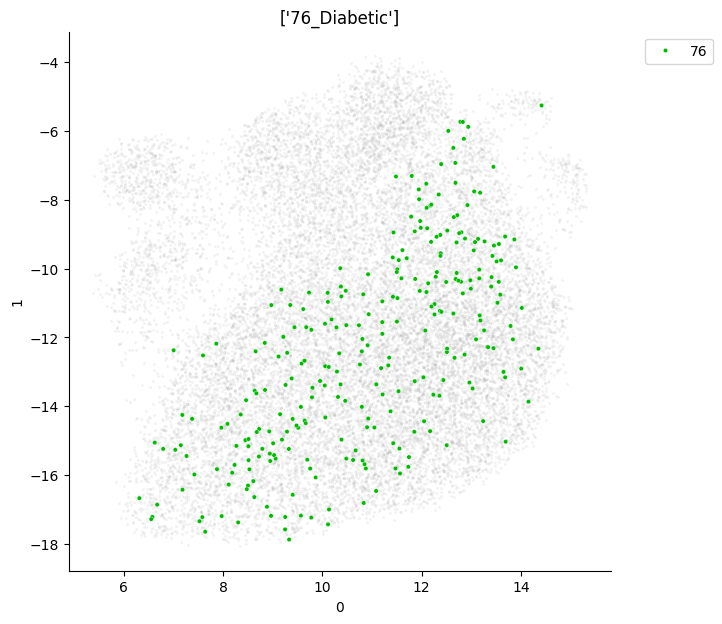

80


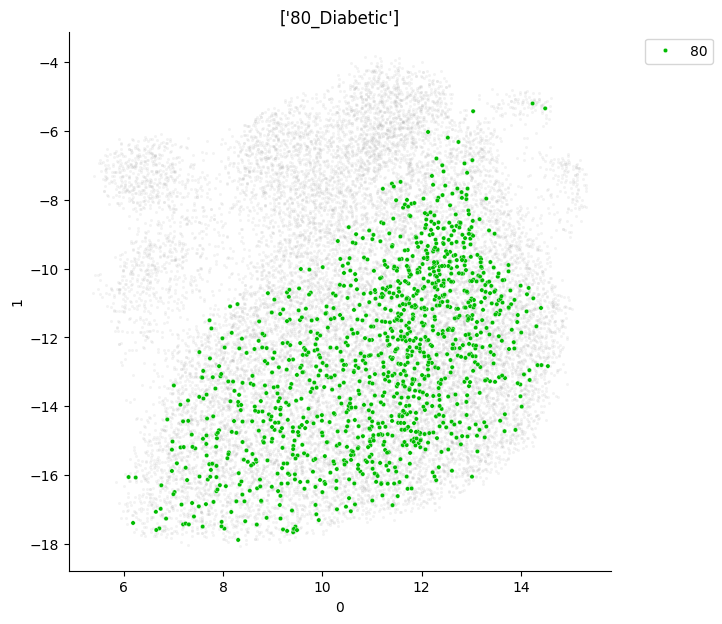

82


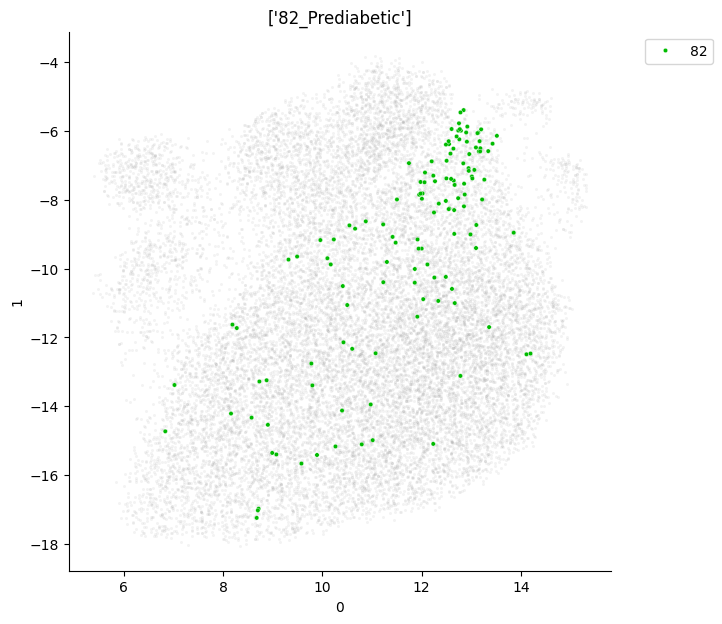

86


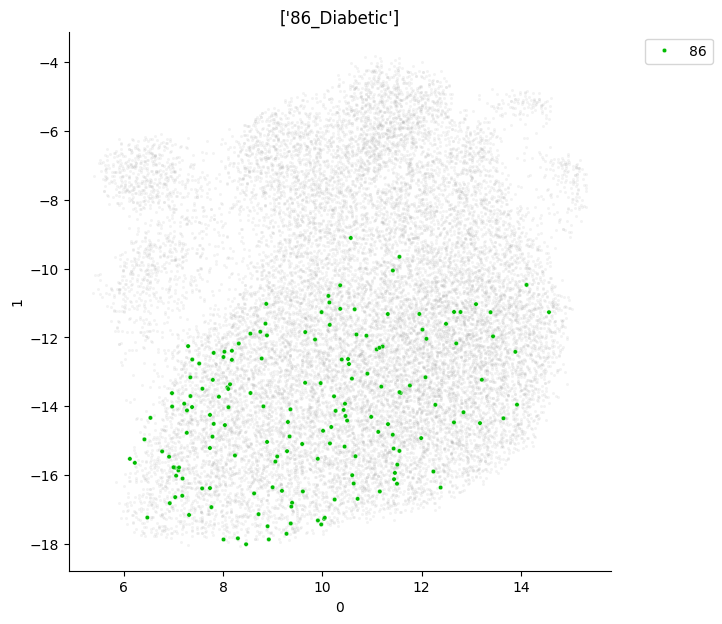

95


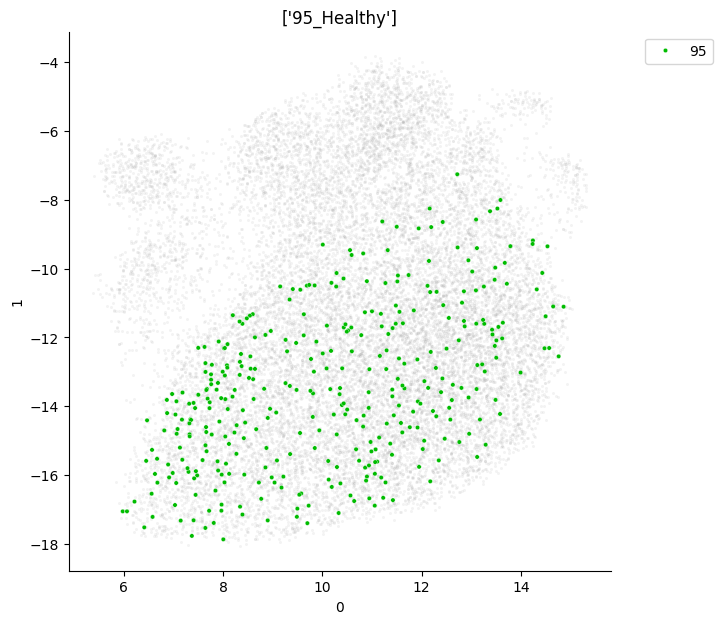

98


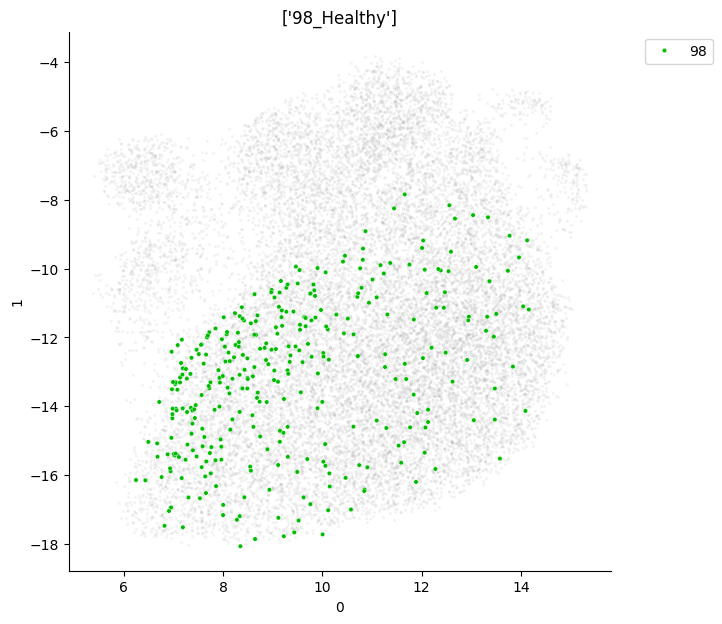

,0,1,patient_id,constriction_size,disease,disease_constric,patient_id_constric
0,11.715540,-12.573468,80,control,Diabetic,Diabetic_control,80_control
1,10.609480,-15.038448,46,control,Diabetic,Diabetic_control,46_control
2,12.057648,-12.128568,46,control,Diabetic,Diabetic_control,46_control
3,11.711122,-12.195323,35,control,Diabetic,Diabetic_control,35_control
4,13.264500,-12.367138,46,control,Diabetic,Diabetic_control,46_control
...,...,...,...,...,...,...,...
19190,9.889993,-9.632205,37,control,Prediabetic,Prediabetic_control,37_control
19191,13.196999,-5.949109,82,control,Prediabetic,Prediabetic_control,82_control
19192,11.013637,-5.868109,45,control,Prediabetic,Prediabetic_control,45_control
19193,10.901270,-5.418889,45,control,Prediabetic,Prediabetic_control,45_control


In [31]:
for disease in np.unique(embedding_control['patient_id']):
    print(disease)
    plt.figure(figsize=(7, 7))
    masking_condition=embedding_control['patient_id']==disease
    temp_df=embedding_control[embedding_control['patient_id']==disease]
    sns.scatterplot(data=embedding_control[~masking_condition],x=0,y=1,s=5,color="gray", alpha=0.09)
    sns.scatterplot(data=embedding_control[masking_condition].sample(frac=1).reset_index(drop=True),x=0,y=1,s=10,hue="patient_id",palette='nipy_spectral')
    sns.despine()
    plt.legend(loc='upper right',bbox_to_anchor=(1.2, 1)) 
    np.unique(temp_df['disease'])
    plt.title(disease+'_'+np.unique(temp_df['disease']))
#     plt.xlim(-2,2)
#     plt.ylim(-2,2)
    plt.show()

embedding_control


Diabetic


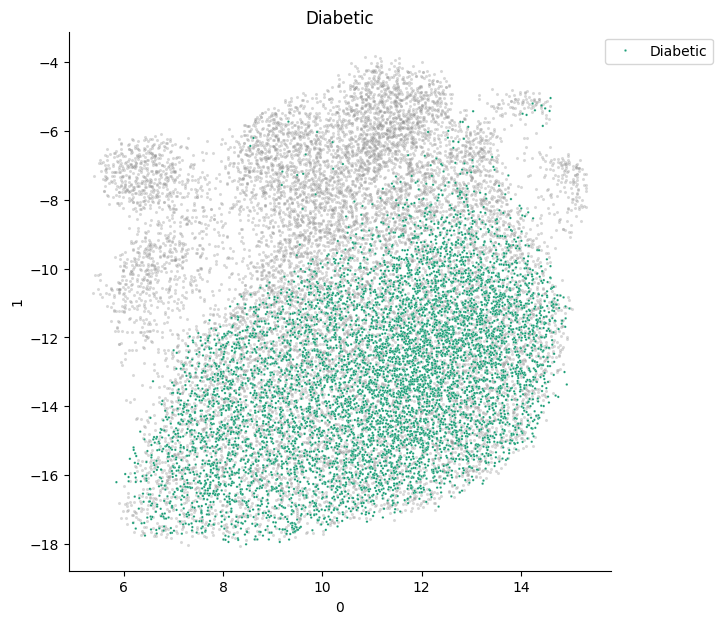

Healthy


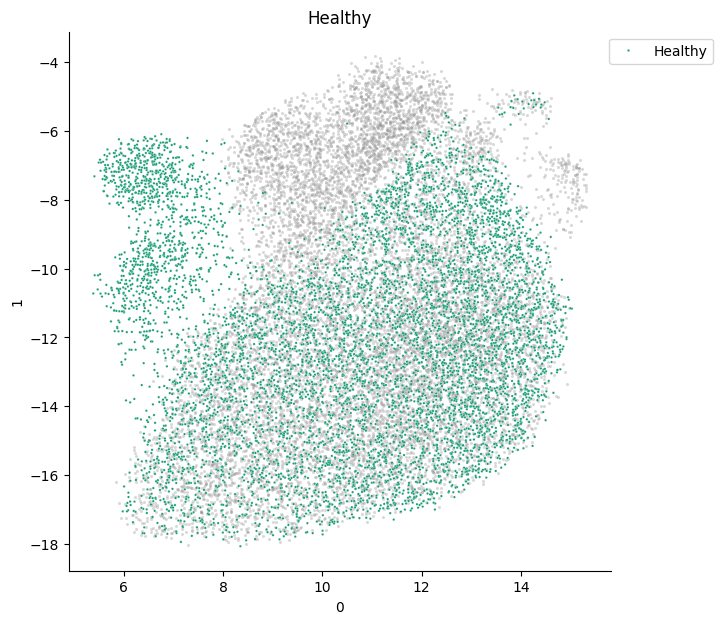

Prediabetic


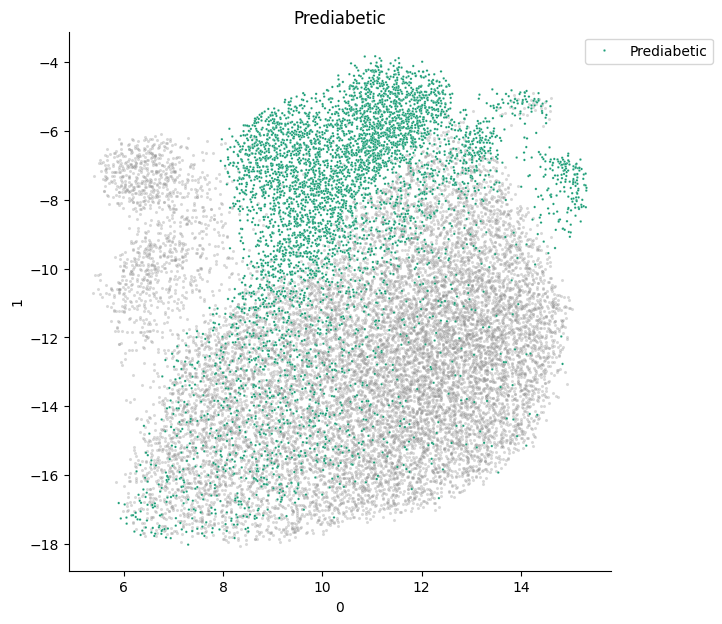

,0,1,patient_id,constriction_size,disease,disease_constric,patient_id_constric
0,11.715540,-12.573468,80,control,Diabetic,Diabetic_control,80_control
1,10.609480,-15.038448,46,control,Diabetic,Diabetic_control,46_control
2,12.057648,-12.128568,46,control,Diabetic,Diabetic_control,46_control
3,11.711122,-12.195323,35,control,Diabetic,Diabetic_control,35_control
4,13.264500,-12.367138,46,control,Diabetic,Diabetic_control,46_control
...,...,...,...,...,...,...,...
19190,9.889993,-9.632205,37,control,Prediabetic,Prediabetic_control,37_control
19191,13.196999,-5.949109,82,control,Prediabetic,Prediabetic_control,82_control
19192,11.013637,-5.868109,45,control,Prediabetic,Prediabetic_control,45_control
19193,10.901270,-5.418889,45,control,Prediabetic,Prediabetic_control,45_control


In [32]:

for disease in np.unique(embedding_control['disease']):
    print(disease)
    plt.figure(figsize=(7, 7))
    masking_condition=embedding_control['disease']==disease
    temp_df=embedding_control[embedding_control['disease']==disease]
    sns.scatterplot(data=embedding_control[~masking_condition],x=0,y=1,s=5,color="gray", alpha=0.3)
    sns.scatterplot(data=embedding_control[masking_condition].sample(frac=1).reset_index(drop=True),x=0,y=1,s=3,hue="disease",palette='Dark2')
    sns.despine()
    plt.legend(loc='upper right',bbox_to_anchor=(1.2, 1)) 
    np.unique(temp_df['disease'])
    plt.title(disease)
#     plt.xlim(-2,2)
#     plt.ylim(-2,2)
    plt.show()

embedding_control


In [33]:
def sample_algo(lists):
    
    balanced_list=[]   
    cell_count_mat=[]
    balanced_no=[]
    balanced_list_count=[]
    for a_list in lists:
        cell_count=sum(a_list)
        cell_count_mat.append(cell_count)
        balance=a_list-a_list.mean()
        balance[balance<0]=0
        balanced_list.append(a_list-balance)
        balanced_list_count.append(sum(a_list-balance))
        balanced_no.append(len(a_list))
        
    residue=(np.array(balanced_list_count)-min(np.array(balanced_list_count)))
    
    while max(residue)>5:
        final_balanced_list=[]
        final_balanced_list_count=[]
        new_residue=[]
        for a_residue,a_list in zip(residue,balanced_list):
            if a_residue>1:
                t=a_list.max()
                balance=a_list-t+1
                balance[balance<0]=0
                a_residue=a_residue-balance.sum()
                a_list=a_list-balance
                final_balanced_list.append(a_list)
                final_balanced_list_count.append((a_list).sum())
                new_residue.append(a_residue)
            else:
                new_residue.append(a_residue)
                final_balanced_list.append(a_list)
                final_balanced_list_count.append((a_list).sum())
        residue=np.array(new_residue)
        balanced_list=final_balanced_list
        
    return(balanced_list)

import numpy as np
import pandas as pd
import igraph as ig
import leidenalg
from sklearn.metrics import adjusted_rand_score
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import squareform
from sklearn.neighbors import NearestNeighbors

def consensus_leiden_dense(
    df,
    n_neighbors: int = 10,
    n_runs: int = 30,
    resolution: float = 1.0,
    seed0: int = 0,
    distance: str = "euclidean",
    threshold: float = 0.8,
):
    """
    Run consensus Leiden clustering on a dataframe of shape (cells, features).

    Parameters
    ----------
    df : pd.DataFrame
        Input data, rows=cells, cols=features.
    n_neighbors : int
        Number of neighbors for kNN graph.
    n_runs : int
        Number of Leiden runs with different seeds.
    resolution : float
        Resolution parameter for Leiden.
    seed0 : int
        Base random seed for reproducibility.
    distance : str
        Distance metric for sklearn NearestNeighbors.
    threshold : float
        Co-association threshold for consensus clustering.

    Returns
    -------
    labels_consensus : np.ndarray
        Final consensus cluster labels (string form).
    stability : dict
        Mean and std ARI of runs vs consensus, plus metadata.
    all_labels : np.ndarray
        Labels from all runs (n_runs × n_cells).
    """

    X = df#.values.astype(np.float32)
    n_cells = X.shape[0]

    # --- Build kNN graph once ---
    nbrs = NearestNeighbors(n_neighbors=n_neighbors, metric=distance).fit(X)
    knn = nbrs.kneighbors_graph(X, mode="connectivity")

    sources, targets = knn.nonzero()
    g = ig.Graph(directed=False)
    g.add_vertices(n_cells)
    g.add_edges(list(zip(sources, targets)))

    # --- Multiple Leiden runs ---
    labels_runs = np.zeros((n_runs, n_cells), dtype=int)
    for r in range(n_runs):
        part = leidenalg.find_partition(
            g,
            leidenalg.RBConfigurationVertexPartition,
            resolution_parameter=resolution,
            seed=seed0 + r,
        )
        labels_runs[r] = np.array(part.membership)

    # --- Build co-association matrix ---
    P = np.zeros((n_cells, n_cells), dtype=np.float32)
    for r in range(n_runs):
        labs = labels_runs[r]
        for c in np.unique(labs):
            idx = np.where(labs == c)[0]
            P[np.ix_(idx, idx)] += 1.0
    P /= n_runs

    # --- Hierarchical consensus ---
    D = 1.0 - P
    Dv = squareform(D, checks=False)
    Z = linkage(Dv, method="average")
    flat = fcluster(Z, t=1-threshold, criterion="distance")
    labels_consensus = flat.astype(str)

    # --- Stability diagnostics ---
    aris = [adjusted_rand_score(labels_runs[r], flat) for r in range(n_runs)]
    stability = {
        "mean_ARI_to_consensus": float(np.mean(aris)),
        "std_ARI_to_consensus": float(np.std(aris)),
        "n_runs": n_runs,
        "resolution": resolution,
        "threshold": threshold,
        "n_neighbors": n_neighbors,
    }

    return labels_consensus, stability, labels_runs


In [34]:
import igraph as ig
import leidenalg as la
from sklearn.neighbors import kneighbors_graph


### Skipping balancing and importing the same cell from VAE sampled dataset 

# vae_leiden_csv = pd.read_csv('vae_leiden_csv', index_col = 0)
# vae_leiden_csv


test_data_unlabelled_scaled_labelled_control=test_data_unlabelled_scaled_labelled[test_data_unlabelled_scaled_labelled['constriction_size']=='control']
test_data_unlabelled_scaled_labelled_control = test_data_unlabelled_scaled_labelled_control[test_data_unlabelled_scaled_labelled_control['disease'] != 'Hypertension']
each_patho_cell_count=[]
each_patho_individual_count=[]
each_pat_id_count=[]
for a_disease in np.unique(test_data_unlabelled_scaled_labelled_control['disease']):
    disease_subset=test_data_unlabelled_scaled_labelled_control[test_data_unlabelled_scaled_labelled_control['disease']==a_disease]
    each_patho_cell_count.append(len(disease_subset))
    individual_count=len(np.unique(disease_subset['patient_id']))
    each_patho_individual_count.append(individual_count)
    each_pat_id_cells=disease_subset.groupby('patient_id').count()
    each_pat_id_count.append(each_pat_id_cells['min_calliper'])
    
each_pat_id_count_mod=[each_pat_id_count[0],each_pat_id_count[1],each_pat_id_count[2]]
balanced_list=sample_algo(each_pat_id_count_mod)
balanced_list=pd.concat(balanced_list)

balanced_list

sampling_matrix=pd.DataFrame({'patient_id':balanced_list.index,'sampling':balanced_list.values.astype(int)})

test_data_unlabelled_scaled_labelled_control['balanced_sample']=0
sampled_df_list=[]

for pat_id in np.unique(test_data_unlabelled_scaled_labelled_control['patient_id']): 
    to_be_sampled=test_data_unlabelled_scaled_labelled_control[test_data_unlabelled_scaled_labelled_control['patient_id']==pat_id]
    sample_size=sampling_matrix.sampling[sampling_matrix['patient_id']==pat_id]

    if sample_size.values:
        sample_size=int(sample_size.values)
        sampled_df=to_be_sampled.sample(sample_size,ignore_index=False,random_state=14)
        sampled_index=list(sampled_df.index.values)
        test_data_unlabelled_scaled_labelled_control.loc[sampled_index,'balanced_sample']=1
        

# latent_list_df_lab_control['balanced_sample'] = vae_leiden_csv['balanced_sample']

# latent_list_df_lab_control_concensus_with_vae = latent_list_df_lab_control.copy()
# latent_list_df_lab_control_concensus_with_vae['leiden_vae'] = vae_leiden_csv['label_leiden']

test_data_unlabelled_scaled_labelled_control_ulab=test_data_unlabelled_scaled_labelled_control.drop(['patient_id','constriction_size','disease','disease_constric','patient_id_constric'],axis=1)
test_data_unlabelled_scaled_labelled_control_ulab

for_clusters_assigment=test_data_unlabelled_scaled_labelled_control_ulab[test_data_unlabelled_scaled_labelled_control['balanced_sample']==1]

# #latent_list_df_control=latent_list_df_control.drop(to_remove_array,axis=0)

# recon_list_control=[raw_images[i] for i in latent_list_df_lab_control[latent_list_df_lab_control['constriction_size']=='control'].index]

for_clusters_assigment
for_clusters_assigment


/tmp/ipykernel_2731077/2452456785.py:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sample_size=int(sample_size.values)
/tmp/ipykernel_2731077/2452456785.py:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sample_size=int(sample_size.values)
/tmp/ipykernel_2731077/2452456785.py:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sample_size=int(sample_size.values)
/tmp/ipykernel_2731077/2452456785.py:41: DeprecationWarning: Conversion of an array with ndim > 0 to

,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnodenucsurfsurfdistmax,HOnodenucsurfsurfdistmean,HOnodenucsurfsurfdistmedian,HOnodenucsurfsurfdistmin,HOnodenucsurfsurfdiststd,HOnodenucsurfsurfdisttotal,HOnumnode,HOstdnodevol,HOtotnodevol,balanced_sample
28407,0.555556,0.424242,0.844796,0.575672,0.340188,0.529341,0.519482,0.556836,0.397682,0.049883,...,0.394157,0.562786,0.707813,0.792817,0.567915,0.265574,0.219512,0.115917,0.199841,1
28394,0.555556,0.454545,0.786894,0.642931,0.368048,0.566736,0.565732,0.616825,0.430644,0.037633,...,0.394157,0.572738,0.707813,0.642160,0.562234,0.272976,0.219512,0.205129,0.307325,1
50934,0.518519,0.484848,0.669565,0.413018,0.440185,0.517460,0.519419,0.504746,0.455969,0.242360,...,0.119283,0.446080,0.420987,0.282392,0.144416,0.533869,0.292683,0.132330,0.117834,1
29798,0.555556,0.575758,0.598175,0.045786,0.455284,0.631953,0.554990,0.583088,0.515556,0.438147,...,0.394157,0.591737,0.561385,0.132288,0.528341,0.287040,0.195122,0.541730,0.359873,1
51012,0.629630,0.484848,0.862319,0.649406,0.382692,0.611943,0.596478,0.645004,0.459174,0.052593,...,0.119283,0.438540,0.420987,0.504029,0.161782,0.527510,0.317073,0.122671,0.171178,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47410,0.518519,0.363636,0.900870,0.579080,0.295547,0.473152,0.463787,0.510018,0.348966,0.011070,...,0.119283,0.098191,0.006574,0.574082,0.320336,0.241119,0.097561,0.147473,0.135350,1
53194,0.592593,0.484848,0.798068,0.607442,0.423280,0.565066,0.564019,0.584479,0.455882,0.106730,...,0.119283,0.267551,0.380747,0.391952,0.196966,0.383611,0.146341,0.235189,0.257962,1
56602,0.666667,0.606061,0.724638,0.597548,0.491017,0.692149,0.678932,0.686202,0.560327,0.173613,...,0.119283,0.523402,0.626413,0.286362,0.257263,0.598934,0.317073,0.122564,0.274682,1
56430,0.481481,0.454545,0.652804,0.558890,0.393490,0.566342,0.557775,0.592753,0.439455,0.087313,...,0.119283,0.591194,0.720836,0.359560,0.246352,0.655993,0.048780,0.280779,0.143312,1


In [35]:
import igraph as ig
import leidenalg as la
from sklearn.neighbors import kneighbors_graph


### Skipping balancing and importing the same cell from VAE sampled dataset 

each_patho_cell_count=[]
each_patho_individual_count=[]
each_pat_id_count=[]
for a_disease in np.unique(latent_list_df_lab_control['disease']):
    disease_subset=latent_list_df_lab_control[latent_list_df_lab_control['disease']==a_disease]
    each_patho_cell_count.append(len(disease_subset))
    individual_count=len(np.unique(disease_subset['patient_id']))
    each_patho_individual_count.append(individual_count)
    each_pat_id_cells=disease_subset.groupby('patient_id').count()
    each_pat_id_count.append(each_pat_id_cells['min_calliper'])
    
each_pat_id_count_mod=[each_pat_id_count[0],each_pat_id_count[1],each_pat_id_count[2]]
balanced_list=sample_algo(each_pat_id_count_mod)
balanced_list=pd.concat(balanced_list)

balanced_list

sampling_matrix=pd.DataFrame({'patient_id':balanced_list.index,'sampling':balanced_list.values.astype(int)})

latent_list_df_lab_control['balanced_sample']=0
sampled_df_list=[]

for pat_id in np.unique(latent_list_df_lab_control['patient_id']): 
    to_be_sampled=latent_list_df_lab_control[latent_list_df_lab_control['patient_id']==pat_id]
    sample_size=sampling_matrix.sampling[sampling_matrix['patient_id']==pat_id]

    if sample_size.values:
        sample_size=int(sample_size.values)
        sampled_df=to_be_sampled.sample(sample_size,ignore_index=False,random_state=14)
        sampled_index=list(sampled_df.index.values)
        latent_list_df_lab_control.loc[sampled_index,'balanced_sample']=1
        

# latent_list_df_lab_control['balanced_sample'] = vae_leiden_csv['balanced_sample']

# latent_list_df_lab_control_concensus_with_vae = latent_list_df_lab_control.copy()
# latent_list_df_lab_control_concensus_with_vae['leiden_vae'] = vae_leiden_csv['label_leiden']

latent_list_df_lab_control_ulab=latent_list_df_lab_control.drop(['patient_id','constriction_size','disease','disease_constric','patient_id_constric'],axis=1)
latent_list_df_lab_control_ulab

for_clusters=latent_list_df_lab_control_ulab[latent_list_df_lab_control['balanced_sample']==1]
for_clusters

/tmp/ipykernel_2731077/2650689043.py:35: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sample_size=int(sample_size.values)
/tmp/ipykernel_2731077/2650689043.py:35: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sample_size=int(sample_size.values)
/tmp/ipykernel_2731077/2650689043.py:35: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sample_size=int(sample_size.values)
/tmp/ipykernel_2731077/2650689043.py:35: DeprecationWarning: Conversion of an array with ndim > 0 to

,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnodenucsurfsurfdistmax,HOnodenucsurfsurfdistmean,HOnodenucsurfsurfdistmedian,HOnodenucsurfsurfdistmin,HOnodenucsurfsurfdiststd,HOnodenucsurfsurfdisttotal,HOnumnode,HOstdnodevol,HOtotnodevol,balanced_sample
7,0.379310,0.512821,0.376744,0.194930,0.644168,0.506333,0.550003,0.456968,0.603276,0.573179,...,0.310392,0.682483,0.787174,0.352917,0.358328,0.752836,0.190476,0.132758,0.190174,1
9,0.551724,0.461538,0.743175,0.456763,0.399555,0.524902,0.531626,0.500277,0.485101,0.151213,...,1.000000,0.707406,0.554031,0.112771,0.757602,0.767775,0.111111,0.166450,0.076862,1
13,0.482759,0.538462,0.509839,0.411815,0.445120,0.562591,0.562878,0.491459,0.583793,0.294840,...,0.551247,0.854282,0.808440,0.636813,0.500709,0.985932,0.174603,0.110625,0.167195,1
15,0.413793,0.358974,0.679315,0.423906,0.321254,0.419303,0.430989,0.409052,0.396692,0.103184,...,0.310392,0.677299,0.787174,0.352953,0.366358,0.749745,0.158730,0.117293,0.197306,1
16,0.551724,0.461538,0.743175,0.551004,0.397031,0.552401,0.557361,0.556981,0.499849,0.077496,...,0.551247,0.681825,0.614862,0.176400,0.539440,0.868834,0.079365,0.256672,0.146593,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19187,0.551724,0.410256,0.847176,0.465334,0.350804,0.500568,0.510708,0.526304,0.453750,0.076450,...,0.310392,0.713301,0.852705,0.131734,0.379436,0.771304,0.142857,0.050221,0.072108,1
19188,0.482759,0.410256,0.714286,0.409776,0.365778,0.493603,0.486737,0.461577,0.464423,0.159893,...,0.310392,0.479762,0.460399,0.251223,0.342003,0.631428,0.031746,0.334348,0.098257,1
19190,0.482759,0.461538,0.621840,0.439822,0.398977,0.498616,0.501459,0.450941,0.477314,0.174310,...,0.310392,0.485999,0.496048,0.106707,0.308083,0.635164,0.079365,0.106703,0.180666,1
19191,0.448276,0.358974,0.752754,0.440823,0.292718,0.433825,0.436742,0.441281,0.398098,0.070077,...,0.551247,0.759461,0.746802,0.033932,0.510657,0.921551,0.095238,0.152519,0.040412,1


In [36]:
for_clusters

,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnodenucsurfsurfdistmax,HOnodenucsurfsurfdistmean,HOnodenucsurfsurfdistmedian,HOnodenucsurfsurfdistmin,HOnodenucsurfsurfdiststd,HOnodenucsurfsurfdisttotal,HOnumnode,HOstdnodevol,HOtotnodevol,balanced_sample
7,0.379310,0.512821,0.376744,0.194930,0.644168,0.506333,0.550003,0.456968,0.603276,0.573179,...,0.310392,0.682483,0.787174,0.352917,0.358328,0.752836,0.190476,0.132758,0.190174,1
9,0.551724,0.461538,0.743175,0.456763,0.399555,0.524902,0.531626,0.500277,0.485101,0.151213,...,1.000000,0.707406,0.554031,0.112771,0.757602,0.767775,0.111111,0.166450,0.076862,1
13,0.482759,0.538462,0.509839,0.411815,0.445120,0.562591,0.562878,0.491459,0.583793,0.294840,...,0.551247,0.854282,0.808440,0.636813,0.500709,0.985932,0.174603,0.110625,0.167195,1
15,0.413793,0.358974,0.679315,0.423906,0.321254,0.419303,0.430989,0.409052,0.396692,0.103184,...,0.310392,0.677299,0.787174,0.352953,0.366358,0.749745,0.158730,0.117293,0.197306,1
16,0.551724,0.461538,0.743175,0.551004,0.397031,0.552401,0.557361,0.556981,0.499849,0.077496,...,0.551247,0.681825,0.614862,0.176400,0.539440,0.868834,0.079365,0.256672,0.146593,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19187,0.551724,0.410256,0.847176,0.465334,0.350804,0.500568,0.510708,0.526304,0.453750,0.076450,...,0.310392,0.713301,0.852705,0.131734,0.379436,0.771304,0.142857,0.050221,0.072108,1
19188,0.482759,0.410256,0.714286,0.409776,0.365778,0.493603,0.486737,0.461577,0.464423,0.159893,...,0.310392,0.479762,0.460399,0.251223,0.342003,0.631428,0.031746,0.334348,0.098257,1
19190,0.482759,0.461538,0.621840,0.439822,0.398977,0.498616,0.501459,0.450941,0.477314,0.174310,...,0.310392,0.485999,0.496048,0.106707,0.308083,0.635164,0.079365,0.106703,0.180666,1
19191,0.448276,0.358974,0.752754,0.440823,0.292718,0.433825,0.436742,0.441281,0.398098,0.070077,...,0.551247,0.759461,0.746802,0.033932,0.510657,0.921551,0.095238,0.152519,0.040412,1


In [37]:
for_clusters_assigment

,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnodenucsurfsurfdistmax,HOnodenucsurfsurfdistmean,HOnodenucsurfsurfdistmedian,HOnodenucsurfsurfdistmin,HOnodenucsurfsurfdiststd,HOnodenucsurfsurfdisttotal,HOnumnode,HOstdnodevol,HOtotnodevol,balanced_sample
28407,0.555556,0.424242,0.844796,0.575672,0.340188,0.529341,0.519482,0.556836,0.397682,0.049883,...,0.394157,0.562786,0.707813,0.792817,0.567915,0.265574,0.219512,0.115917,0.199841,1
28394,0.555556,0.454545,0.786894,0.642931,0.368048,0.566736,0.565732,0.616825,0.430644,0.037633,...,0.394157,0.572738,0.707813,0.642160,0.562234,0.272976,0.219512,0.205129,0.307325,1
50934,0.518519,0.484848,0.669565,0.413018,0.440185,0.517460,0.519419,0.504746,0.455969,0.242360,...,0.119283,0.446080,0.420987,0.282392,0.144416,0.533869,0.292683,0.132330,0.117834,1
29798,0.555556,0.575758,0.598175,0.045786,0.455284,0.631953,0.554990,0.583088,0.515556,0.438147,...,0.394157,0.591737,0.561385,0.132288,0.528341,0.287040,0.195122,0.541730,0.359873,1
51012,0.629630,0.484848,0.862319,0.649406,0.382692,0.611943,0.596478,0.645004,0.459174,0.052593,...,0.119283,0.438540,0.420987,0.504029,0.161782,0.527510,0.317073,0.122671,0.171178,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47410,0.518519,0.363636,0.900870,0.579080,0.295547,0.473152,0.463787,0.510018,0.348966,0.011070,...,0.119283,0.098191,0.006574,0.574082,0.320336,0.241119,0.097561,0.147473,0.135350,1
53194,0.592593,0.484848,0.798068,0.607442,0.423280,0.565066,0.564019,0.584479,0.455882,0.106730,...,0.119283,0.267551,0.380747,0.391952,0.196966,0.383611,0.146341,0.235189,0.257962,1
56602,0.666667,0.606061,0.724638,0.597548,0.491017,0.692149,0.678932,0.686202,0.560327,0.173613,...,0.119283,0.523402,0.626413,0.286362,0.257263,0.598934,0.317073,0.122564,0.274682,1
56430,0.481481,0.454545,0.652804,0.558890,0.393490,0.566342,0.557775,0.592753,0.439455,0.087313,...,0.119283,0.591194,0.720836,0.359560,0.246352,0.655993,0.048780,0.280779,0.143312,1


In [38]:
latent_list_df_lab_control_ulab_bal=latent_list_df_lab_control_ulab[latent_list_df_lab_control_ulab['balanced_sample']==1]
latent_list_df_lab_control_ulab_bal=latent_list_df_lab_control_ulab_bal.drop(['balanced_sample'],axis=1)
for_clusters=latent_list_df_lab_control_ulab_bal
stability_list=[]

k = 10
knn_graph = kneighbors_graph(for_clusters, n_neighbors=k, include_self=False)
sources, targets = knn_graph.nonzero()
weights = knn_graph.data

g = ig.Graph(directed=False)
g.add_vertices(for_clusters.shape[0])
g.add_edges(zip(sources, targets))
g.es['weight'] = weights

# Perform Leiden clustering
partition = la.find_partition(g, la.ModularityVertexPartition, seed=42)

# Get cluster membership
clusters = pd.Series(partition.membership,for_clusters.index)
clusters

7         8
9        10
13        8
15        0
16       13
         ..
19187     0
19188     2
19190     0
19191    12
19194     2
Length: 7425, dtype: int64

In [39]:
embedding_control

,0,1,patient_id,constriction_size,disease,disease_constric,patient_id_constric
0,11.715540,-12.573468,80,control,Diabetic,Diabetic_control,80_control
1,10.609480,-15.038448,46,control,Diabetic,Diabetic_control,46_control
2,12.057648,-12.128568,46,control,Diabetic,Diabetic_control,46_control
3,11.711122,-12.195323,35,control,Diabetic,Diabetic_control,35_control
4,13.264500,-12.367138,46,control,Diabetic,Diabetic_control,46_control
...,...,...,...,...,...,...,...
19190,9.889993,-9.632205,37,control,Prediabetic,Prediabetic_control,37_control
19191,13.196999,-5.949109,82,control,Prediabetic,Prediabetic_control,82_control
19192,11.013637,-5.868109,45,control,Prediabetic,Prediabetic_control,45_control
19193,10.901270,-5.418889,45,control,Prediabetic,Prediabetic_control,45_control


In [40]:
for_clusters

,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnodenucsurfcentdisttotal,HOnodenucsurfsurfdistmax,HOnodenucsurfsurfdistmean,HOnodenucsurfsurfdistmedian,HOnodenucsurfsurfdistmin,HOnodenucsurfsurfdiststd,HOnodenucsurfsurfdisttotal,HOnumnode,HOstdnodevol,HOtotnodevol
7,0.379310,0.512821,0.376744,0.194930,0.644168,0.506333,0.550003,0.456968,0.603276,0.573179,...,0.248302,0.310392,0.682483,0.787174,0.352917,0.358328,0.752836,0.190476,0.132758,0.190174
9,0.551724,0.461538,0.743175,0.456763,0.399555,0.524902,0.531626,0.500277,0.485101,0.151213,...,0.425193,1.000000,0.707406,0.554031,0.112771,0.757602,0.767775,0.111111,0.166450,0.076862
13,0.482759,0.538462,0.509839,0.411815,0.445120,0.562591,0.562878,0.491459,0.583793,0.294840,...,0.395668,0.551247,0.854282,0.808440,0.636813,0.500709,0.985932,0.174603,0.110625,0.167195
15,0.413793,0.358974,0.679315,0.423906,0.321254,0.419303,0.430989,0.409052,0.396692,0.103184,...,0.290260,0.310392,0.677299,0.787174,0.352953,0.366358,0.749745,0.158730,0.117293,0.197306
16,0.551724,0.461538,0.743175,0.551004,0.397031,0.552401,0.557361,0.556981,0.499849,0.077496,...,0.623555,0.551247,0.681825,0.614862,0.176400,0.539440,0.868834,0.079365,0.256672,0.146593
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19187,0.551724,0.410256,0.847176,0.465334,0.350804,0.500568,0.510708,0.526304,0.453750,0.076450,...,0.456368,0.310392,0.713301,0.852705,0.131734,0.379436,0.771304,0.142857,0.050221,0.072108
19188,0.482759,0.410256,0.714286,0.409776,0.365778,0.493603,0.486737,0.461577,0.464423,0.159893,...,0.245308,0.310392,0.479762,0.460399,0.251223,0.342003,0.631428,0.031746,0.334348,0.098257
19190,0.482759,0.461538,0.621840,0.439822,0.398977,0.498616,0.501459,0.450941,0.477314,0.174310,...,0.691330,0.310392,0.485999,0.496048,0.106707,0.308083,0.635164,0.079365,0.106703,0.180666
19191,0.448276,0.358974,0.752754,0.440823,0.292718,0.433825,0.436742,0.441281,0.398098,0.070077,...,0.637223,0.551247,0.759461,0.746802,0.033932,0.510657,0.921551,0.095238,0.152519,0.040412


In [41]:
for_clusters_clustered = for_clusters.copy()
# latent_list_df_lab_control['label_leiden']
for_clusters_clustered['labels_leiden'] = clusters
for_clusters_clustered

,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnodenucsurfsurfdistmax,HOnodenucsurfsurfdistmean,HOnodenucsurfsurfdistmedian,HOnodenucsurfsurfdistmin,HOnodenucsurfsurfdiststd,HOnodenucsurfsurfdisttotal,HOnumnode,HOstdnodevol,HOtotnodevol,labels_leiden
7,0.379310,0.512821,0.376744,0.194930,0.644168,0.506333,0.550003,0.456968,0.603276,0.573179,...,0.310392,0.682483,0.787174,0.352917,0.358328,0.752836,0.190476,0.132758,0.190174,8
9,0.551724,0.461538,0.743175,0.456763,0.399555,0.524902,0.531626,0.500277,0.485101,0.151213,...,1.000000,0.707406,0.554031,0.112771,0.757602,0.767775,0.111111,0.166450,0.076862,10
13,0.482759,0.538462,0.509839,0.411815,0.445120,0.562591,0.562878,0.491459,0.583793,0.294840,...,0.551247,0.854282,0.808440,0.636813,0.500709,0.985932,0.174603,0.110625,0.167195,8
15,0.413793,0.358974,0.679315,0.423906,0.321254,0.419303,0.430989,0.409052,0.396692,0.103184,...,0.310392,0.677299,0.787174,0.352953,0.366358,0.749745,0.158730,0.117293,0.197306,0
16,0.551724,0.461538,0.743175,0.551004,0.397031,0.552401,0.557361,0.556981,0.499849,0.077496,...,0.551247,0.681825,0.614862,0.176400,0.539440,0.868834,0.079365,0.256672,0.146593,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19187,0.551724,0.410256,0.847176,0.465334,0.350804,0.500568,0.510708,0.526304,0.453750,0.076450,...,0.310392,0.713301,0.852705,0.131734,0.379436,0.771304,0.142857,0.050221,0.072108,0
19188,0.482759,0.410256,0.714286,0.409776,0.365778,0.493603,0.486737,0.461577,0.464423,0.159893,...,0.310392,0.479762,0.460399,0.251223,0.342003,0.631428,0.031746,0.334348,0.098257,2
19190,0.482759,0.461538,0.621840,0.439822,0.398977,0.498616,0.501459,0.450941,0.477314,0.174310,...,0.310392,0.485999,0.496048,0.106707,0.308083,0.635164,0.079365,0.106703,0.180666,0
19191,0.448276,0.358974,0.752754,0.440823,0.292718,0.433825,0.436742,0.441281,0.398098,0.070077,...,0.551247,0.759461,0.746802,0.033932,0.510657,0.921551,0.095238,0.152519,0.040412,12


In [42]:
latent_list_df_lab_control_ulab_bal

,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnodenucsurfcentdisttotal,HOnodenucsurfsurfdistmax,HOnodenucsurfsurfdistmean,HOnodenucsurfsurfdistmedian,HOnodenucsurfsurfdistmin,HOnodenucsurfsurfdiststd,HOnodenucsurfsurfdisttotal,HOnumnode,HOstdnodevol,HOtotnodevol
7,0.379310,0.512821,0.376744,0.194930,0.644168,0.506333,0.550003,0.456968,0.603276,0.573179,...,0.248302,0.310392,0.682483,0.787174,0.352917,0.358328,0.752836,0.190476,0.132758,0.190174
9,0.551724,0.461538,0.743175,0.456763,0.399555,0.524902,0.531626,0.500277,0.485101,0.151213,...,0.425193,1.000000,0.707406,0.554031,0.112771,0.757602,0.767775,0.111111,0.166450,0.076862
13,0.482759,0.538462,0.509839,0.411815,0.445120,0.562591,0.562878,0.491459,0.583793,0.294840,...,0.395668,0.551247,0.854282,0.808440,0.636813,0.500709,0.985932,0.174603,0.110625,0.167195
15,0.413793,0.358974,0.679315,0.423906,0.321254,0.419303,0.430989,0.409052,0.396692,0.103184,...,0.290260,0.310392,0.677299,0.787174,0.352953,0.366358,0.749745,0.158730,0.117293,0.197306
16,0.551724,0.461538,0.743175,0.551004,0.397031,0.552401,0.557361,0.556981,0.499849,0.077496,...,0.623555,0.551247,0.681825,0.614862,0.176400,0.539440,0.868834,0.079365,0.256672,0.146593
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19187,0.551724,0.410256,0.847176,0.465334,0.350804,0.500568,0.510708,0.526304,0.453750,0.076450,...,0.456368,0.310392,0.713301,0.852705,0.131734,0.379436,0.771304,0.142857,0.050221,0.072108
19188,0.482759,0.410256,0.714286,0.409776,0.365778,0.493603,0.486737,0.461577,0.464423,0.159893,...,0.245308,0.310392,0.479762,0.460399,0.251223,0.342003,0.631428,0.031746,0.334348,0.098257
19190,0.482759,0.461538,0.621840,0.439822,0.398977,0.498616,0.501459,0.450941,0.477314,0.174310,...,0.691330,0.310392,0.485999,0.496048,0.106707,0.308083,0.635164,0.079365,0.106703,0.180666
19191,0.448276,0.358974,0.752754,0.440823,0.292718,0.433825,0.436742,0.441281,0.398098,0.070077,...,0.637223,0.551247,0.759461,0.746802,0.033932,0.510657,0.921551,0.095238,0.152519,0.040412


In [43]:
for_clusters_clustered
latent_list_df_lab_control_ulab_bal['labels_leiden'] = for_clusters_clustered['labels_leiden']
latent_list_df_lab_control_ulab_bal['labels_leiden'] = latent_list_df_lab_control_ulab_bal['labels_leiden'].fillna('uc')

In [44]:
latent_list_df_lab_control['label_leiden'] = latent_list_df_lab_control_ulab_bal['labels_leiden']
latent_list_df_lab_control

,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnumnode,HOstdnodevol,HOtotnodevol,patient_id,constriction_size,disease,disease_constric,patient_id_constric,balanced_sample,label_leiden
0,0.551724,0.410256,0.847176,0.483124,0.371580,0.512510,0.515036,0.515377,0.454637,0.093798,...,0.158730,0.137514,0.218700,80,control,Diabetic,Diabetic_control,80_control,0,NaN
1,0.655172,0.512821,0.823256,0.364092,0.462757,0.595565,0.576151,0.561232,0.552338,0.232241,...,0.142857,0.204346,0.221870,46,control,Diabetic,Diabetic_control,46_control,0,NaN
2,0.586207,0.435897,0.856237,0.559719,0.375026,0.550302,0.556874,0.565503,0.486751,0.054473,...,0.126984,0.127552,0.187797,46,control,Diabetic,Diabetic_control,46_control,0,NaN
3,0.517241,0.461538,0.682508,0.371995,0.423921,0.533282,0.543712,0.524387,0.532092,0.236409,...,0.031746,0.558747,0.184628,35,control,Diabetic,Diabetic_control,35_control,0,NaN
4,0.551724,0.461538,0.743175,0.482702,0.397101,0.555586,0.551049,0.506485,0.527657,0.167330,...,0.126984,0.215473,0.168780,46,control,Diabetic,Diabetic_control,46_control,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19190,0.482759,0.461538,0.621840,0.439822,0.398977,0.498616,0.501459,0.450941,0.477314,0.174310,...,0.079365,0.106703,0.180666,37,control,Prediabetic,Prediabetic_control,37_control,1,0.0
19191,0.448276,0.358974,0.752754,0.440823,0.292718,0.433825,0.436742,0.441281,0.398098,0.070077,...,0.095238,0.152519,0.040412,82,control,Prediabetic,Prediabetic_control,82_control,1,12.0
19192,0.482759,0.358974,0.826193,0.426230,0.319039,0.465049,0.464988,0.482058,0.411742,0.067032,...,0.063492,0.220713,0.070523,45,control,Prediabetic,Prediabetic_control,45_control,0,NaN
19193,0.517241,0.384615,0.837209,0.509892,0.314497,0.475095,0.477384,0.485018,0.421857,0.042033,...,0.063492,0.160434,0.072108,45,control,Prediabetic,Prediabetic_control,45_control,0,NaN


In [45]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors

def assign_clusters_knn(
    ref_df: pd.DataFrame,
    ref_labels_col: str,
    query_df: pd.DataFrame,
    k: int = 10,
    metric: str = "cosine",
    min_conf: float = 0.0,
):
    """
    Label-transfer from a clustered reference to an unassigned query with k-NN voting.

    Parameters
    ----------
    ref_df : DataFrame
        Reference features + a label column (ref_labels_col).
    ref_labels_col : str
        Column in ref_df containing cluster labels (e.g., 'leiden').
    query_df : DataFrame
        Query features (same columns & order as ref_df, excluding label col).
    k : int
        Number of neighbors for voting (set to the Leiden k you used; default 10).
    scale : bool
        Standardize features using parameters learned on reference only.
    pca_components : int | None
        If set (e.g., 50), fit PCA on reference only and project both ref/query.
        If None, no PCA.
    metric : {"cosine","euclidean"}
        Distance metric for k-NN.
    min_conf : float
        Optional rejection threshold on combined confidence (0..1). 0 disables.

    Returns
    -------
    assignments : DataFrame
        Rows align with query_df; columns include:
        ['pred_label','pred_prob','confidence','mean_neighbor_dist','rejected', 'p_<label>'...]
    """
    # --- split features / labels
    if ref_labels_col not in ref_df.columns:
        raise ValueError(f"ref_labels_col '{ref_labels_col}' not found in ref_df")
    y_ref = ref_df[ref_labels_col].astype(str).to_numpy()
    X_ref = ref_df.drop(columns=[ref_labels_col]).to_numpy(dtype=float)
    X_query = query_df.to_numpy(dtype=float)

    # sanity: same number of features
    if X_ref.shape[1] != X_query.shape[1]:
        raise ValueError(f"Feature mismatch: ref has {X_ref.shape[1]}, query has {X_query.shape[1]}")

    # --- kNN on reference
    nn = NearestNeighbors(n_neighbors=k, metric=metric).fit(X_ref)
    dists, idx = nn.kneighbors(X_query, return_distance=True)  # (nq,k)

    # votes & per-class probs
    labels = np.unique(y_ref)
    lab2i = {lab: i for i, lab in enumerate(labels)}
    vote_counts = np.zeros((X_query.shape[0], labels.size), dtype=int)
    for i in range(X_query.shape[0]):
        nbr_labs = y_ref[idx[i]]
        for lab in nbr_labs:
            vote_counts[i, lab2i[lab]] += 1
    probs = vote_counts / vote_counts.sum(axis=1, keepdims=True)

    pred_idx = probs.argmax(axis=1)
    pred_label = labels[pred_idx]
    pred_prob = probs[np.arange(probs.shape[0]), pred_idx]

    # confidence = avg of vote prob and distance-compactness (normalized)
    mean_dist = dists.mean(axis=1)
    ref_d, _ = nn.kneighbors(X_ref, return_distance=True)
    ref_mean = ref_d[:, 1:].mean()  # skip self distance
    ref_std = ref_d[:, 1:].std() + 1e-8
    z = (mean_dist - ref_mean) / ref_std
    dist_conf = 1.0 / (1.0 + np.exp(z))  # logistic -> [0,1], lower mean_dist => higher conf
    confidence = 0.5 * pred_prob + 0.5 * dist_conf

    rejected = (confidence < min_conf) if min_conf > 0 else np.zeros_like(confidence, dtype=bool)

    out = pd.DataFrame({
        "pred_label": pred_label,
        "pred_prob": pred_prob,
        "confidence": confidence,
        "mean_neighbor_dist": mean_dist,
        "rejected": rejected
    }, index=query_df.index)

    # per-class probabilities
    for i, lab in enumerate(labels):
        out[f"p_{lab}"] = probs[:, i]

    return out



In [46]:
for_clusters_clustered.columns.tolist()
# for_clusters_assigment

['min_calliper',
 'max_calliper',
 'smallest_largest_calliper',
 'min_radius',
 'max_radius',
 'med_radius',
 'avg_radius',
 'd25_radius',
 'd75_radius',
 'std_radius',
 'feret_max',
 'centroid-0',
 'centroid-1',
 'area',
 'perimeter',
 'bbox_area',
 'convex_area',
 'equivalent_diameter',
 'major_axis_length',
 'minor_axis_length',
 'eccentricity',
 'orientation',
 'concavity',
 'solidity',
 'a_r',
 'shape_factor',
 'area_bbarea',
 'avg_curvature',
 'std_curvature',
 'npolarity_changes',
 'num_prominant_pos_curv',
 'num_prominant_neg_curv',
 'frac_peri_w_polarity_changes',
 'int_min',
 'int_d25',
 'int_median',
 'int_d75',
 'int_max',
 'int_mean',
 'int_sd',
 'kurtosis',
 'skewness',
 'entropy',
 'i80_i20',
 'nhigh_nlow',
 'hc_area_ec_area',
 'hc_area_nuc_area',
 'hc_content_ec_content',
 'hc_content_dna_content',
 'contrast_1',
 'contrast_5',
 'contrast_20',
 'dissimilarity_1',
 'dissimilarity_5',
 'dissimilarity_20',
 'homogeneity_1',
 'homogeneity_5',
 'homogeneity_20',
 'asm_1',
 '

In [47]:
assigny = assign_clusters_knn(
    for_clusters_clustered, ref_labels_col="labels_leiden",
    query_df=for_clusters_assigment.drop(columns = ['balanced_sample']),
    k=10,            # match your Leiden neighborhood
    metric="cosine",
    min_conf=0.0
)


In [48]:

for_clusters_assigment['labels_leiden']= assigny['pred_label']
for_clusters_assigment

/tmp/ipykernel_2731077/1332286593.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  for_clusters_assigment['labels_leiden']= assigny['pred_label']


,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnodenucsurfsurfdistmean,HOnodenucsurfsurfdistmedian,HOnodenucsurfsurfdistmin,HOnodenucsurfsurfdiststd,HOnodenucsurfsurfdisttotal,HOnumnode,HOstdnodevol,HOtotnodevol,balanced_sample,labels_leiden
28407,0.555556,0.424242,0.844796,0.575672,0.340188,0.529341,0.519482,0.556836,0.397682,0.049883,...,0.562786,0.707813,0.792817,0.567915,0.265574,0.219512,0.115917,0.199841,1,2
28394,0.555556,0.454545,0.786894,0.642931,0.368048,0.566736,0.565732,0.616825,0.430644,0.037633,...,0.572738,0.707813,0.642160,0.562234,0.272976,0.219512,0.205129,0.307325,1,8
50934,0.518519,0.484848,0.669565,0.413018,0.440185,0.517460,0.519419,0.504746,0.455969,0.242360,...,0.446080,0.420987,0.282392,0.144416,0.533869,0.292683,0.132330,0.117834,1,5
29798,0.555556,0.575758,0.598175,0.045786,0.455284,0.631953,0.554990,0.583088,0.515556,0.438147,...,0.591737,0.561385,0.132288,0.528341,0.287040,0.195122,0.541730,0.359873,1,1
51012,0.629630,0.484848,0.862319,0.649406,0.382692,0.611943,0.596478,0.645004,0.459174,0.052593,...,0.438540,0.420987,0.504029,0.161782,0.527510,0.317073,0.122671,0.171178,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47410,0.518519,0.363636,0.900870,0.579080,0.295547,0.473152,0.463787,0.510018,0.348966,0.011070,...,0.098191,0.006574,0.574082,0.320336,0.241119,0.097561,0.147473,0.135350,1,2
53194,0.592593,0.484848,0.798068,0.607442,0.423280,0.565066,0.564019,0.584479,0.455882,0.106730,...,0.267551,0.380747,0.391952,0.196966,0.383611,0.146341,0.235189,0.257962,1,0
56602,0.666667,0.606061,0.724638,0.597548,0.491017,0.692149,0.678932,0.686202,0.560327,0.173613,...,0.523402,0.626413,0.286362,0.257263,0.598934,0.317073,0.122564,0.274682,1,8
56430,0.481481,0.454545,0.652804,0.558890,0.393490,0.566342,0.557775,0.592753,0.439455,0.087313,...,0.591194,0.720836,0.359560,0.246352,0.655993,0.048780,0.280779,0.143312,1,1


In [49]:
for_clusters_clustered

,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnodenucsurfsurfdistmax,HOnodenucsurfsurfdistmean,HOnodenucsurfsurfdistmedian,HOnodenucsurfsurfdistmin,HOnodenucsurfsurfdiststd,HOnodenucsurfsurfdisttotal,HOnumnode,HOstdnodevol,HOtotnodevol,labels_leiden
7,0.379310,0.512821,0.376744,0.194930,0.644168,0.506333,0.550003,0.456968,0.603276,0.573179,...,0.310392,0.682483,0.787174,0.352917,0.358328,0.752836,0.190476,0.132758,0.190174,8
9,0.551724,0.461538,0.743175,0.456763,0.399555,0.524902,0.531626,0.500277,0.485101,0.151213,...,1.000000,0.707406,0.554031,0.112771,0.757602,0.767775,0.111111,0.166450,0.076862,10
13,0.482759,0.538462,0.509839,0.411815,0.445120,0.562591,0.562878,0.491459,0.583793,0.294840,...,0.551247,0.854282,0.808440,0.636813,0.500709,0.985932,0.174603,0.110625,0.167195,8
15,0.413793,0.358974,0.679315,0.423906,0.321254,0.419303,0.430989,0.409052,0.396692,0.103184,...,0.310392,0.677299,0.787174,0.352953,0.366358,0.749745,0.158730,0.117293,0.197306,0
16,0.551724,0.461538,0.743175,0.551004,0.397031,0.552401,0.557361,0.556981,0.499849,0.077496,...,0.551247,0.681825,0.614862,0.176400,0.539440,0.868834,0.079365,0.256672,0.146593,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19187,0.551724,0.410256,0.847176,0.465334,0.350804,0.500568,0.510708,0.526304,0.453750,0.076450,...,0.310392,0.713301,0.852705,0.131734,0.379436,0.771304,0.142857,0.050221,0.072108,0
19188,0.482759,0.410256,0.714286,0.409776,0.365778,0.493603,0.486737,0.461577,0.464423,0.159893,...,0.310392,0.479762,0.460399,0.251223,0.342003,0.631428,0.031746,0.334348,0.098257,2
19190,0.482759,0.461538,0.621840,0.439822,0.398977,0.498616,0.501459,0.450941,0.477314,0.174310,...,0.310392,0.485999,0.496048,0.106707,0.308083,0.635164,0.079365,0.106703,0.180666,0
19191,0.448276,0.358974,0.752754,0.440823,0.292718,0.433825,0.436742,0.441281,0.398098,0.070077,...,0.551247,0.759461,0.746802,0.033932,0.510657,0.921551,0.095238,0.152519,0.040412,12


In [50]:
from datetime import datetime
import pickle
name_to_save = 'handcrafted_list_df_lab_control_independent_sample'+datetime.now().strftime('%Y%m%d%H%M%S')+'.pkl'
pickle.dump(latent_list_df_lab_control, open(name_to_save, 'wb'))
latent_list_df_lab_control



,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnumnode,HOstdnodevol,HOtotnodevol,patient_id,constriction_size,disease,disease_constric,patient_id_constric,balanced_sample,label_leiden
0,0.551724,0.410256,0.847176,0.483124,0.371580,0.512510,0.515036,0.515377,0.454637,0.093798,...,0.158730,0.137514,0.218700,80,control,Diabetic,Diabetic_control,80_control,0,NaN
1,0.655172,0.512821,0.823256,0.364092,0.462757,0.595565,0.576151,0.561232,0.552338,0.232241,...,0.142857,0.204346,0.221870,46,control,Diabetic,Diabetic_control,46_control,0,NaN
2,0.586207,0.435897,0.856237,0.559719,0.375026,0.550302,0.556874,0.565503,0.486751,0.054473,...,0.126984,0.127552,0.187797,46,control,Diabetic,Diabetic_control,46_control,0,NaN
3,0.517241,0.461538,0.682508,0.371995,0.423921,0.533282,0.543712,0.524387,0.532092,0.236409,...,0.031746,0.558747,0.184628,35,control,Diabetic,Diabetic_control,35_control,0,NaN
4,0.551724,0.461538,0.743175,0.482702,0.397101,0.555586,0.551049,0.506485,0.527657,0.167330,...,0.126984,0.215473,0.168780,46,control,Diabetic,Diabetic_control,46_control,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19190,0.482759,0.461538,0.621840,0.439822,0.398977,0.498616,0.501459,0.450941,0.477314,0.174310,...,0.079365,0.106703,0.180666,37,control,Prediabetic,Prediabetic_control,37_control,1,0.0
19191,0.448276,0.358974,0.752754,0.440823,0.292718,0.433825,0.436742,0.441281,0.398098,0.070077,...,0.095238,0.152519,0.040412,82,control,Prediabetic,Prediabetic_control,82_control,1,12.0
19192,0.482759,0.358974,0.826193,0.426230,0.319039,0.465049,0.464988,0.482058,0.411742,0.067032,...,0.063492,0.220713,0.070523,45,control,Prediabetic,Prediabetic_control,45_control,0,NaN
19193,0.517241,0.384615,0.837209,0.509892,0.314497,0.475095,0.477384,0.485018,0.421857,0.042033,...,0.063492,0.160434,0.072108,45,control,Prediabetic,Prediabetic_control,45_control,0,NaN


In [51]:
latent_list_df_lab_control_ulab_bal

latent_list_df_lab_control

,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnumnode,HOstdnodevol,HOtotnodevol,patient_id,constriction_size,disease,disease_constric,patient_id_constric,balanced_sample,label_leiden
0,0.551724,0.410256,0.847176,0.483124,0.371580,0.512510,0.515036,0.515377,0.454637,0.093798,...,0.158730,0.137514,0.218700,80,control,Diabetic,Diabetic_control,80_control,0,NaN
1,0.655172,0.512821,0.823256,0.364092,0.462757,0.595565,0.576151,0.561232,0.552338,0.232241,...,0.142857,0.204346,0.221870,46,control,Diabetic,Diabetic_control,46_control,0,NaN
2,0.586207,0.435897,0.856237,0.559719,0.375026,0.550302,0.556874,0.565503,0.486751,0.054473,...,0.126984,0.127552,0.187797,46,control,Diabetic,Diabetic_control,46_control,0,NaN
3,0.517241,0.461538,0.682508,0.371995,0.423921,0.533282,0.543712,0.524387,0.532092,0.236409,...,0.031746,0.558747,0.184628,35,control,Diabetic,Diabetic_control,35_control,0,NaN
4,0.551724,0.461538,0.743175,0.482702,0.397101,0.555586,0.551049,0.506485,0.527657,0.167330,...,0.126984,0.215473,0.168780,46,control,Diabetic,Diabetic_control,46_control,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19190,0.482759,0.461538,0.621840,0.439822,0.398977,0.498616,0.501459,0.450941,0.477314,0.174310,...,0.079365,0.106703,0.180666,37,control,Prediabetic,Prediabetic_control,37_control,1,0.0
19191,0.448276,0.358974,0.752754,0.440823,0.292718,0.433825,0.436742,0.441281,0.398098,0.070077,...,0.095238,0.152519,0.040412,82,control,Prediabetic,Prediabetic_control,82_control,1,12.0
19192,0.482759,0.358974,0.826193,0.426230,0.319039,0.465049,0.464988,0.482058,0.411742,0.067032,...,0.063492,0.220713,0.070523,45,control,Prediabetic,Prediabetic_control,45_control,0,NaN
19193,0.517241,0.384615,0.837209,0.509892,0.314497,0.475095,0.477384,0.485018,0.421857,0.042033,...,0.063492,0.160434,0.072108,45,control,Prediabetic,Prediabetic_control,45_control,0,NaN


In [52]:
latent_list_df_lab_control

,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnumnode,HOstdnodevol,HOtotnodevol,patient_id,constriction_size,disease,disease_constric,patient_id_constric,balanced_sample,label_leiden
0,0.551724,0.410256,0.847176,0.483124,0.371580,0.512510,0.515036,0.515377,0.454637,0.093798,...,0.158730,0.137514,0.218700,80,control,Diabetic,Diabetic_control,80_control,0,NaN
1,0.655172,0.512821,0.823256,0.364092,0.462757,0.595565,0.576151,0.561232,0.552338,0.232241,...,0.142857,0.204346,0.221870,46,control,Diabetic,Diabetic_control,46_control,0,NaN
2,0.586207,0.435897,0.856237,0.559719,0.375026,0.550302,0.556874,0.565503,0.486751,0.054473,...,0.126984,0.127552,0.187797,46,control,Diabetic,Diabetic_control,46_control,0,NaN
3,0.517241,0.461538,0.682508,0.371995,0.423921,0.533282,0.543712,0.524387,0.532092,0.236409,...,0.031746,0.558747,0.184628,35,control,Diabetic,Diabetic_control,35_control,0,NaN
4,0.551724,0.461538,0.743175,0.482702,0.397101,0.555586,0.551049,0.506485,0.527657,0.167330,...,0.126984,0.215473,0.168780,46,control,Diabetic,Diabetic_control,46_control,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19190,0.482759,0.461538,0.621840,0.439822,0.398977,0.498616,0.501459,0.450941,0.477314,0.174310,...,0.079365,0.106703,0.180666,37,control,Prediabetic,Prediabetic_control,37_control,1,0.0
19191,0.448276,0.358974,0.752754,0.440823,0.292718,0.433825,0.436742,0.441281,0.398098,0.070077,...,0.095238,0.152519,0.040412,82,control,Prediabetic,Prediabetic_control,82_control,1,12.0
19192,0.482759,0.358974,0.826193,0.426230,0.319039,0.465049,0.464988,0.482058,0.411742,0.067032,...,0.063492,0.220713,0.070523,45,control,Prediabetic,Prediabetic_control,45_control,0,NaN
19193,0.517241,0.384615,0.837209,0.509892,0.314497,0.475095,0.477384,0.485018,0.421857,0.042033,...,0.063492,0.160434,0.072108,45,control,Prediabetic,Prediabetic_control,45_control,0,NaN


In [53]:
embedding_df_again = embedding_control.loc[latent_list_df_lab_control_ulab_bal.index]
for_clusters_clustered

,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnodenucsurfsurfdistmax,HOnodenucsurfsurfdistmean,HOnodenucsurfsurfdistmedian,HOnodenucsurfsurfdistmin,HOnodenucsurfsurfdiststd,HOnodenucsurfsurfdisttotal,HOnumnode,HOstdnodevol,HOtotnodevol,labels_leiden
7,0.379310,0.512821,0.376744,0.194930,0.644168,0.506333,0.550003,0.456968,0.603276,0.573179,...,0.310392,0.682483,0.787174,0.352917,0.358328,0.752836,0.190476,0.132758,0.190174,8
9,0.551724,0.461538,0.743175,0.456763,0.399555,0.524902,0.531626,0.500277,0.485101,0.151213,...,1.000000,0.707406,0.554031,0.112771,0.757602,0.767775,0.111111,0.166450,0.076862,10
13,0.482759,0.538462,0.509839,0.411815,0.445120,0.562591,0.562878,0.491459,0.583793,0.294840,...,0.551247,0.854282,0.808440,0.636813,0.500709,0.985932,0.174603,0.110625,0.167195,8
15,0.413793,0.358974,0.679315,0.423906,0.321254,0.419303,0.430989,0.409052,0.396692,0.103184,...,0.310392,0.677299,0.787174,0.352953,0.366358,0.749745,0.158730,0.117293,0.197306,0
16,0.551724,0.461538,0.743175,0.551004,0.397031,0.552401,0.557361,0.556981,0.499849,0.077496,...,0.551247,0.681825,0.614862,0.176400,0.539440,0.868834,0.079365,0.256672,0.146593,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19187,0.551724,0.410256,0.847176,0.465334,0.350804,0.500568,0.510708,0.526304,0.453750,0.076450,...,0.310392,0.713301,0.852705,0.131734,0.379436,0.771304,0.142857,0.050221,0.072108,0
19188,0.482759,0.410256,0.714286,0.409776,0.365778,0.493603,0.486737,0.461577,0.464423,0.159893,...,0.310392,0.479762,0.460399,0.251223,0.342003,0.631428,0.031746,0.334348,0.098257,2
19190,0.482759,0.461538,0.621840,0.439822,0.398977,0.498616,0.501459,0.450941,0.477314,0.174310,...,0.310392,0.485999,0.496048,0.106707,0.308083,0.635164,0.079365,0.106703,0.180666,0
19191,0.448276,0.358974,0.752754,0.440823,0.292718,0.433825,0.436742,0.441281,0.398098,0.070077,...,0.551247,0.759461,0.746802,0.033932,0.510657,0.921551,0.095238,0.152519,0.040412,12


In [54]:
embedding_df_again

,0,1,patient_id,constriction_size,disease,disease_constric,patient_id_constric
7,8.276264,-12.050431,35,control,Diabetic,Diabetic_control,35_control
9,12.305482,-12.306421,46,control,Diabetic,Diabetic_control,46_control
13,10.495214,-13.566660,67,control,Diabetic,Diabetic_control,67_control
15,10.230992,-9.712666,35,control,Diabetic,Diabetic_control,35_control
16,12.384224,-9.551478,76,control,Diabetic,Diabetic_control,76_control
...,...,...,...,...,...,...,...
19187,11.294588,-7.017437,26,control,Prediabetic,Prediabetic_control,26_control
19188,9.636361,-6.944422,45,control,Prediabetic,Prediabetic_control,45_control
19190,9.889993,-9.632205,37,control,Prediabetic,Prediabetic_control,37_control
19191,13.196999,-5.949109,82,control,Prediabetic,Prediabetic_control,82_control


In [55]:

embedding_df_again['patient_id'] = latent_list_df_lab_control['patient_id']
embedding_df_again['constriction_size'] = latent_list_df_lab_control['constriction_size']
embedding_df_again['disease'] = latent_list_df_lab_control['disease']
embedding_df_again['disease_constric'] = latent_list_df_lab_control['disease_constric']
embedding_df_again['patient_id_constric'] = latent_list_df_lab_control['patient_id_constric']
embedding_df_again['balanced_sample'] = latent_list_df_lab_control['balanced_sample']
embedding_df_again['label_leiden'] = for_clusters_clustered['labels_leiden']
embedding_df_again

,0,1,patient_id,constriction_size,disease,disease_constric,patient_id_constric,balanced_sample,label_leiden
7,8.276264,-12.050431,35,control,Diabetic,Diabetic_control,35_control,1,8
9,12.305482,-12.306421,46,control,Diabetic,Diabetic_control,46_control,1,10
13,10.495214,-13.566660,67,control,Diabetic,Diabetic_control,67_control,1,8
15,10.230992,-9.712666,35,control,Diabetic,Diabetic_control,35_control,1,0
16,12.384224,-9.551478,76,control,Diabetic,Diabetic_control,76_control,1,13
...,...,...,...,...,...,...,...,...,...
19187,11.294588,-7.017437,26,control,Prediabetic,Prediabetic_control,26_control,1,0
19188,9.636361,-6.944422,45,control,Prediabetic,Prediabetic_control,45_control,1,2
19190,9.889993,-9.632205,37,control,Prediabetic,Prediabetic_control,37_control,1,0
19191,13.196999,-5.949109,82,control,Prediabetic,Prediabetic_control,82_control,1,12


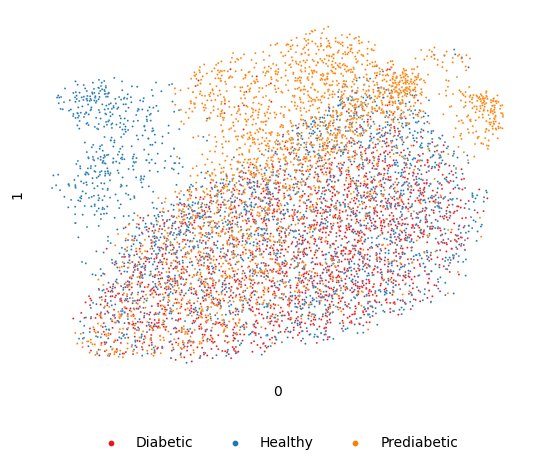

In [56]:
control_palette = [paired_palette[5],paired_palette[1],paired_palette[7]]

sns.scatterplot(data=embedding_df_again,x=0,y=1,s=2,hue="disease",palette=control_palette)

plt.legend(
    loc='upper center',
    bbox_to_anchor=(0.5, -0.12),  # center horizontally, drop below axes
    ncol=4,                       # spread the handles in one row
    frameon=False,                # optional styling
    title='',                # optional label
    markerscale=3
)
sns.despine(left=True, bottom=True)
plt.xticks([], [])
plt.yticks([], [])
plt.show()

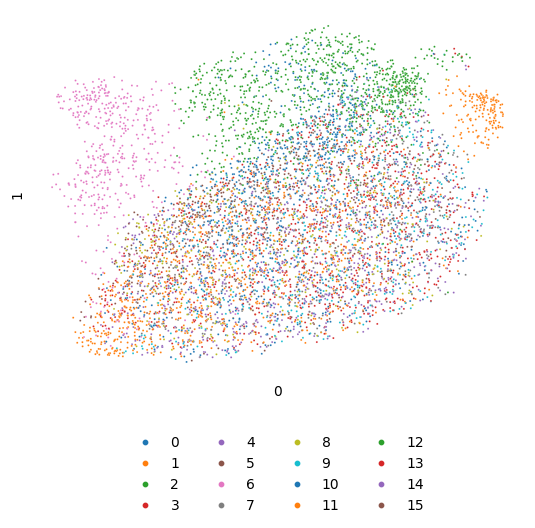

In [57]:
sns.scatterplot(data=embedding_df_again,x=0,y=1,s=2,hue="label_leiden",palette='tab10')

plt.legend(
    loc='upper center',
    bbox_to_anchor=(0.5, -0.12),  # center horizontally, drop below axes
    ncol=4,                       # spread the handles in one row
    frameon=False,                # optional styling
    title='',                # optional label
    markerscale=3
)
sns.despine(left=True, bottom=True)
plt.xticks([], [])
plt.yticks([], [])
plt.show()

In [58]:
embedding_df_again.groupby('disease').count()

,0,1,patient_id,constriction_size,disease_constric,patient_id_constric,balanced_sample,label_leiden
disease,,,,,,,,
Diabetic,2468,2468,2468,2468,2468,2468,2468,2468
Healthy,2480,2480,2480,2480,2480,2480,2480,2480
Prediabetic,2477,2477,2477,2477,2477,2477,2477,2477


In [59]:
embedding_df_again

,0,1,patient_id,constriction_size,disease,disease_constric,patient_id_constric,balanced_sample,label_leiden
7,8.276264,-12.050431,35,control,Diabetic,Diabetic_control,35_control,1,8
9,12.305482,-12.306421,46,control,Diabetic,Diabetic_control,46_control,1,10
13,10.495214,-13.566660,67,control,Diabetic,Diabetic_control,67_control,1,8
15,10.230992,-9.712666,35,control,Diabetic,Diabetic_control,35_control,1,0
16,12.384224,-9.551478,76,control,Diabetic,Diabetic_control,76_control,1,13
...,...,...,...,...,...,...,...,...,...
19187,11.294588,-7.017437,26,control,Prediabetic,Prediabetic_control,26_control,1,0
19188,9.636361,-6.944422,45,control,Prediabetic,Prediabetic_control,45_control,1,2
19190,9.889993,-9.632205,37,control,Prediabetic,Prediabetic_control,37_control,1,0
19191,13.196999,-5.949109,82,control,Prediabetic,Prediabetic_control,82_control,1,12


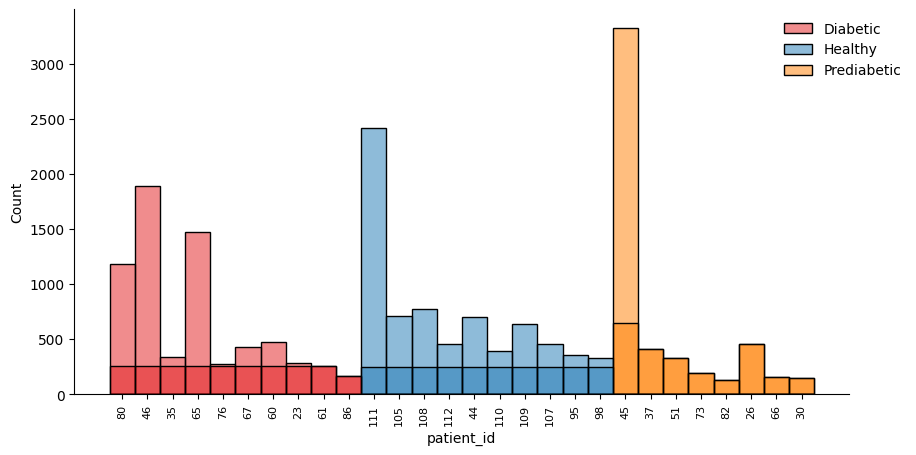

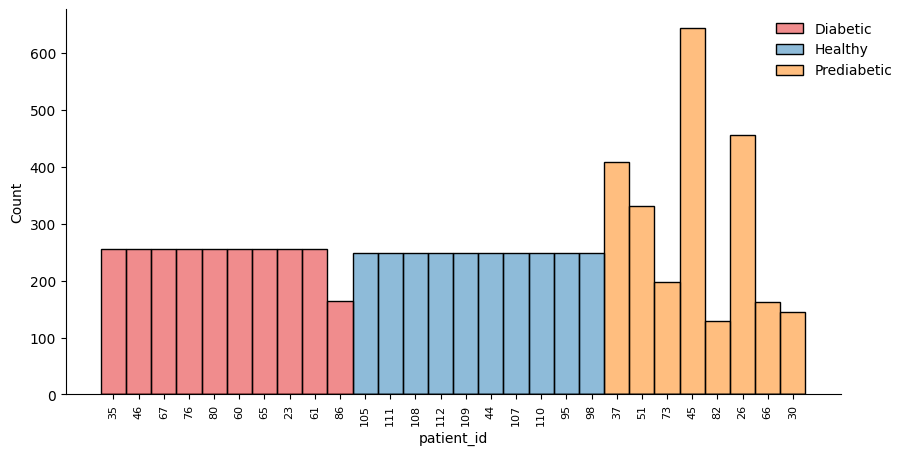

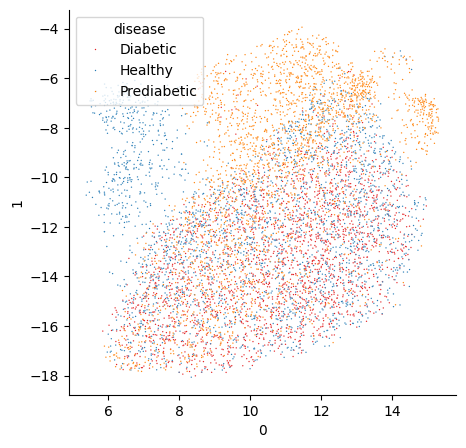

<Figure size 500x500 with 0 Axes>

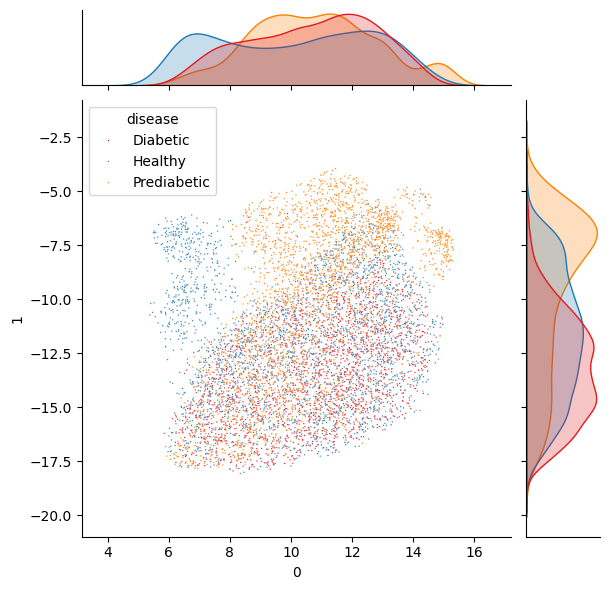

In [60]:
for_plots=latent_list_df_lab_control.dropna()
fig,ax=plt.subplots(figsize=(10,5))
sns.histplot(latent_list_df_lab_control,x='patient_id',hue='disease',palette=custom_paired_palette)
sns.histplot(for_plots,x='patient_id',hue='disease',palette=custom_paired_palette)
sns.move_legend(ax,"upper left",bbox_to_anchor=(0.9,1),title=None,frameon=False,)
plt.xticks(rotation=90,fontsize=8)
sns.despine() 
plt.show()


fig,ax=plt.subplots(figsize=(10,5))
sns.histplot(for_plots,x='patient_id',hue='disease',palette=custom_paired_palette)
sns.move_legend(ax,"upper left",bbox_to_anchor=(0.9,1),title=None,frameon=False,)
plt.xticks(rotation=90,fontsize=8)
sns.despine() 
plt.show()

plt.figure(figsize=(5, 5))
sns.scatterplot(data=embedding_df_again,x=0,y=1,s=1,hue="disease",palette=custom_paired_palette)
sns.despine() 
plt.show()

plt.figure(figsize=(5, 5))
sns.jointplot(data=embedding_df_again,x=0,y=1,s=1,hue="disease",palette=custom_paired_palette)
sns.despine() 
plt.show()

105


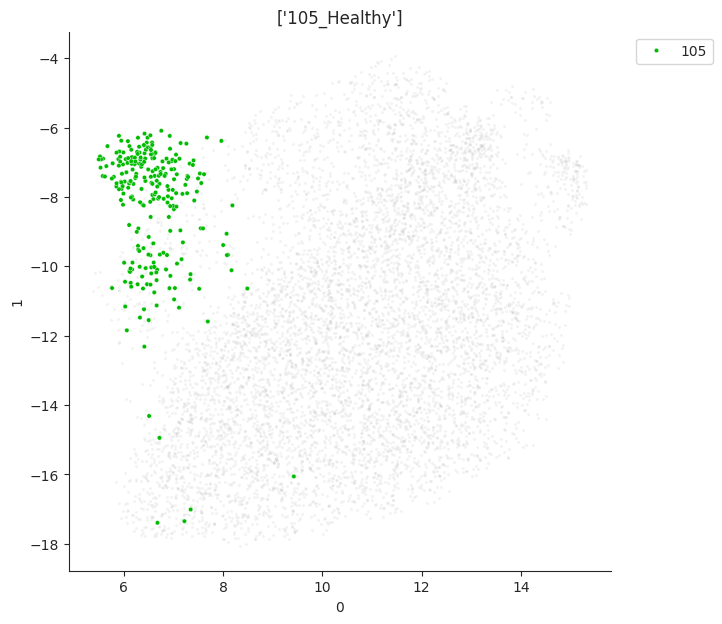

107


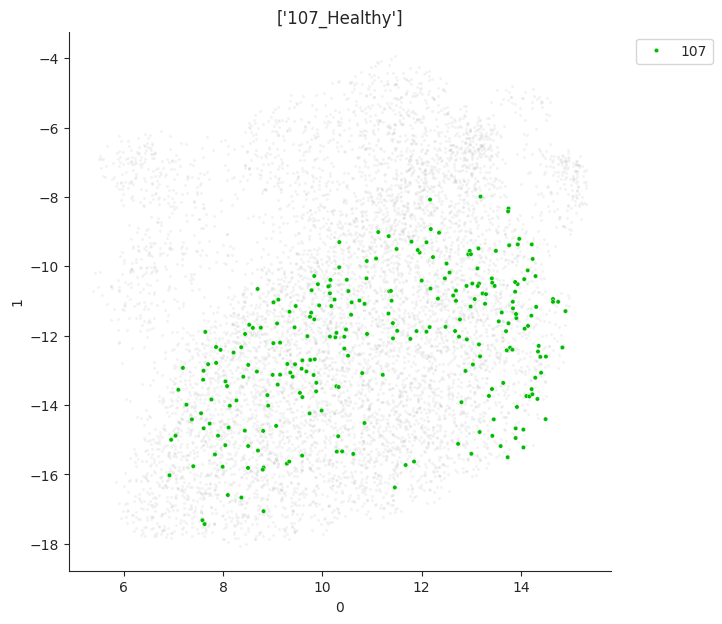

108


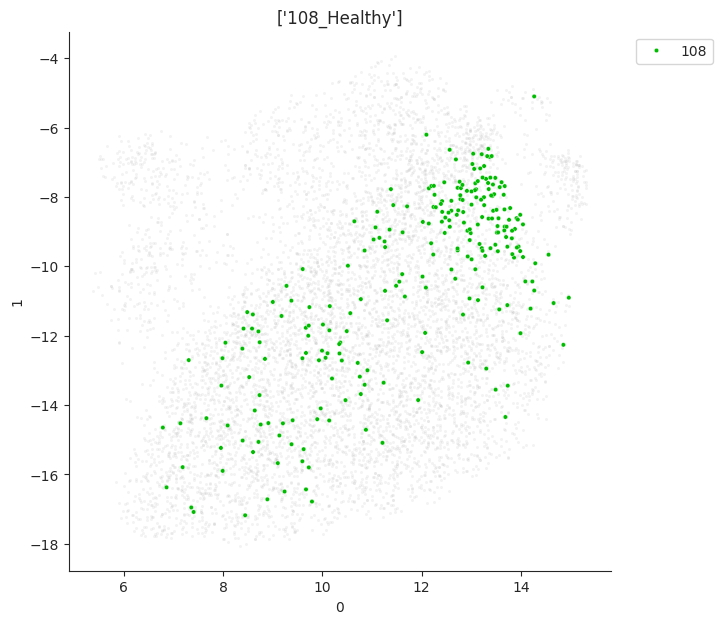

109


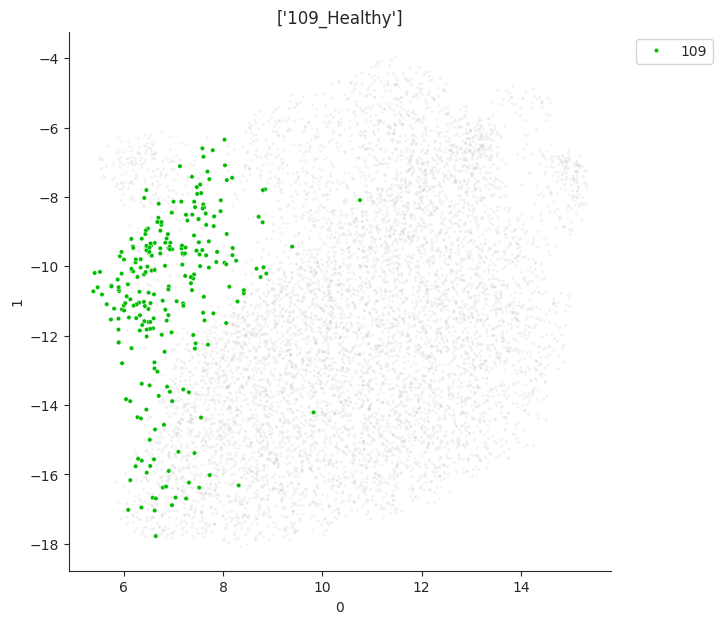

110


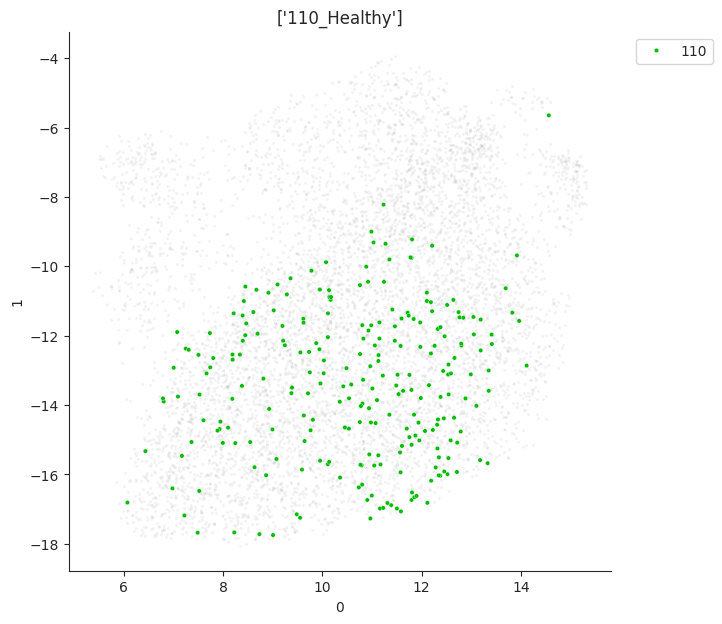

111


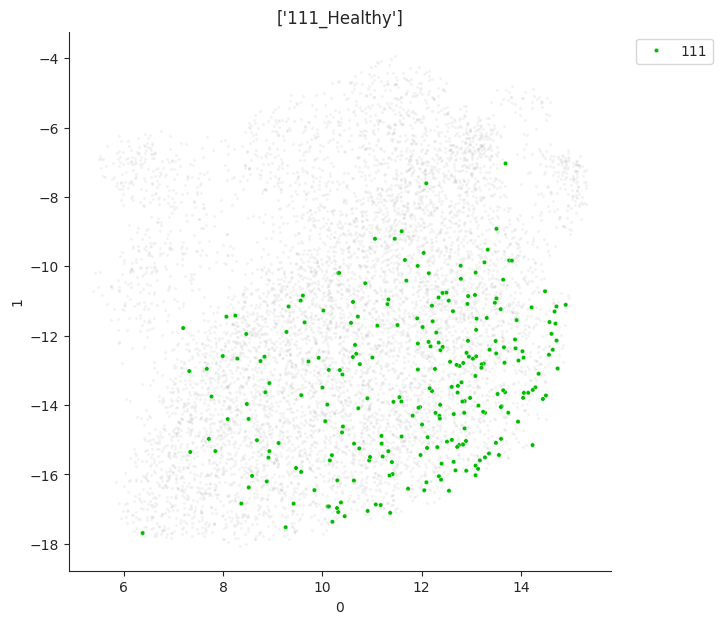

112


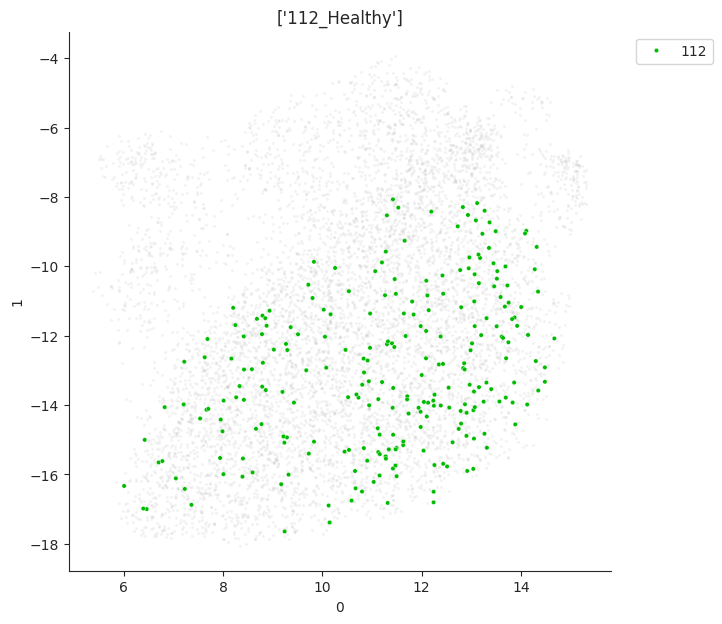

23


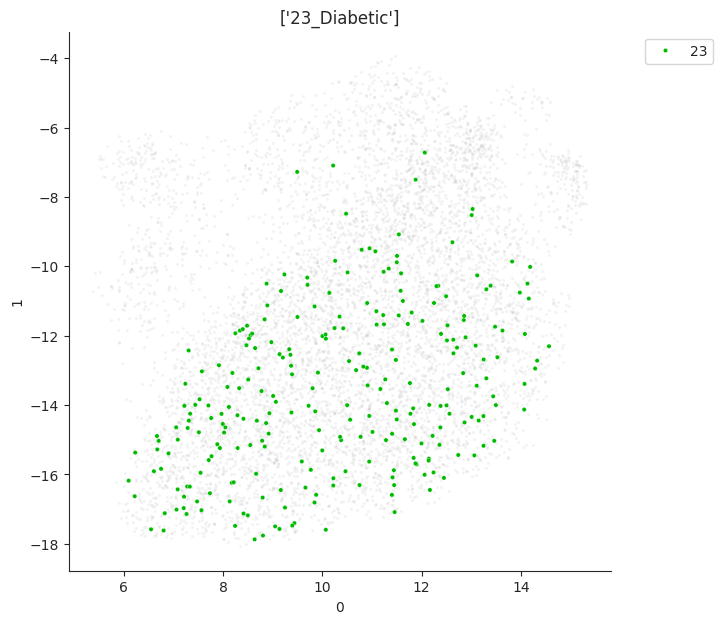

26


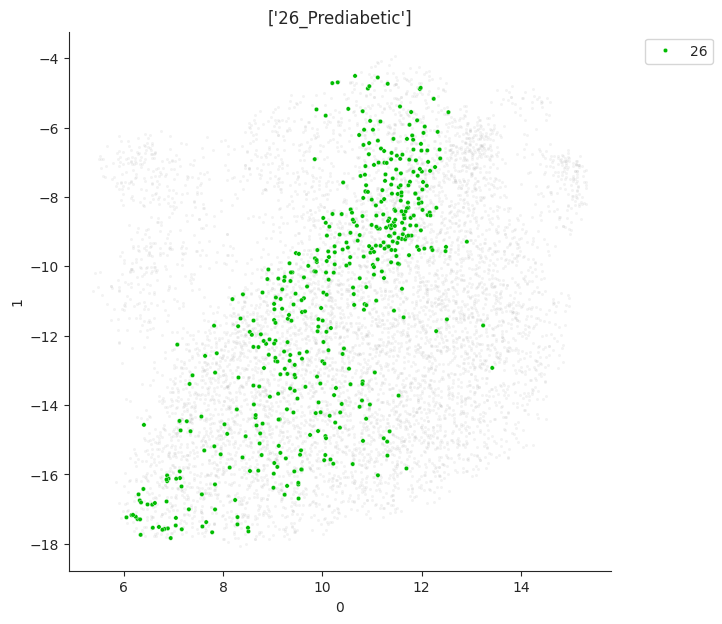

30


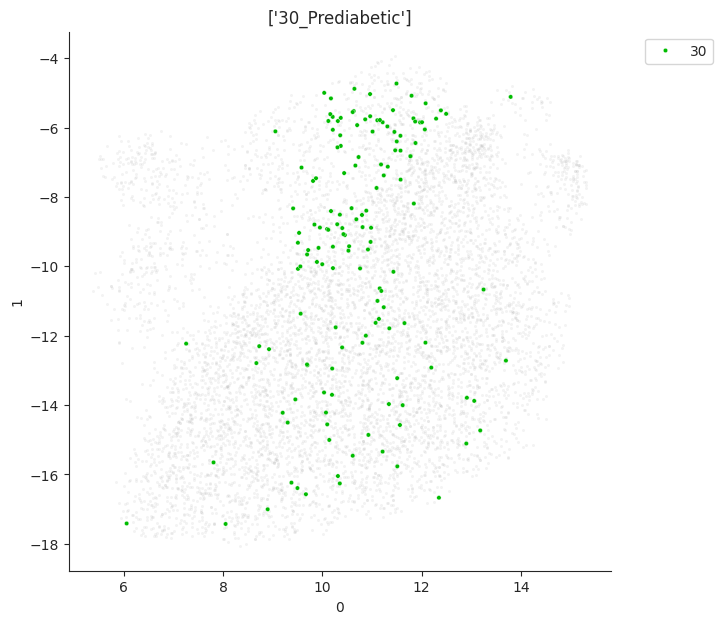

35


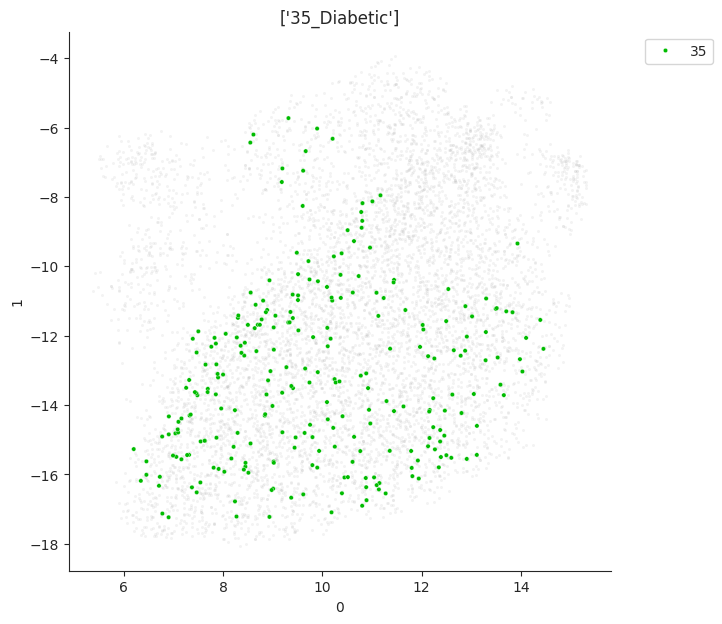

37


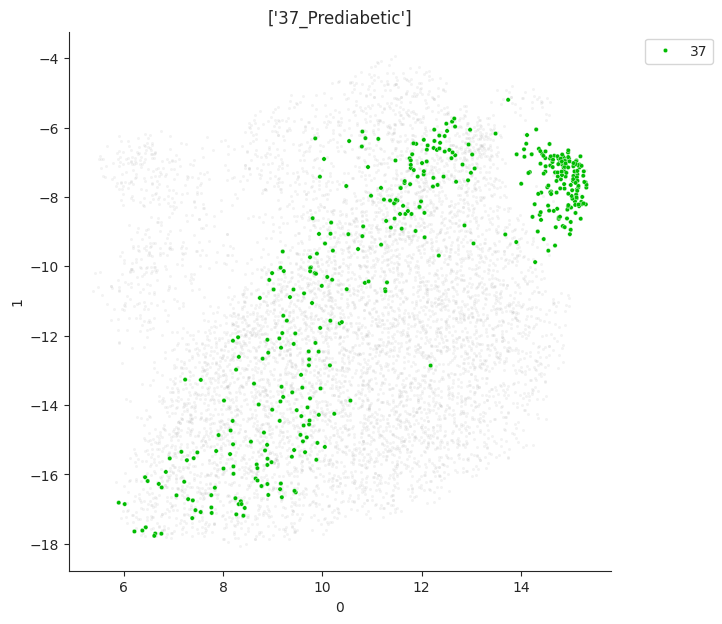

44


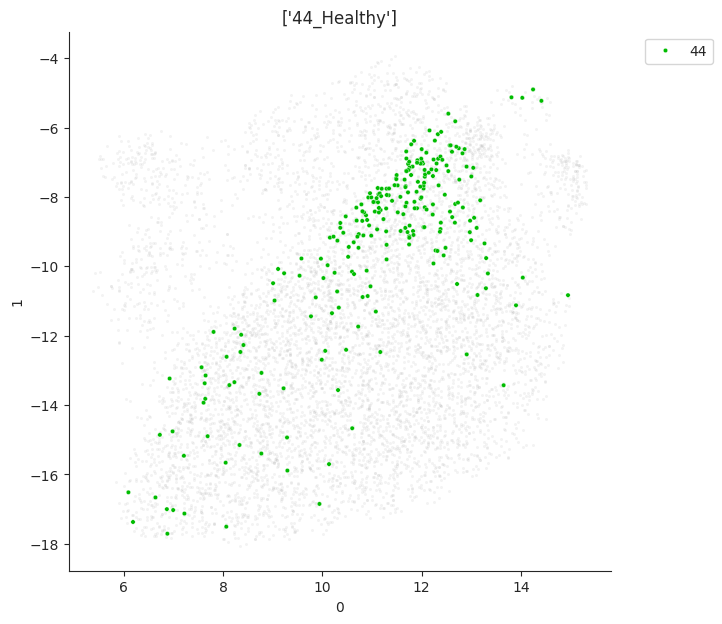

45


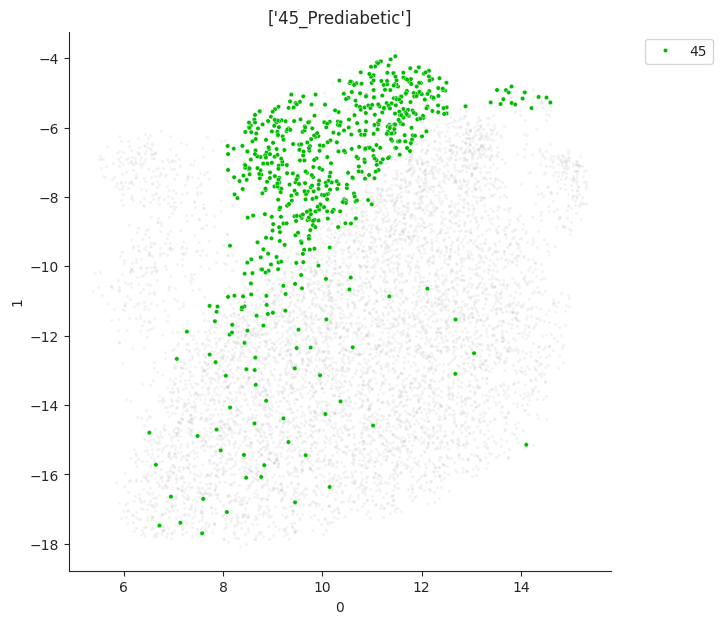

46


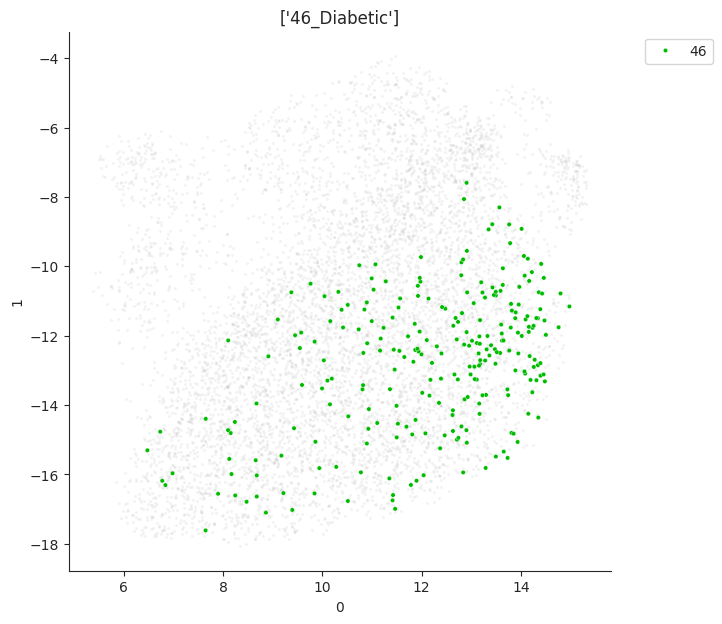

51


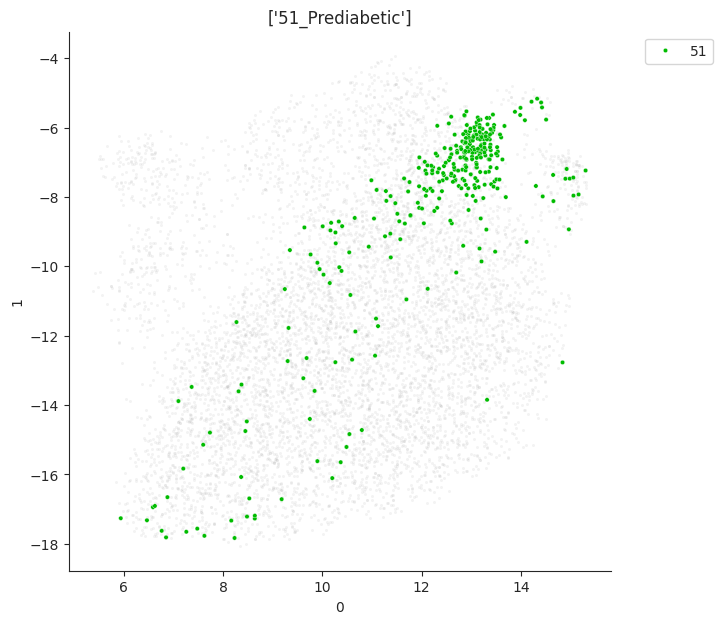

60


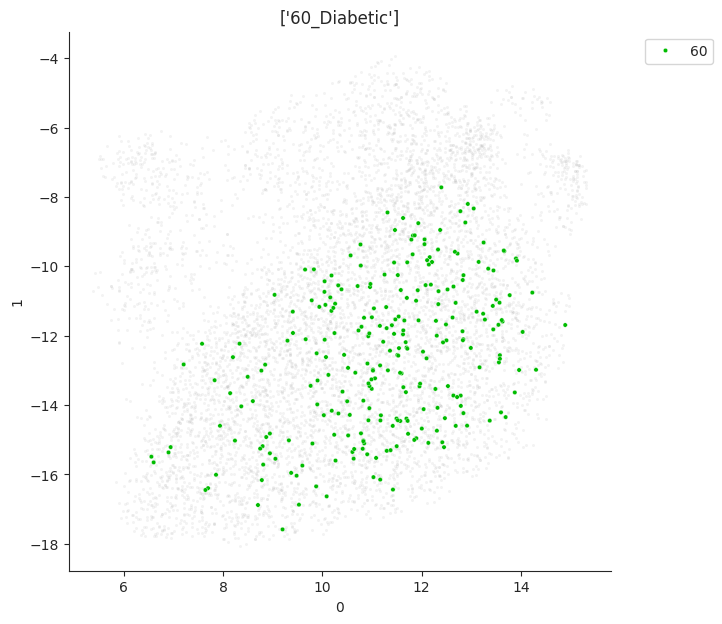

61


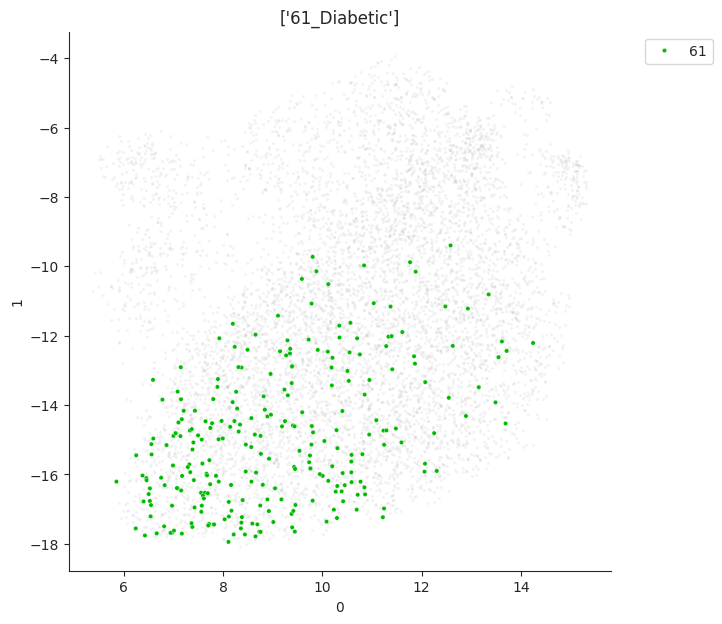

65


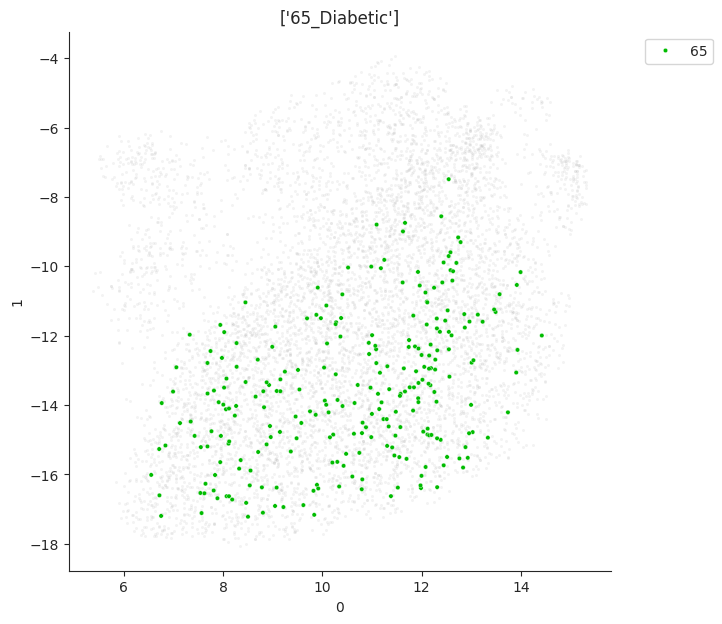

66


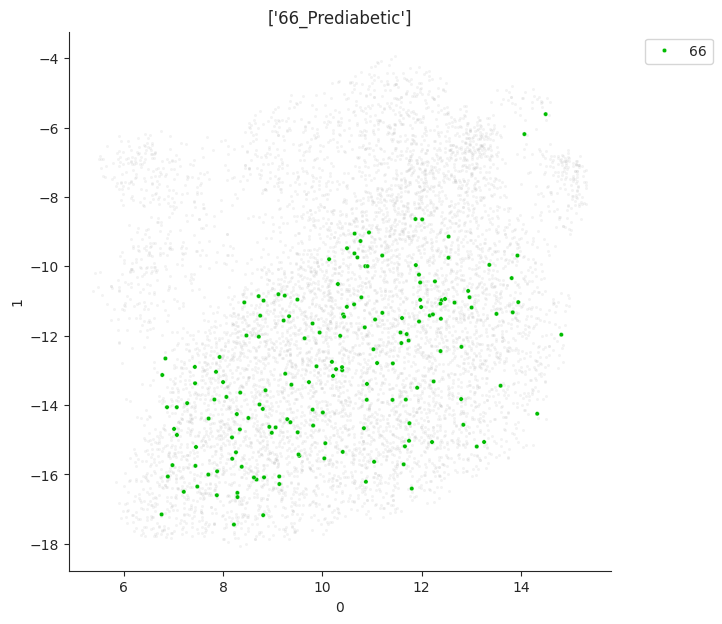

67


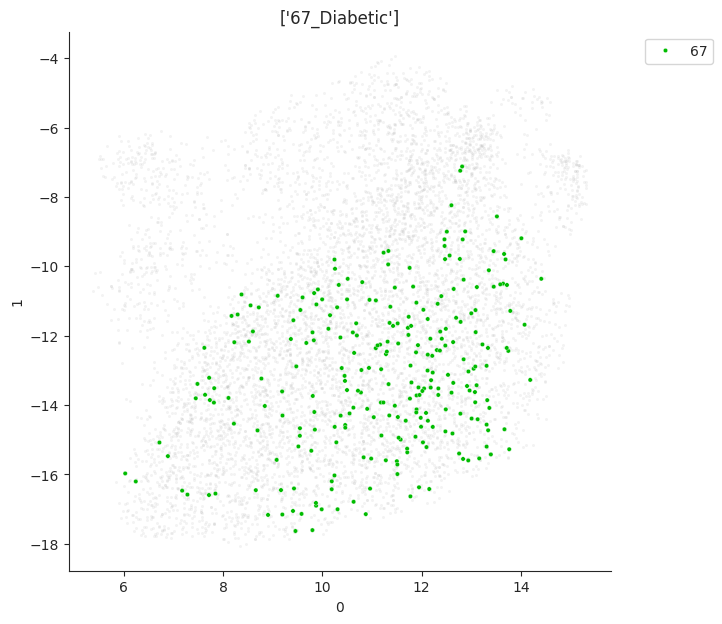

73


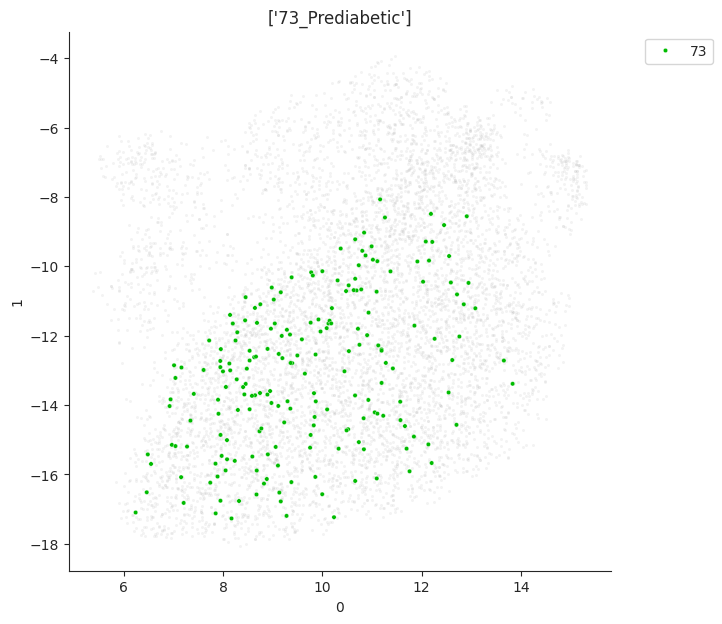

76


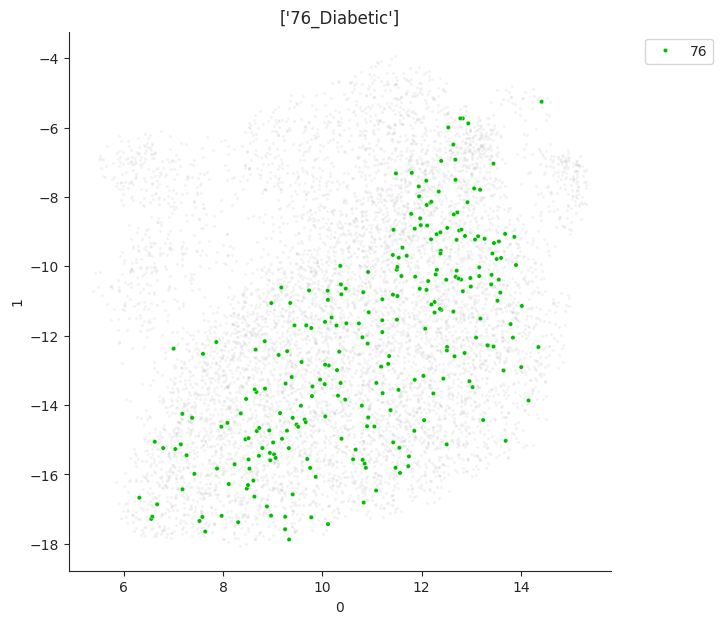

80


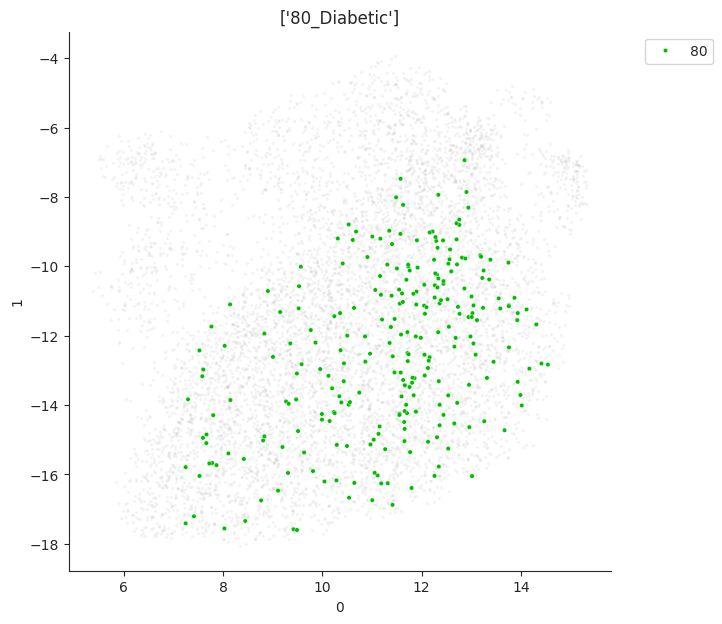

82


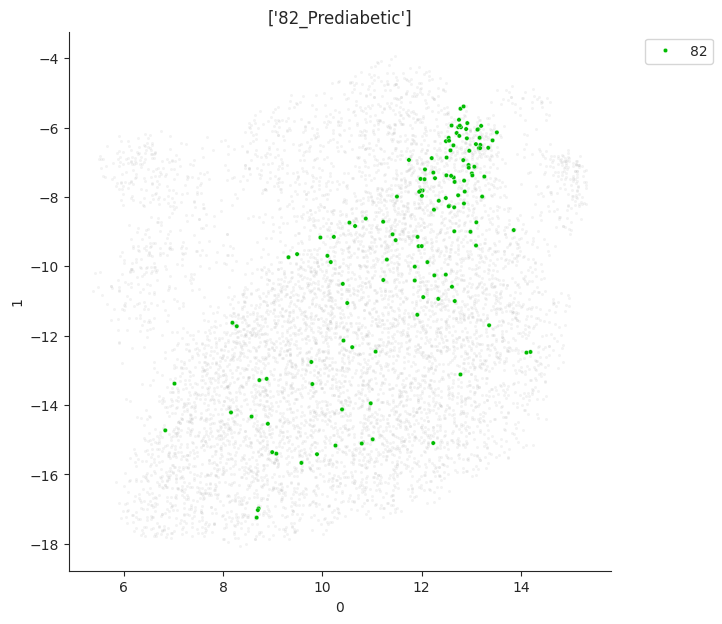

86


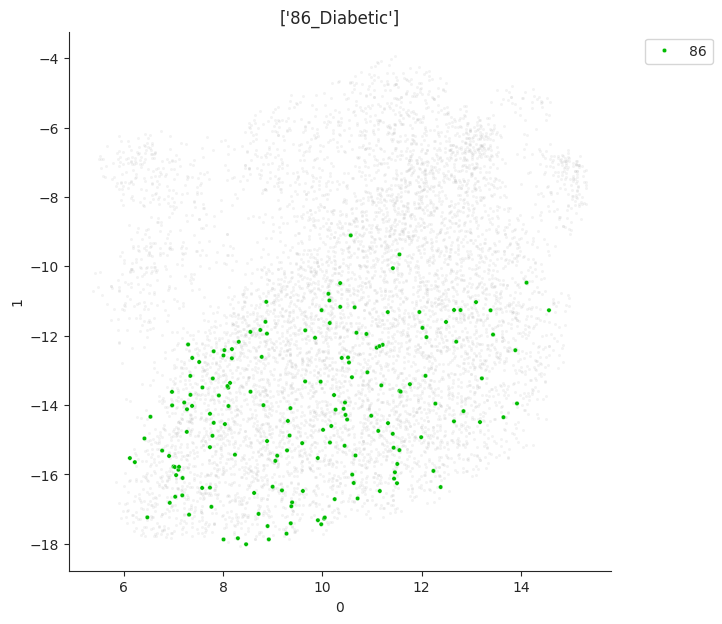

95


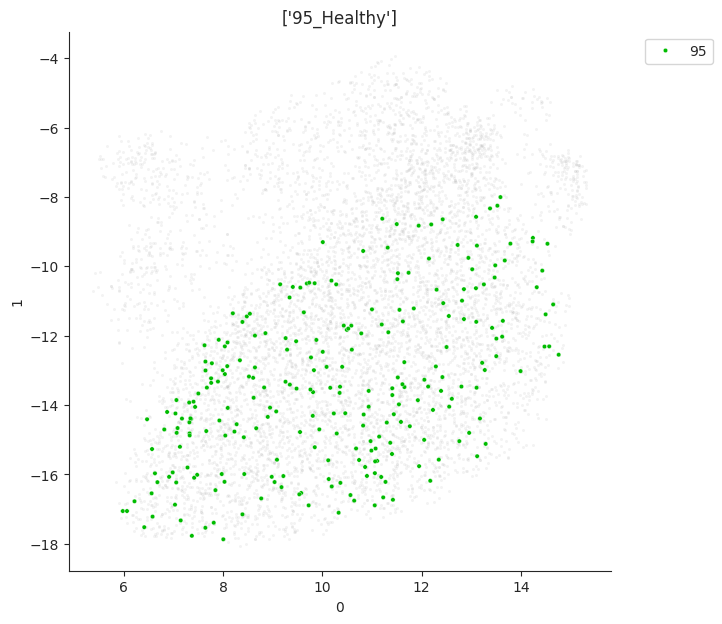

98


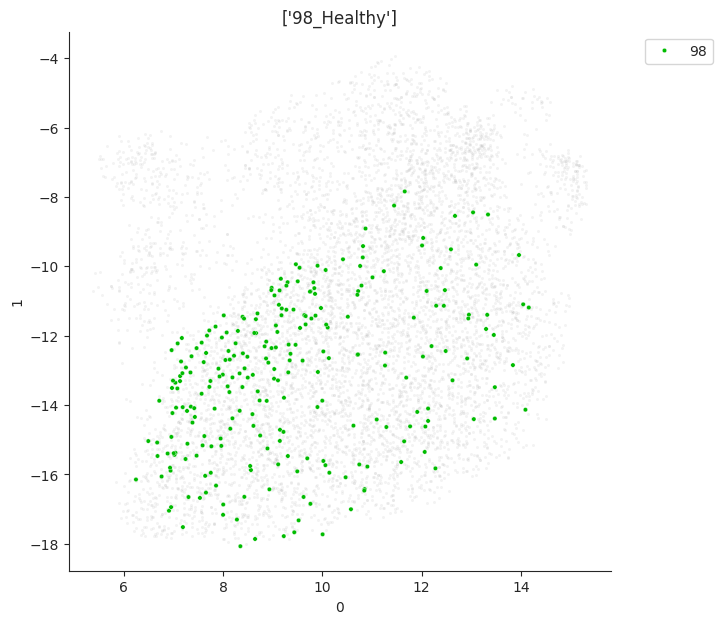

,0,1,patient_id,constriction_size,disease,disease_constric,patient_id_constric,balanced_sample,label_leiden
7,8.276264,-12.050431,35,control,Diabetic,Diabetic_control,35_control,1,8
9,12.305482,-12.306421,46,control,Diabetic,Diabetic_control,46_control,1,10
13,10.495214,-13.566660,67,control,Diabetic,Diabetic_control,67_control,1,8
15,10.230992,-9.712666,35,control,Diabetic,Diabetic_control,35_control,1,0
16,12.384224,-9.551478,76,control,Diabetic,Diabetic_control,76_control,1,13
...,...,...,...,...,...,...,...,...,...
19187,11.294588,-7.017437,26,control,Prediabetic,Prediabetic_control,26_control,1,0
19188,9.636361,-6.944422,45,control,Prediabetic,Prediabetic_control,45_control,1,2
19190,9.889993,-9.632205,37,control,Prediabetic,Prediabetic_control,37_control,1,0
19191,13.196999,-5.949109,82,control,Prediabetic,Prediabetic_control,82_control,1,12


In [61]:
for disease in np.unique(embedding_df_again['patient_id']):
    print(disease)
    plt.figure(figsize=(7, 7))
    masking_condition1=embedding_df_again['patient_id']==disease
    masking_condition2=~embedding_df_again['label_leiden'].isna()
    masking_condition=np.logical_and(masking_condition1,masking_condition2)
    temp_df=embedding_df_again[masking_condition]
    sns.set_style('ticks')
    sns.scatterplot(data=embedding_df_again[~masking_condition],x=0,y=1,s=5,color="gray", alpha=0.09)
    sns.scatterplot(data=embedding_df_again[masking_condition],x=0,y=1,s=10,hue="patient_id",palette='nipy_spectral')
    sns.despine()
    plt.legend(loc='upper right',bbox_to_anchor=(1.2, 1)) 
    np.unique(temp_df['disease'])
    plt.title(disease+'_'+np.unique(temp_df['disease']))
    plt.show()

embedding_df_again

Diabetic


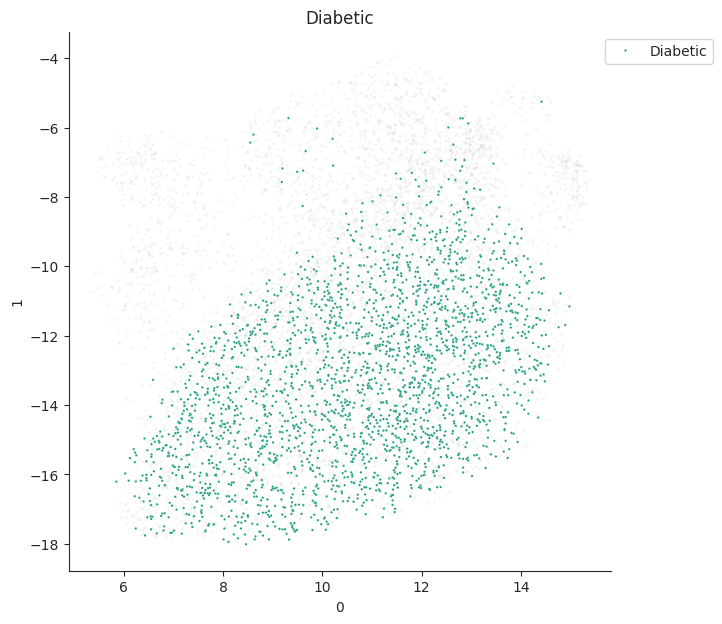

Healthy


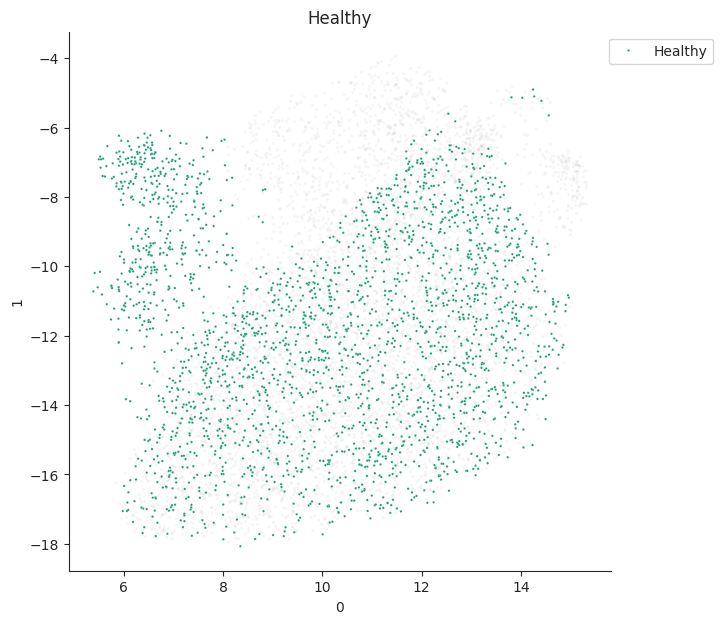

Prediabetic


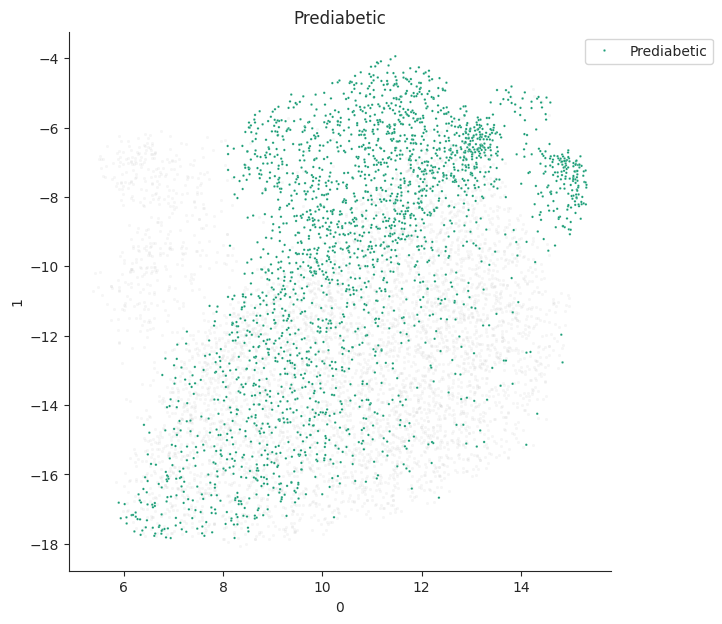

,0,1,patient_id,constriction_size,disease,disease_constric,patient_id_constric,balanced_sample,label_leiden
7,8.276264,-12.050431,35,control,Diabetic,Diabetic_control,35_control,1,8
9,12.305482,-12.306421,46,control,Diabetic,Diabetic_control,46_control,1,10
13,10.495214,-13.566660,67,control,Diabetic,Diabetic_control,67_control,1,8
15,10.230992,-9.712666,35,control,Diabetic,Diabetic_control,35_control,1,0
16,12.384224,-9.551478,76,control,Diabetic,Diabetic_control,76_control,1,13
...,...,...,...,...,...,...,...,...,...
19187,11.294588,-7.017437,26,control,Prediabetic,Prediabetic_control,26_control,1,0
19188,9.636361,-6.944422,45,control,Prediabetic,Prediabetic_control,45_control,1,2
19190,9.889993,-9.632205,37,control,Prediabetic,Prediabetic_control,37_control,1,0
19191,13.196999,-5.949109,82,control,Prediabetic,Prediabetic_control,82_control,1,12


In [62]:
for disease in np.unique(embedding_df_again['disease']):
    print(disease)
    plt.figure(figsize=(7, 7))
    masking_condition1=embedding_df_again['disease']==disease
    masking_condition2=~embedding_df_again['label_leiden'].isna()
    masking_condition=np.logical_and(masking_condition1,masking_condition2)
    
    temp_df=embedding_df_again[embedding_df_again['disease']==disease]
    sns.scatterplot(data=embedding_df_again[~masking_condition],x=0,y=1,s=5,color="gray", alpha=0.07)
    sns.scatterplot(data=embedding_df_again[masking_condition].sample(frac=1).reset_index(drop=True),x=0,y=1,s=3,hue="disease",palette='Dark2')
    sns.despine()
    plt.legend(loc='upper right',bbox_to_anchor=(1.2, 1)) 
    np.unique(temp_df['disease'])
    plt.title(disease)
#     plt.xlim(-2,2)
#     plt.ylim(-2,2)
    plt.show()

embedding_df_again

In [63]:
embedding_df_again

,0,1,patient_id,constriction_size,disease,disease_constric,patient_id_constric,balanced_sample,label_leiden
7,8.276264,-12.050431,35,control,Diabetic,Diabetic_control,35_control,1,8
9,12.305482,-12.306421,46,control,Diabetic,Diabetic_control,46_control,1,10
13,10.495214,-13.566660,67,control,Diabetic,Diabetic_control,67_control,1,8
15,10.230992,-9.712666,35,control,Diabetic,Diabetic_control,35_control,1,0
16,12.384224,-9.551478,76,control,Diabetic,Diabetic_control,76_control,1,13
...,...,...,...,...,...,...,...,...,...
19187,11.294588,-7.017437,26,control,Prediabetic,Prediabetic_control,26_control,1,0
19188,9.636361,-6.944422,45,control,Prediabetic,Prediabetic_control,45_control,1,2
19190,9.889993,-9.632205,37,control,Prediabetic,Prediabetic_control,37_control,1,0
19191,13.196999,-5.949109,82,control,Prediabetic,Prediabetic_control,82_control,1,12


In [64]:
latent_list_df_lab_control
test_df_lab_control = test_data_unlabelled_scaled_labelled_control[test_data_unlabelled_scaled_labelled_control['balanced_sample'] == 1]
test_df_lab_control['labels_leiden'] = for_clusters_assigment['labels_leiden']
test_df_lab_control

/tmp/ipykernel_2731077/2469243619.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df_lab_control['labels_leiden'] = for_clusters_assigment['labels_leiden']


,min_calliper,max_calliper,smallest_largest_calliper,min_radius,max_radius,med_radius,avg_radius,d25_radius,d75_radius,std_radius,...,HOnumnode,HOstdnodevol,HOtotnodevol,patient_id,constriction_size,disease,disease_constric,patient_id_constric,balanced_sample,labels_leiden
28407,0.555556,0.424242,0.844796,0.575672,0.340188,0.529341,0.519482,0.556836,0.397682,0.049883,...,0.219512,0.115917,0.199841,62,control,Diabetic,Diabetic_control,62_control,1,2
28394,0.555556,0.454545,0.786894,0.642931,0.368048,0.566736,0.565732,0.616825,0.430644,0.037633,...,0.219512,0.205129,0.307325,62,control,Diabetic,Diabetic_control,62_control,1,8
50934,0.518519,0.484848,0.669565,0.413018,0.440185,0.517460,0.519419,0.504746,0.455969,0.242360,...,0.292683,0.132330,0.117834,69,control,Diabetic,Diabetic_control,69_control,1,5
29798,0.555556,0.575758,0.598175,0.045786,0.455284,0.631953,0.554990,0.583088,0.515556,0.438147,...,0.195122,0.541730,0.359873,64,control,Diabetic,Diabetic_control,64_control,1,1
51012,0.629630,0.484848,0.862319,0.649406,0.382692,0.611943,0.596478,0.645004,0.459174,0.052593,...,0.317073,0.122671,0.171178,69,control,Diabetic,Diabetic_control,69_control,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47410,0.518519,0.363636,0.900870,0.579080,0.295547,0.473152,0.463787,0.510018,0.348966,0.011070,...,0.097561,0.147473,0.135350,52,control,Prediabetic,Prediabetic_control,52_control,1,2
53194,0.592593,0.484848,0.798068,0.607442,0.423280,0.565066,0.564019,0.584479,0.455882,0.106730,...,0.146341,0.235189,0.257962,78,control,Prediabetic,Prediabetic_control,78_control,1,0
56602,0.666667,0.606061,0.724638,0.597548,0.491017,0.692149,0.678932,0.686202,0.560327,0.173613,...,0.317073,0.122564,0.274682,85,control,Prediabetic,Prediabetic_control,85_control,1,8
56430,0.481481,0.454545,0.652804,0.558890,0.393490,0.566342,0.557775,0.592753,0.439455,0.087313,...,0.048780,0.280779,0.143312,85,control,Prediabetic,Prediabetic_control,85_control,1,1


In [65]:
table_control_pat_spec_vec_list=[]
for pid in np.unique(embedding_df_again['patient_id']):
    print(pid)
    masking_condition=embedding_df_again['patient_id']==pid
    embedding_control_patient_spec=embedding_df_again[masking_condition]
    cluster_control_pathalogy_pat_spec=embedding_control_patient_spec.groupby(['label_leiden', 'disease']).size().reset_index(name='count')
    cluster_control_pathalogy_pat_spec=embedding_control_patient_spec.groupby(['label_leiden', 'disease']).size().reset_index(name='count')
    table_control_pat_spec_vec = cluster_control_pathalogy_pat_spec.pivot(index='disease',columns= 'label_leiden', values='count')
    table_control_pat_spec_vec=table_control_pat_spec_vec/table_control_pat_spec_vec.sum(axis=1)[0]
    table_control_pat_spec_vec['patient_id']=pid
    table_control_pat_spec_vec=table_control_pat_spec_vec.reset_index()
    table_control_pat_spec_vec_list.append(table_control_pat_spec_vec)

table_test_pat_spec_vec_list=[]
for pid in np.unique(test_df_lab_control['patient_id']):
    print(pid)
    masking_condition=test_df_lab_control['patient_id']==pid
    test_df_lab_control_patient_spec=test_df_lab_control[masking_condition]
    cluster_test_pathalogy_pat_spec=test_df_lab_control_patient_spec.groupby(['labels_leiden', 'disease']).size().reset_index(name='count')
    cluster_test_pathalogy_pat_spec=test_df_lab_control_patient_spec.groupby(['labels_leiden', 'disease']).size().reset_index(name='count')
    table_test_pat_spec_vec = cluster_test_pathalogy_pat_spec.pivot(index='disease',columns= 'labels_leiden', values='count')
    table_test_pat_spec_vec=table_test_pat_spec_vec/table_test_pat_spec_vec.sum(axis=1)[0]
    table_test_pat_spec_vec['patient_id']=pid
    table_test_pat_spec_vec=table_test_pat_spec_vec.reset_index()
    table_test_pat_spec_vec_list.append(table_test_pat_spec_vec)
 
    

table_control_pat_spec_vec_df=pd.concat(table_control_pat_spec_vec_list, ignore_index=True)
table_control_pat_spec_vec_df=table_control_pat_spec_vec_df.sort_values('disease')
table_control_pat_spec_vec_df.fillna(0, inplace=True)
table_control_pat_spec_vec_df

table_test_pat_spec_vec_df=pd.concat(table_test_pat_spec_vec_list, ignore_index=True)
table_test_pat_spec_vec_df=table_test_pat_spec_vec_df.sort_values('disease')
table_test_pat_spec_vec_df.fillna(0, inplace=True)
table_test_pat_spec_vec_df

# table_control_pat_spec_vec_df.to_csv('hand_crafted_table_control_pat_spec_vec_df_htmap_1.csv')

105
107
108
109
110
111
112
23
26
30
35
37
44
45
46
51
60
61
65
66
67
73
76
80
82
86
95
98
103
106
113
52
55
62
64
69
74
78
85
97
99


labels_leiden,disease,0,1,10,11,12,13,14,2,3,5,8,patient_id,6,15,4,7,9
4,Diabetic,0.026667,0.297778,0.026667,0.022222,0.00000,0.173333,0.080000,0.008889,0.026667,0.137778,0.142222,55,0.000000,0.004444,0.035556,0.004444,0.013333
5,Diabetic,0.070234,0.193980,0.006689,0.013378,0.00000,0.160535,0.096990,0.193980,0.003344,0.090301,0.150502,62,0.006689,0.000000,0.013378,0.000000,0.000000
6,Diabetic,0.024242,0.096970,0.124242,0.009091,0.00000,0.033333,0.024242,0.066667,0.106061,0.081818,0.066667,64,0.009091,0.015152,0.154545,0.109091,0.078788
7,Diabetic,0.051515,0.175758,0.000000,0.006061,0.00000,0.069697,0.060606,0.518182,0.000000,0.066667,0.048485,69,0.003030,0.000000,0.000000,0.000000,0.000000
0,Healthy,0.072000,0.200000,0.008000,0.040000,0.02400,0.112000,0.144000,0.128000,0.008000,0.128000,0.136000,103,0.000000,0.000000,0.000000,0.000000,0.000000
1,Healthy,0.107383,0.275168,0.000000,0.000000,0.00000,0.060403,0.144295,0.090604,0.000000,0.147651,0.100671,106,0.073826,0.000000,0.000000,0.000000,0.000000
2,Healthy,0.093960,0.040268,0.000000,0.023490,0.00000,0.000000,0.013423,0.426174,0.000000,0.013423,0.000000,113,0.389262,0.000000,0.000000,0.000000,0.000000
11,Healthy,0.006711,0.197987,0.023490,0.003356,0.02349,0.137584,0.073826,0.057047,0.060403,0.100671,0.120805,97,0.000000,0.013423,0.100671,0.057047,0.023490
12,Healthy,0.025157,0.018868,0.000000,0.025157,0.00000,0.006289,0.000000,0.496855,0.000000,0.025157,0.018868,99,0.377358,0.000000,0.006289,0.000000,0.000000
3,Prediabetic,0.097015,0.052239,0.002488,0.059701,0.08209,0.007463,0.012438,0.407960,0.000000,0.012438,0.007463,52,0.258706,0.000000,0.000000,0.000000,0.000000


In [66]:
table_control_pat_spec_vec_df

label_leiden,disease,6,11,patient_id,1,3,4,5,7,9,10,15,2,0,8,13,14,12
25,Diabetic,0.000000,0.018293,86,0.268293,0.006098,0.000000,0.219512,0.000000,0.000000,0.018293,0.006098,0.000000,0.006098,0.128049,0.182927,0.146341,0.000000
23,Diabetic,0.000000,0.003906,80,0.218750,0.000000,0.000000,0.171875,0.000000,0.000000,0.000000,0.003906,0.007812,0.023438,0.207031,0.195312,0.125000,0.042969
22,Diabetic,0.000000,0.054688,76,0.203125,0.000000,0.003906,0.152344,0.003906,0.000000,0.000000,0.000000,0.003906,0.000000,0.175781,0.218750,0.054688,0.128906
20,Diabetic,0.000000,0.000000,67,0.292969,0.000000,0.000000,0.191406,0.000000,0.000000,0.000000,0.007812,0.000000,0.003906,0.187500,0.199219,0.105469,0.011719
18,Diabetic,0.000000,0.003906,65,0.000000,0.191406,0.203125,0.031250,0.191406,0.179688,0.179688,0.019531,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
17,Diabetic,0.000000,0.046875,61,0.003906,0.269531,0.218750,0.027344,0.132812,0.160156,0.136719,0.003906,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,Diabetic,0.000000,0.011719,23,0.312500,0.000000,0.000000,0.261719,0.000000,0.000000,0.000000,0.007812,0.007812,0.000000,0.160156,0.125000,0.105469,0.007812
16,Diabetic,0.000000,0.000000,60,0.000000,0.191406,0.210938,0.046875,0.203125,0.164062,0.156250,0.027344,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
14,Diabetic,0.000000,0.003906,46,0.003906,0.214844,0.167969,0.023438,0.226562,0.226562,0.125000,0.007812,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
10,Diabetic,0.000000,0.007812,35,0.296875,0.000000,0.000000,0.152344,0.000000,0.000000,0.000000,0.000000,0.019531,0.140625,0.167969,0.070312,0.136719,0.007812


In [67]:

def random_forest_classifier_leave_one_out(train, test, columns_drop, column_test):
    X_train = train.drop(columns_drop, axis=1)
    y_train = train[column_test]
    X_test = test.drop(columns_drop, axis=1)
    y_test = test[column_test]

    smote = SMOTE(random_state=42)
    X_res, y_res = smote.fit_resample(X_train, y_train)

    rf_clf = RandomForestClassifier(n_estimators=300, max_features=20, random_state=42)

    kfold = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(rf_clf, X_train, y_train, cv=kfold, scoring="accuracy")
    print(f"CV accuracy: {cv_scores.mean():.3f} ± {cv_scores.std():.3f}")

    rf_clf.fit(X_res, y_res)  # actually train on the SMOTE output
    y_pred = rf_clf.predict(X_test)
    y_proba = rf_clf.predict_proba(X_test)          # class-wise probabilities
    y_score = rf_clf.predict_proba(X_test)[:, 1] 

    global_importances = pd.Series(rf_clf.feature_importances_, index=X_train.columns)
    global_importances.sort_values().plot.barh(color="green")
    plt.xlabel("Importance")
    plt.ylabel("Feature")
    plt.title("Global Feature Importance - Built-in Method")

    return y_pred, y_proba,y_score,y_test, rf_clf.classes_






/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(


CV accuracy: 0.633 ± 0.140


/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


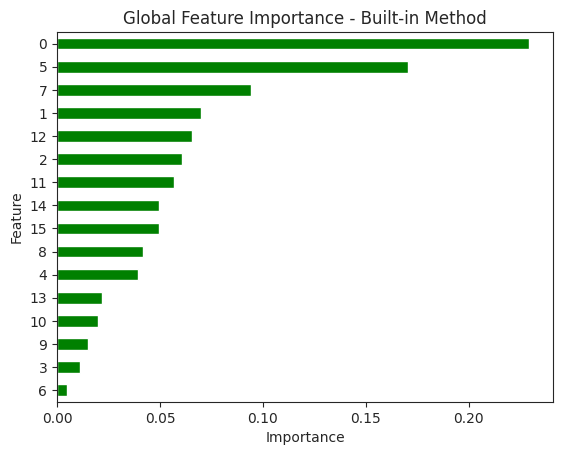

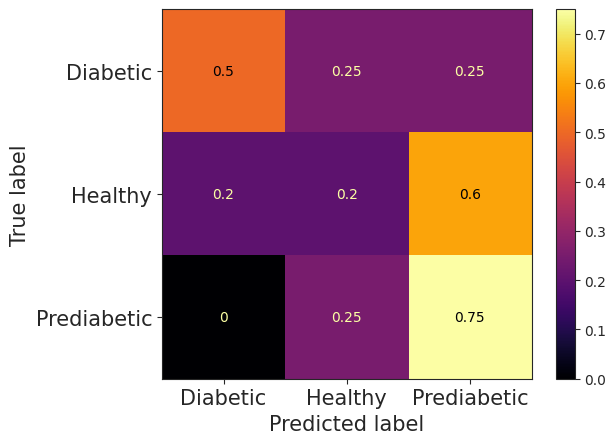

Macro ROC-AUC: 0.701
Diabetic
[0.55666667 0.38666667 0.19       0.31666667 0.35333333 0.08333333
 0.14333333 0.47666667 0.04666667 0.18666667 0.04666667 0.08666667
 0.27333333]
Healthy
[0.24666667 0.25       0.10666667 0.49666667 0.46333333 0.22333333
 0.26       0.24333333 0.28       0.19666667 0.31       0.2
 0.42      ]
Prediabetic
[0.19666667 0.36333333 0.70333333 0.18666667 0.18333333 0.69333333
 0.59666667 0.28       0.67333333 0.61666667 0.64333333 0.71333333
 0.30666667]


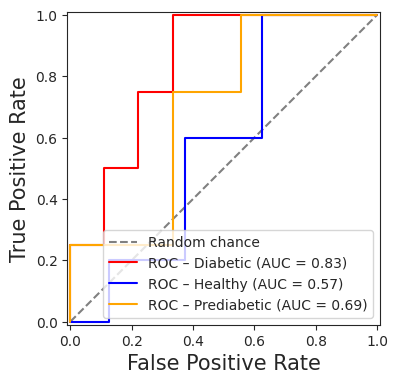

In [71]:
from sklearn.base import clone
from sklearn.model_selection import train_test_split, cross_val_score, KFold, cross_val_predict
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import RandomOverSampler, SMOTE
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, ConfusionMatrixDisplay
from tqdm import tqdm
from sklearn.preprocessing import LabelBinarizer
from sklearn.inspection import permutation_importance
from sklearn.model_selection import permutation_test_score
from sklearn.metrics import RocCurveDisplay
from imblearn.pipeline import Pipeline
from sklearn.metrics import (
    classification_report, confusion_matrix, roc_auc_score,
    RocCurveDisplay, ConfusionMatrixDisplay
)
class_colors = {
    "Healthy": "blue",
    "Diabetic": "red",
    "Prediabetic": "orange",
}

y_pred, y_proba,y_score, y_test, class_names = random_forest_classifier_leave_one_out(
    table_control_pat_spec_vec_df,
    table_test_pat_spec_vec_df,
    columns_drop=["patient_id", "disease"],
    column_test="disease",
)




# confusion matrix and ROC
cm = confusion_matrix(y_test, y_pred, labels=class_names, normalize="true")
ConfusionMatrixDisplay(cm, display_labels=class_names).plot(cmap="inferno")
plt.xlabel("Predicted label", fontsize = 15)
plt.ylabel("True label", fontsize = 15)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.show()  

lb = LabelBinarizer().fit(class_names)
roc_auc = roc_auc_score(lb.transform(y_test), y_proba, multi_class="ovo", average="macro")
print(f"Macro ROC-AUC: {roc_auc:.3f}")
# assuming y_test, y_proba, class_names, lb from the previous step
y_test_bin = lb.transform(y_test)

plt.figure(figsize=(4, 4))
plt.plot([0, 1], [0, 1], linestyle="--", color="gray", label="Random chance")


# micro-average across all classes
for idx, label in enumerate(class_names):
    print(label)
    print(y_proba[:, idx])
    RocCurveDisplay.from_predictions(
        y_test_bin[:, idx],
        y_proba[:, idx],
        name=f"ROC – {label}",
        color=class_colors[label],
        ax=plt.gca()
    )
plt.title("")
plt.legend(loc="lower right")
plt.tight_layout()
plt.xlabel("False Positive Rate", fontsize = 15)
plt.ylabel("True Positive Rate", fontsize = 15)
plt.show()


In [75]:
pd.DataFrame({'y_pred': y_pred, 'y_test': y_test})

,y_pred,y_test
4,Diabetic,Diabetic
5,Diabetic,Diabetic
6,Prediabetic,Diabetic
7,Healthy,Diabetic
0,Healthy,Healthy
1,Prediabetic,Healthy
2,Prediabetic,Healthy
11,Diabetic,Healthy
12,Prediabetic,Healthy
3,Prediabetic,Prediabetic


/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(


CV accuracy: 0.733 ± 0.276


/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


Macro ROC-AUC: 0.125


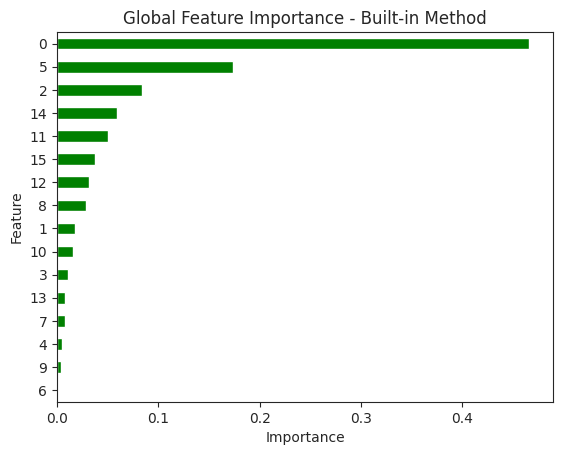

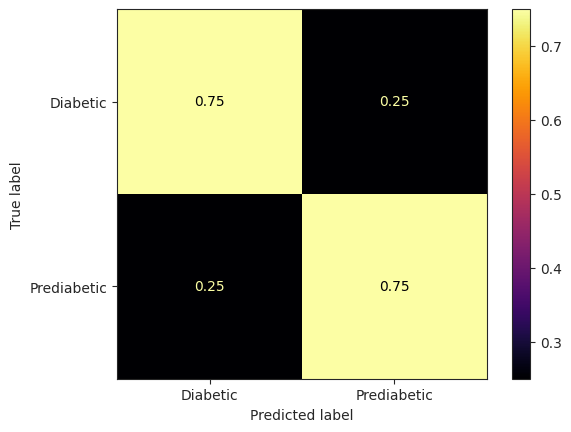

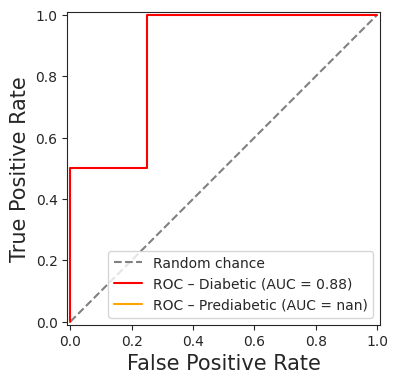

In [82]:
train = table_control_pat_spec_vec_df[table_control_pat_spec_vec_df['disease'] != "Healthy"]
test = table_test_pat_spec_vec_df[table_test_pat_spec_vec_df['disease'] != "Healthy"]

y_pred, y_proba,y_score, y_test, class_names = random_forest_classifier_leave_one_out(train,test,['patient_id','disease'],'disease')

cm = confusion_matrix(y_test, y_pred, labels=class_names, normalize="true")
ConfusionMatrixDisplay(cm, display_labels=class_names).plot(cmap="inferno")

y_test_vec = y_test.squeeze()  # Series / 1-D array
pos_col = np.where(class_names == "Diabetic")[0][0]

roc_auc = roc_auc_score(y_test_vec, y_proba[:, pos_col])

print(f"Macro ROC-AUC: {roc_auc:.3f}")
# assuming y_test, y_proba, class_names, lb from the previous step
y_test_bin = lb.transform(y_test)

plt.figure(figsize=(4, 4))
plt.plot([0, 1], [0, 1], linestyle="--", color="gray", label="Random chance")


# micro-average across all classes
for idx, label in enumerate(class_names):
    
    RocCurveDisplay.from_predictions(
        y_test_bin[:, idx],
        y_proba[:, idx],
        name=f"ROC – {label}",
        color=class_colors[label],
        ax=plt.gca()
    )
plt.title("")
plt.legend(loc="lower right")
plt.tight_layout()
plt.xlabel("False Positive Rate", fontsize = 15)
plt.ylabel("True Positive Rate", fontsize = 15)
plt.show()

In [86]:
pd.DataFrame({'y_pred': y_pred, 'y_test': y_test,'pat_test': test['patient_id']})

,y_pred,y_test,pat_test
4,Diabetic,Diabetic,55
5,Diabetic,Diabetic,62
6,Prediabetic,Diabetic,64
7,Diabetic,Diabetic,69
3,Prediabetic,Prediabetic,52
8,Prediabetic,Prediabetic,74
9,Prediabetic,Prediabetic,78
10,Diabetic,Prediabetic,85


/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(


CV accuracy: 0.700 ± 0.100


/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


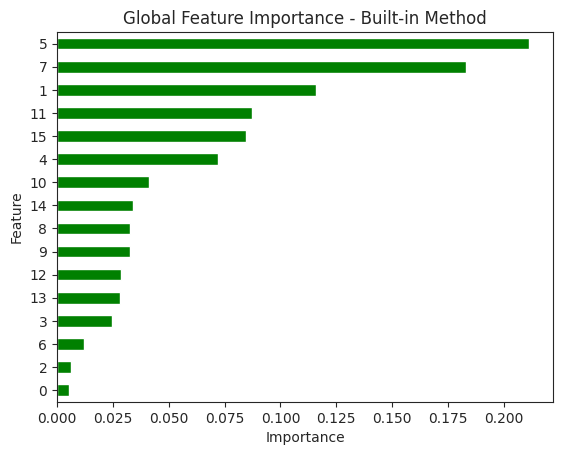

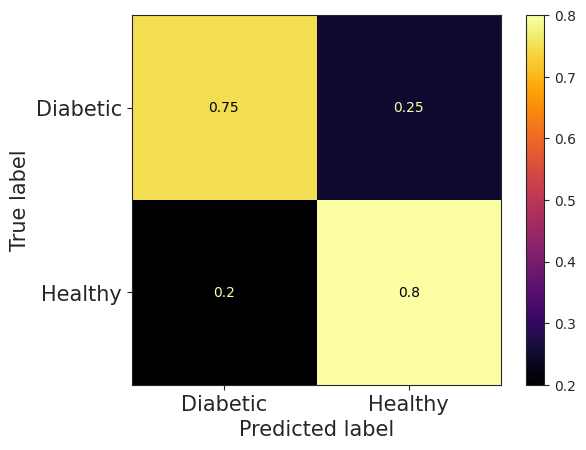

Macro ROC-AUC: 0.900
Diabetic
[0.71333333 0.64       0.59       0.40333333 0.46       0.34333333
 0.36       0.54666667 0.18      ]
Healthy
[0.28666667 0.36       0.41       0.59666667 0.54       0.65666667
 0.64       0.45333333 0.82      ]


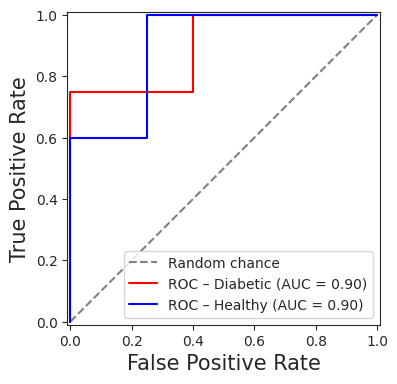

In [87]:
train = table_control_pat_spec_vec_df[table_control_pat_spec_vec_df['disease'] != "Prediabetic"]
test = table_test_pat_spec_vec_df[table_test_pat_spec_vec_df['disease'] != "Prediabetic"]
y_pred, y_proba,y_score, y_test, class_names = random_forest_classifier_leave_one_out(train,test,['patient_id','disease'],'disease')

cm = confusion_matrix(y_test, y_pred, labels=class_names, normalize="true")
ConfusionMatrixDisplay(cm, display_labels=class_names).plot(cmap="inferno")
plt.xlabel("Predicted label", fontsize = 15)
plt.ylabel("True label", fontsize = 15)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.show() 

y_test_series = y_test.squeeze()                  # 1-D labels
y_test_bin = lb.transform(y_test_series)          # same shape as y_proba

roc_auc = roc_auc_score(y_test_bin, y_proba,
                        multi_class="ovo", average="macro")

print(f"Macro ROC-AUC: {roc_auc:.3f}")
# assuming y_test, y_proba, class_names, lb from the previous step
y_test_bin = lb.transform(y_test)

plt.figure(figsize=(4, 4))
plt.plot([0, 1], [0, 1], linestyle="--", color="gray", label="Random chance")


# micro-average across all classes
for idx, label in enumerate(class_names):
    print(label)
    print(y_proba[:, idx])
    RocCurveDisplay.from_predictions(
        y_test_bin[:, idx],
        y_proba[:, idx],
        name=f"ROC – {label}",
        color=class_colors[label],
        ax=plt.gca()
    )
plt.title("")
plt.legend(loc="lower right")
plt.tight_layout()
plt.xlabel("False Positive Rate", fontsize = 15)
plt.ylabel("True Positive Rate", fontsize = 15)
plt.show()

In [88]:
pd.DataFrame({'y_pred': y_pred, 'y_test': y_test,'pat_test': test['patient_id']})

,y_pred,y_test,pat_test
4,Diabetic,Diabetic,55
5,Diabetic,Diabetic,62
6,Diabetic,Diabetic,64
7,Healthy,Diabetic,69
0,Healthy,Healthy,103
1,Healthy,Healthy,106
2,Healthy,Healthy,113
11,Diabetic,Healthy,97
12,Healthy,Healthy,99


/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(


CV accuracy: 0.850 ± 0.200


/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


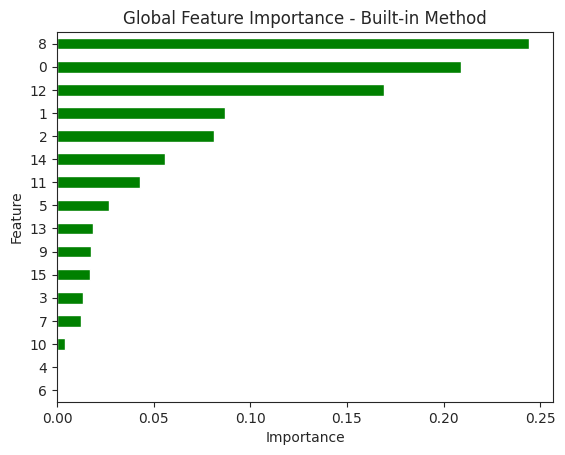

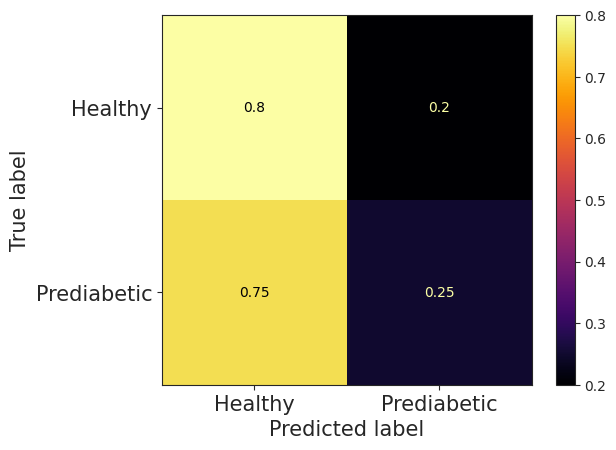

Macro ROC-AUC: nan
Healthy
[0.84333333 0.60333333 0.66666667 0.34       0.58       0.66666667
 0.64333333 0.59666667 0.44333333]
Prediabetic
[0.15666667 0.39666667 0.33333333 0.66       0.42       0.33333333
 0.35666667 0.40333333 0.55666667]


/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:379: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


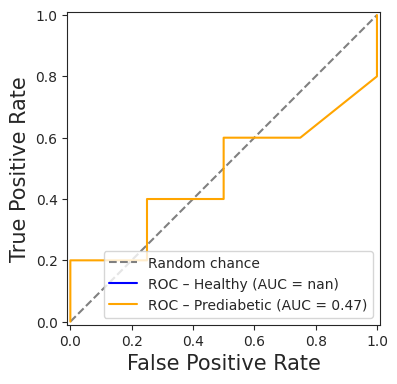

In [ ]:
train = table_control_pat_spec_vec_df[table_control_pat_spec_vec_df['disease'] != "Diabetic"]
test = table_test_pat_spec_vec_df[table_test_pat_spec_vec_df['disease'] != "Diabetic"]

y_pred, y_proba,y_score, y_test, class_names = random_forest_classifier_leave_one_out(train,test,['patient_id','disease'],'disease')

cm = confusion_matrix(y_test, y_pred, labels=class_names, normalize="true")
ConfusionMatrixDisplay(cm, display_labels=class_names).plot(cmap="inferno")
plt.xlabel("Predicted label", fontsize = 15)
plt.ylabel("True label", fontsize = 15)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.show() 

y_test_series = y_test.squeeze()                  # 1-D labels
y_test_bin = lb.transform(y_test_series)          # same shape as y_proba

roc_auc = roc_auc_score(y_test_bin, y_proba,
                        multi_class="ovo", average="macro")

print(f"Macro ROC-AUC: {roc_auc:.3f}")
# assuming y_test, y_proba, class_names, lb from the previous step
y_test_bin = lb.transform(y_test)

plt.figure(figsize=(4, 4))
plt.plot([0, 1], [0, 1], linestyle="--", color="gray", label="Random chance")


# micro-average across all classes
for idx, label in enumerate(class_names):
    print(label)
    print(y_proba[:, idx])
    RocCurveDisplay.from_predictions(
        y_test_bin[:, idx],
        y_proba[:, idx],
        name=f"ROC – {label}",
        color=class_colors[label],
        ax=plt.gca()
    )
plt.title("")
plt.legend(loc="lower right")
plt.tight_layout()
plt.xlabel("False Positive Rate", fontsize = 15)
plt.ylabel("True Positive Rate", fontsize = 15)
plt.show()

In [ ]:
pd.DataFrame({'y_pred': y_pred, 'y_test': y_test,'pat_test': test['patient_id']})

In [ ]:
# --- imports
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.base import clone
from sklearn.metrics import roc_curve, confusion_matrix, roc_auc_score, average_precision_score
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.ensemble import RandomForestClassifier

# ====== 1) OOF probabilities on TRAIN (SMOTE INSIDE each CV fold) ======
def oof_proba_with_smote_rf(train_df, label_col, drop_cols, rf_kwargs=None, n_splits=5, random_state=42):
    rf_kwargs = rf_kwargs or dict(n_estimators=300, max_features=20, random_state=42)
    X = train_df.drop(columns=drop_cols, axis=1).to_numpy(dtype=float)
    y = train_df[label_col].to_numpy()

    cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    proba_oof = np.zeros((X.shape[0], 0))  # will init after first fit
    classes_ = None

    for tr_idx, va_idx in cv.split(X, y):
        X_tr, y_tr = X[tr_idx], y[tr_idx]
        X_va = X[va_idx]

        # SMOTE+RF pipeline (SMOTE only on the training fold)
        pipe = ImbPipeline(steps=[
            ("smote", SMOTE(random_state=random_state)),
            ("rf", RandomForestClassifier(**rf_kwargs))
        ])
        pipe.fit(X_tr, y_tr)
        p = pipe.predict_proba(X_va)

        if classes_ is None:
            classes_ = pipe.named_steps["rf"].classes_
            proba_oof = np.zeros((X.shape[0], p.shape[1]))
        proba_oof[va_idx] = p

    return proba_oof, y, classes_

# ====== 2) Pick per-class (OvR) thresholds on OOF ======
def youden_threshold(y_true_bin, y_score):
    fpr, tpr, thr = roc_curve(y_true_bin, y_score)
    j = tpr - fpr
    return float(thr[np.argmax(j)])

def threshold_for_target_sensitivity(y_true_dev, y_score_dev, target_sens=0.8):
    """Smallest threshold achieving ≥ target sensitivity on DEV."""
    fpr, tpr, thr = roc_curve(y_true_dev, y_score_dev)
    ok = np.where(tpr >= target_sens)[0]
    return float(thr[ok[0]]) if ok.size else float(thr[-1])
import numpy as np
from sklearn.metrics import roc_curve

def thr_for_target_sens(y_bin, s, target=0.8):
    fpr, tpr, thr = roc_curve(y_bin, s)
    idx = np.where(tpr >= target)[0]
    return float(thr[idx[0]]) if idx.size else float(thr[-1])

def thr_for_target_spec(y_bin, s, target=0.9):
    fpr, tpr, thr = roc_curve(y_bin, s)
    # spec = 1 - fpr
    spec = 1 - fpr
    idx = np.where(spec >= target)[0]
    return float(thr[idx[-1]]) if idx.size else float(thr[0])

def per_class_thresholds_from_dev(y_true_dev, proba_dev, classes,
                                  sens_targets=None, spec_targets=None):
    """
    sens_targets/spec_targets: dict like {"Diabetic": 0.85, "Prediabetic": 0.70, "Healthy": 0.50}
    Provide one or the other (sensitivity or specificity). If both given for a class,
    we satisfy sensitivity first, then among those thresholds pick the one with highest specificity.
    """
    th = {}
    for j, c in enumerate(classes):
        y_bin = (y_true_dev == c).astype(int)
        s = proba_dev[:, j]
        if sens_targets and c in sens_targets:
            t = thr_for_target_sens(y_bin, s, sens_targets[c])
            if spec_targets and c in spec_targets:
                # among thresholds that achieve sens>=target, pick with best specificity
                fpr, tpr, thr = roc_curve(y_bin, s)
                ok = np.where(tpr >= sens_targets[c])[0]
                if ok.size:
                    spec = 1 - fpr[ok]
                    t = float(thr[ok[np.argmax(spec)]])
            th[c] = t
        elif spec_targets and c in spec_targets:
            th[c] = thr_for_target_spec(y_bin, s, spec_targets[c])
        else:
            # default to Youden if no target provided for this class
            jstat = roc_curve(y_bin, s)
            fpr, tpr, thr = jstat
            th[c] = float(thr[(tpr - fpr).argmax()])
    return th



def ovr_thresholds_from_oof(y_true_multiclass, proba_oof, classes, rule="youden"):
    th = {}
    for j, c in enumerate(classes):
        y_bin = (y_true_multiclass == c).astype(int)
        s = proba_oof[:, j]
        th[c] = threshold_for_target_sensitivity(y_bin, s) if rule == "youden" else 0.5
    return th

# ====== 3) Refit on FULL TRAIN (SMOTE) and get TEST probabilities ======
def fit_full_train_and_predict_test(train_df, test_df, label_col, drop_cols, rf_kwargs=None, random_state=42):
    rf_kwargs = rf_kwargs or dict(n_estimators=300, max_features=20, random_state=42)
    X_tr = train_df.drop(columns=drop_cols, axis=1).to_numpy(dtype=float)
    y_tr = train_df[label_col].to_numpy()
    X_te = test_df.drop(columns=drop_cols, axis=1).to_numpy(dtype=float)
    y_te = test_df[label_col].to_numpy()

    pipe = ImbPipeline(steps=[
        ("smote", SMOTE(random_state=random_state)),
        ("rf", RandomForestClassifier(**rf_kwargs))
    ])
    pipe.fit(X_tr, y_tr)
    proba_te = pipe.predict_proba(X_te)
    classes_ = pipe.named_steps["rf"].classes_
    return proba_te, y_te, classes_

# ====== 4) Evaluate on TEST with frozen thresholds (OvR sens/spec, AUC, PR-AUC) ======
# simple CI helper (Wilson fallback if statsmodels not installed)
try:
    from statsmodels.stats.proportion import proportion_confint
    _HAS_SM = True
except Exception:
    _HAS_SM = False
from math import sqrt
from scipy.stats import norm

def proportion_ci(successes, n, alpha=0.05):
    if n == 0: return (np.nan, np.nan)
    if _HAS_SM:
        lo, hi = proportion_confint(successes, n, alpha=alpha, method="beta")
        return float(lo), float(hi)
    p = successes/n; z = norm.ppf(1 - alpha/2)
    denom = 1 + z**2/n
    center = (p + z**2/(2*n)) / denom
    half = z*np.sqrt(p*(1-p)/n + z**2/(4*n**2)) / denom
    return center - half, center + half

def evaluate_ovr_on_test(y_true_mc, proba_test, classes, thresholds):
    rows = []
    for j, c in enumerate(classes):
        y_bin = (y_true_mc == c).astype(int)
        s = proba_test[:, j]
        thr = float(thresholds[c])
        y_pred = (s >= thr).astype(int)

        tn, fp, fn, tp = confusion_matrix(y_bin, y_pred, labels=[0,1]).ravel()
        sens = tp/(tp+fn) if (tp+fn)>0 else np.nan
        spec = tn/(tn+fp) if (tn+fp)>0 else np.nan
        sens_ci = proportion_ci(tp, tp+fn, alpha=0.05)
        spec_ci = proportion_ci(tn, tn+fp, alpha=0.05)

        # thresholds-free
        auc = roc_auc_score(y_bin, s) if (y_bin.sum()>0 and (1-y_bin).sum()>0) else np.nan
        ap  = average_precision_score(y_bin, s) if (y_bin.sum()>0 and (1-y_bin).sum()>0) else np.nan

        rows.append({
            "class": c, "threshold": thr,
            "TP": int(tp), "FP": int(fp), "TN": int(tn), "FN": int(fn),
            "sensitivity": sens, "sens_CI_low": sens_ci[0], "sens_CI_high": sens_ci[1],
            "specificity": spec, "spec_CI_low": spec_ci[0], "spec_CI_high": spec_ci[1],
            "ROC_AUC_OvR": auc, "PR_AUC_OvR": ap
        })
    df = pd.DataFrame(rows)
    return df, {
        "macro_ROC_AUC": np.nanmean(df["ROC_AUC_OvR"].values),
        "macro_PR_AUC":  np.nanmean(df["PR_AUC_OvR"].values),
    }

In [ ]:
# train_df and test_df are your train/test splits (independent test). 
train = table_control_pat_spec_vec_df
test = table_test_pat_spec_vec_df

# 1) OOF on TRAIN (no test leakage)
proba_oof, y_dev, classes = oof_proba_with_smote_rf(table_control_pat_spec_vec_df, label_col='disease', drop_cols=['patient_id','disease'])

sens_targets = {"Diabetic": 0.8, "Prediabetic": 0.8}
spec_targets = {"Healthy": 0.8}  # constrain Healthy to be specific, not sensitive

thresholds = per_class_thresholds_from_dev(y_dev, proba_oof, classes,
                                        sens_targets=sens_targets,
                                        spec_targets=spec_targets)

# 2) Pick per-class thresholds on OOF (e.g., Youden)
#thresholds = ovr_thresholds_from_oof(y_dev, proba_oof, classes, rule="youden")
print("Frozen thresholds (from TRAIN only):", thresholds)
# 3) Refit on FULL TRAIN and predict TEST
proba_test, y_test, classes_test = fit_full_train_and_predict_test(table_control_pat_spec_vec_df, table_test_pat_spec_vec_df, label_col='disease', drop_cols=['patient_id','disease'])

# 4) Evaluate on TEST with the frozen thresholds
ovr_table, ovr_macro = evaluate_ovr_on_test(y_test, proba_test, classes_test, thresholds)
print(ovr_table); print(ovr_macro)

/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-lea

/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(


Frozen thresholds (from TRAIN only): {'Diabetic': 0.29333333333333333, 'Healthy': 0.43333333333333335, 'Prediabetic': 0.5766666666666667}


/local_home/guptaraj/anaconda3/envs/analysis_pipeline/lib/python3.9/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(


         class  threshold  TP  FP  TN  FN  sensitivity  sens_CI_low  \
0     Diabetic   0.293333   3   2   7   1         0.75     0.194120   
1      Healthy   0.433333   1   1   7   4         0.20     0.005051   
2  Prediabetic   0.576667   3   4   5   1         0.75     0.194120   

   sens_CI_high  specificity  spec_CI_low  spec_CI_high  ROC_AUC_OvR  \
0      0.993691     0.777778     0.399906      0.971855     0.833333   
1      0.716418     0.875000     0.473490      0.996840     0.575000   
2      0.993691     0.555556     0.212009      0.863004     0.694444   

   PR_AUC_OvR  
0    0.709524  
1    0.468889  
2    0.586111  
{'macro_ROC_AUC': 0.700925925925926, 'macro_PR_AUC': 0.5881746031746031}


In [206]:
ovr_table

,class,threshold,TP,FP,TN,FN,sensitivity,sens_CI_low,sens_CI_high,specificity,spec_CI_low,spec_CI_high,ROC_AUC_OvR,PR_AUC_OvR
0,Diabetic,0.293333,3,2,7,1,0.75,0.194120,0.993691,0.777778,0.399906,0.971855,0.833333,0.709524
1,Healthy,0.433333,1,1,7,4,0.20,0.005051,0.716418,0.875000,0.473490,0.996840,0.575000,0.468889
2,Prediabetic,0.576667,3,4,5,1,0.75,0.194120,0.993691,0.555556,0.212009,0.863004,0.694444,0.586111
